In [1]:
import numpy as np
def generate_weighted_watts_strogatz_numpy(num_nodes, k_neighbors, p_rewire, seed=None):
    """
    Generates the weighted adjacency matrix for a Watts-Strogatz (Small-World) graph 
    where edge weights are uniformly distributed between 0 and 1.

    Args:
        num_nodes (int): The total number of nodes (N).
        k_neighbors (int): The number of neighbors each node connects to in the 
                           initial ring lattice (k, must be even).
        p_rewire (float): The probability of rewiring an edge (p), between 0 and 1.
        seed (int, optional): Seed for reproducibility.

    Returns:
        np.ndarray: The symmetric weighted adjacency matrix (float dtype).
    """
    if seed is not None:
        np.random.seed(seed)
    
    if k_neighbors % 2 != 0:
        raise ValueError("k_neighbors must be an even integer.")
        
    # Use float for weights
    adj_matrix = np.zeros((num_nodes, num_nodes), dtype=float)
    half_k = k_neighbors // 2
    
    # 1. Create the initial Weighted Ring Lattice
    for i in range(num_nodes):
        for j in range(1, half_k + 1):
            
            neighbor_right = (i + j) % num_nodes
            neighbor_left = (i - j) % num_nodes
            
            # Generate a random weight for the new edge (between 0 and 1)
            new_weight = np.random.uniform(0.1, 1.0) # Start weights slightly above 0 to differentiate from non-edges
            
            # Connect to the right neighbor
            if i != neighbor_right and adj_matrix[i, neighbor_right] == 0:
                adj_matrix[i, neighbor_right] = new_weight
                adj_matrix[neighbor_right, i] = new_weight # Symmetric
            
            # Connect to the left neighbor
            if i != neighbor_left and adj_matrix[i, neighbor_left] == 0:
                adj_matrix[i, neighbor_left] = new_weight
                adj_matrix[neighbor_left, i] = new_weight # Symmetric

    # 2. Randomly Rewire Edges
    
    # Iterate over upper triangular unique edges
    for i in range(num_nodes):
        for j in range(i + 1, num_nodes):
            # Check if an edge exists (weight > 0)
            if adj_matrix[i, j] > 0:
                
                if np.random.rand() < p_rewire:
                    
                    # a. Remove the existing edge (set weight to 0)
                    adj_matrix[i, j] = 0.0
                    adj_matrix[j, i] = 0.0
                    
                    # b. Find a new node 'w' to connect to
                    new_neighbor = i
                    # Keep trying until a new node is found that isn't i and isn't already connected
                    while new_neighbor == i or adj_matrix[i, new_neighbor] > 0:
                        new_neighbor = np.random.randint(0, num_nodes)
                        
                    # Generate a random weight for the new edge (between 0 and 1)
                    new_weight = np.random.uniform(0.1, 1.0)
                        
                    # c. Add the new edge (i, new_neighbor) with the new weight
                    adj_matrix[i, new_neighbor] = new_weight
                    adj_matrix[new_neighbor, i] = new_weight # Symmetric

    return adj_matrix

In [2]:
import numpy as np
import torch 
import networkx as nx

datasetPath = "data/France/transportsIDF/"

def read_matrix_from_csv_loadtxt(filepath, delimiter=',', dtype=float):
  """
  Reads a NumPy matrix from a CSV file using np.loadtxt().

  Args:
    filepath (str): The path to the CSV file.
    delimiter (str): The character separating values in the CSV file (default is comma).

  Returns:
    numpy.ndarray: The matrix read from the CSV file.
  """
  try:
    matrix = np.loadtxt(filepath, delimiter=delimiter, dtype=dtype)
    print(f"Successfully loaded matrix from {filepath} using np.loadtxt().")
    return matrix
  except FileNotFoundError:
    print(f"Error: The file '{filepath}' was not found.")
    return None
  except Exception as e:
    print(f"An error occurred while loading the file: {e}")
    return None

p_vectors_array = read_matrix_from_csv_loadtxt(datasetPath + "idf_attr_nnorm.csv")
adjacency_matrix = read_matrix_from_csv_loadtxt(datasetPath + "idf_adjacency_nnorm.csv")
names = read_matrix_from_csv_loadtxt(datasetPath + "idf_names_nnorm.csv", dtype=str)

# random_weights = np.random.normal(loc=0, scale=1, size=(50, 50))
# symmetric_matrix = random_weights + random_weights.T
# np.fill_diagonal(symmetric_matrix, 0)
# symmetric_matrix /= np.max(symmetric_matrix)
# symmetric_matrix = np.abs(symmetric_matrix)
# symmetric_matrix = np.where(symmetric_matrix < 0.15, 0.0, symmetric_matrix)
# adjacency_matrix = symmetric_matrix

adjacency_matrix= generate_weighted_watts_strogatz_numpy(num_nodes=50, 
                                                k_neighbors=4, 
                                                p_rewire=0.1, 
                                                seed=42)
p_vectors_array = p_vectors_array[0:50, :]
names = names[0:50]


num_nodes = adjacency_matrix.shape[0]
dimP = 20

G = nx.from_numpy_array(adjacency_matrix)
G.remove_edges_from(nx.selfloop_edges(G)) # Remove self-loops

Successfully loaded matrix from data/France/transportsIDF/idf_attr_nnorm.csv using np.loadtxt().
Successfully loaded matrix from data/France/transportsIDF/idf_adjacency_nnorm.csv using np.loadtxt().
Successfully loaded matrix from data/France/transportsIDF/idf_names_nnorm.csv using np.loadtxt().


In [3]:
from scipy.spatial.distance import cosine # For cosine similarity

def compute_node_feature_assortativity(G, node_features):
    """
    Computes a node-level assortativity-like score based on d-dimensional features.
    For each node, it calculates the average similarity to its neighbors
    and compares it to the average similarity to all other nodes.

    Args:
        adj_matrix (np.ndarray): The adjacency matrix of the graph (N x N).
        node_features (np.ndarray): A (N x D) array where N is the number of nodes
                                     and D is the dimensionality of features.

    Returns:
        dict: A dictionary where keys are node IDs (integers) and values are
              their respective node-level assortativity scores.
              A higher positive score indicates more assortative mixing for that node.
              A negative score indicates disassortative mixing for that node.
    """
    num_nodes = G.number_of_nodes()
    if node_features.shape[0] != num_nodes:
        raise ValueError("Number of nodes in adjacency matrix and features must match.")

    # 1. Create a NetworkX graph from the adjacency matrix

    # Add features to nodes
    for i in range(num_nodes):
        G.nodes[i]['features'] = node_features[i]

    def vector_similarity(vec1, vec2):
        # Handle cases where vectors might be identical to avoid cosine(0,0) issues
        if np.array_equal(vec1, vec2):
            return 1.0
        return 1 - cosine(vec1, vec2)

    node_assortativity_scores = {}

    for node_id in G.nodes():
        node_feat = G.nodes[node_id]['features']
        neighbors = list(G.neighbors(node_id))

        if not neighbors:
            # A node with no neighbors can't have neighbor similarity
            node_assortativity_scores[node_id] = 0.0 # Or np.nan, depending on desired behavior
            continue

        # Calculate average similarity to neighbors
        neighbor_similarities = []
        for neighbor_id in neighbors:
            neighbor_feat = G.nodes[neighbor_id]['features']
            neighbor_similarities.append(vector_similarity(node_feat, neighbor_feat))
        avg_neighbor_similarity = np.mean(neighbor_similarities)

        # Calculate average similarity to all other nodes (baseline)
        all_other_node_similarities = []
        for other_node_id in G.nodes():
            if other_node_id != node_id: # Don't compare a node to itself
                other_node_feat = G.nodes[other_node_id]['features']
                all_other_node_similarities.append(vector_similarity(node_feat, other_node_feat))

        if not all_other_node_similarities: # Should only happen with single node graphs
            baseline_avg_similarity = avg_neighbor_similarity # Fallback if no other nodes
        else:
            baseline_avg_similarity = np.mean(all_other_node_similarities)

        # Compute the node's assortativity score
        score = avg_neighbor_similarity - baseline_avg_similarity
        node_assortativity_scores[node_id] = score

    return node_assortativity_scores

print("--- Assortativity by node ---")
node_scores_1 = compute_node_feature_assortativity(G, p_vectors_array)
# for node, score in node_scores_1.items():
#     print(f"Node {node}: {score:.3f}")
# Expected: Nodes within clusters (0,1,2 and 3,4,5) should have positive scores.

print("\n" + "="*40 + "\n")

--- Assortativity by node ---




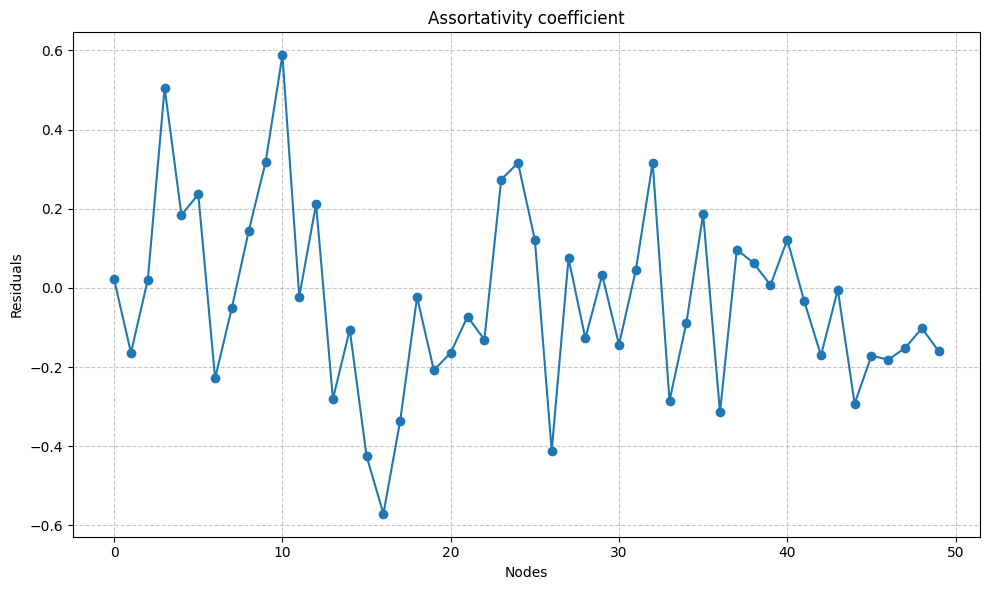

In [4]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6)) # Set the size of the plot for better readability

plt.plot(node_scores_1.values(), marker='o', linestyle='-')

# Add a horizontal line at y=0

# --- Customize the Plot ---
plt.xlabel('Nodes') # Label for the x-axis
plt.ylabel('Residuals') # Label for the y-axis, updated to reflect the ratio
plt.title('Assortativity coefficient') # Title of the plot, updated
plt.grid(True, linestyle='--', alpha=0.7) # Add a grid for easier reading
plt.tight_layout() # Adjust plot to ensure everything fits without overlapping
plt.show()

In [5]:
from framework.trainFct import *
from torch_geometric.data import Data
from framework.visuals import *

latent_dim = 2
input_dim = dimP
batch_size = 256


dataset = []
data = Data(x=torch.tensor(p_vectors_array, dtype=torch.float), 
            edge_index=adj_matrix_to_edge_index(adjacency_matrix)[0], 
            edge_labels=adj_matrix_to_edge_index(adjacency_matrix)[1],
            adjacency_matrix=torch.tensor(adjacency_matrix))
dataset.append(data)

# Select a single graph to train on
single_graph = dataset[0]

# Wrap in list for compatibility with DataLoader-like expectations
single_graph_list = [single_graph]


/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_geometric/typing.py:128: UserWarning: An issue occurred while importing 'torch-scatter'. Disabling its usage. Stacktrace: dlopen(/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_scatter/_scatter_cpu.so, 0x0006): Symbol not found: __ZN2at4_ops16div__Tensor_mode4callERNS_6TensorERKS2_NSt3__18optionalINS6_17basic_string_viewIcNS6_11char_traitsIcEEEEEE
  Referenced from: <2BF76774-0954-3F15-B7FE-8A5E5111D7DF> /Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_scatter/_scatter_cpu.so
  Expected in:     <A51C8C05-245A-3989-8D3C-9A6704422CA5> /Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch/lib/libtorch_cpu.dylib
  warnings.warn(f"An issue occurred while importing 'torch-scatter'. "
/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_geometric/typing.py:166: UserWarning: An issue occurred while importing 'torch-sparse'. Disabling its usage. Stacktrace: dlopen(/

In [6]:
dropout = 0
phase1_epochs = 2#1200
#phase1_epochs = 300
phase2_epochs = 700
#phase2_epochs = 100
lr_phase1 = 0.005
latent_dim = 2
device = "cuda" if torch.cuda.is_available() else "cpu"


encoder = MLPEncoder(
    input_dim=input_dim,
    hidden_dims=[96, 64],
    latent_dim=latent_dim,
    mlp_layers=2,
    dropout=0.2,
    activation=nn.ReLU()
)

node_decoder = NodeAttributeVariationalDecoder(
    latent_dim=latent_dim,
    output_dim=input_dim,
    #hidden_dims=[5000, 128],
    #hidden_dims=[2000, 128],
    hidden_dims=[128],
    dropout=dropout,
    activation=nn.ReLU(),
    loss_options= {
        "lambda_comp_variance": 100,
        "lambda_decoder_variance":20,
        "debug": False},
    clip_var = 30,
)

# Create KL annealing scheduler
kl_scheduler = KLAnnealingScheduler(
    anneal_start=0.0,
    #anneal_end=0.001,
    #anneal_end=0.8,
    anneal_end=1,
    anneal_steps=phase1_epochs * len(single_graph_list),
    anneal_type='sigmoid',
)

# Create initial model with only node decoder
model_phase1 = GraphVAE(
    encoder=encoder,
    decoders=[node_decoder],
    kl_scheduler=kl_scheduler,
    compute_latent_manifold=False,
)


=== Starting Phase 1: Training encoder with node feature reconstruction ===

=== Phase 1 Complete ===

=== Phase 1 Saved ===


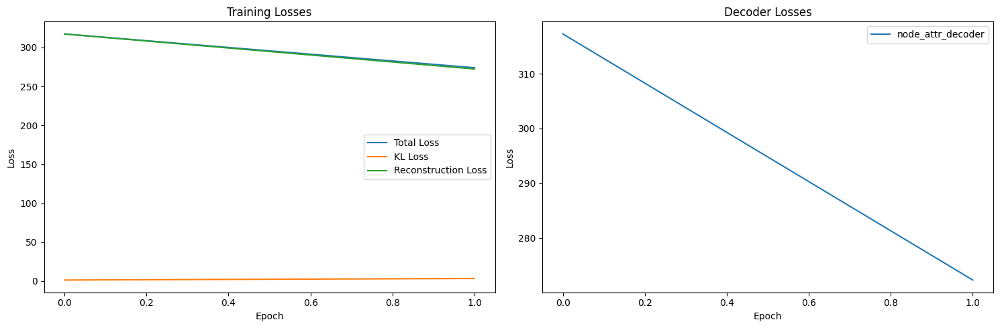

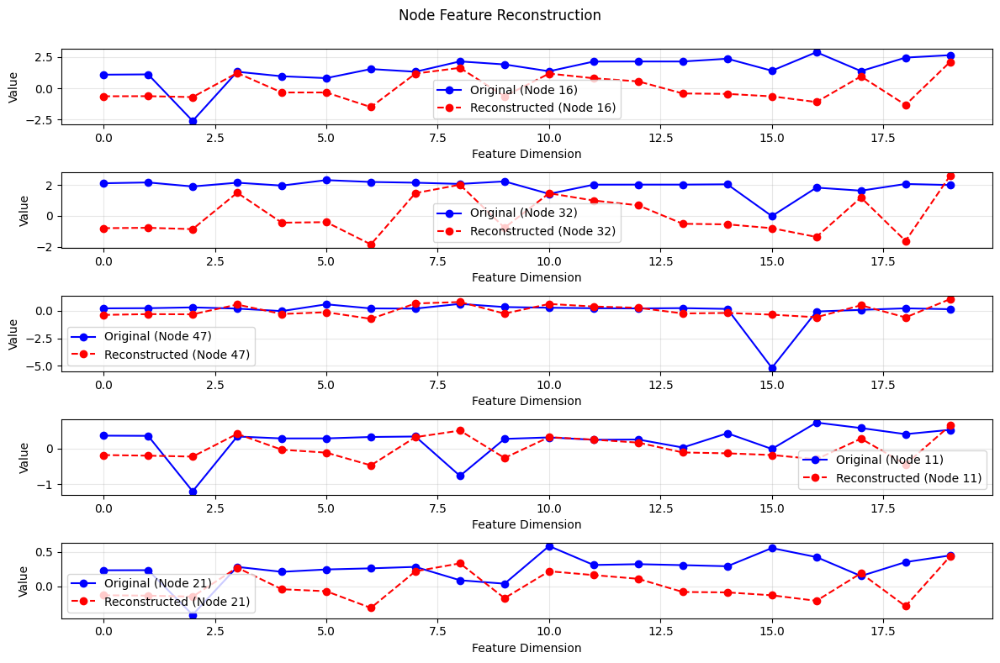

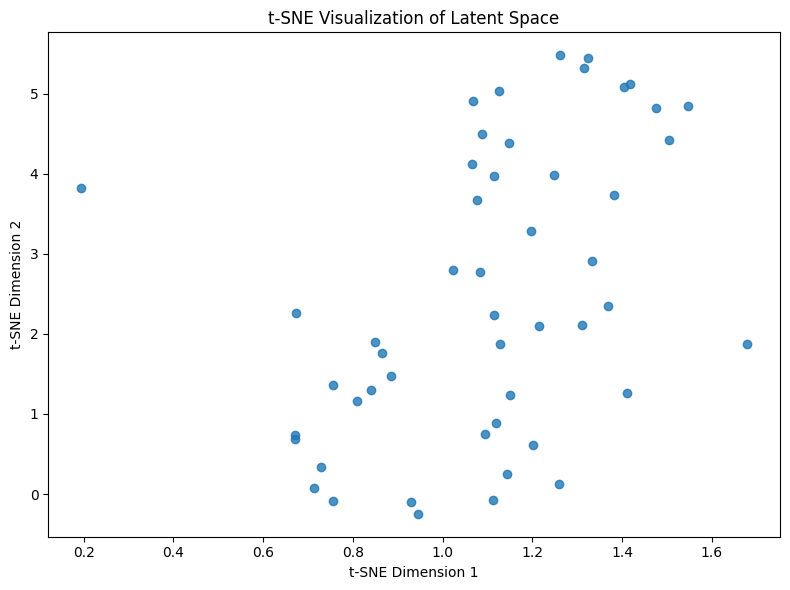

In [7]:
print("=== Starting Phase 1: Training encoder with node feature reconstruction ===")

# Phase 1 training
history_phase1 = train_phase1(
    model=model_phase1,
    data_loader=single_graph_list,
    num_epochs=phase1_epochs,
    lr=lr_phase1,
    weight_decay=1e-5,
    verbose=True,
    device=device,
    loss_coefficient=1
)

print("\n=== Phase 1 Complete ===")

torch.save(model_phase1.state_dict(), 'model_phase1_2000_3000it2.pth')
print("\n=== Phase 1 Saved ===")

visualize_training(history_phase1)
visualize_node_features_reconstruction(model_phase1, single_graph, sample_features=dimP)
visualize_latent_space(model_phase1, [single_graph])


In [8]:
model_phase1.eval()

with torch.no_grad():
    x = single_graph.x.to(device)
    edge_index = single_graph.edge_index.to(device)
    latent_mu = model_phase1.encode(x, edge_index=edge_index)

latent_points = latent_mu[0]

In [8]:
model_phase1.train_rbf_layer(
    decoder_name="node_attr_decoder",
    decoder_variance_target_name="node_features_logvar",
    latent_samples=latent_points,
    n_centers=24,  
    a=2,
    n_epochs= 20000,
    lr=0.05,
    force=True)

[RBF Training] Epoch 20/20000, Loss: 43.9616
[RBF Training] Epoch 40/20000, Loss: 45.9615
[RBF Training] Epoch 60/20000, Loss: 46.3665
[RBF Training] Epoch 80/20000, Loss: 34.3034
[RBF Training] Epoch 100/20000, Loss: 35.3009
[RBF Training] Epoch 120/20000, Loss: 37.5646
[RBF Training] Epoch 140/20000, Loss: 40.4032
[RBF Training] Epoch 160/20000, Loss: 37.8677
[RBF Training] Epoch 180/20000, Loss: 36.5288
[RBF Training] Epoch 200/20000, Loss: 37.0928
[RBF Training] Epoch 220/20000, Loss: 40.0192
[RBF Training] Epoch 240/20000, Loss: 38.8140
[RBF Training] Epoch 260/20000, Loss: 35.3381
[RBF Training] Epoch 280/20000, Loss: 39.2674
[RBF Training] Epoch 300/20000, Loss: 38.4863
[RBF Training] Epoch 320/20000, Loss: 41.8415
[RBF Training] Epoch 340/20000, Loss: 45.3874
[RBF Training] Epoch 360/20000, Loss: 40.0865
[RBF Training] Epoch 380/20000, Loss: 42.9277
[RBF Training] Epoch 400/20000, Loss: 40.7159
[RBF Training] Epoch 420/20000, Loss: 39.3997
[RBF Training] Epoch 440/20000, Loss: 

Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7077.80it/s]


Completed. Cached 10201 / 10201 points.


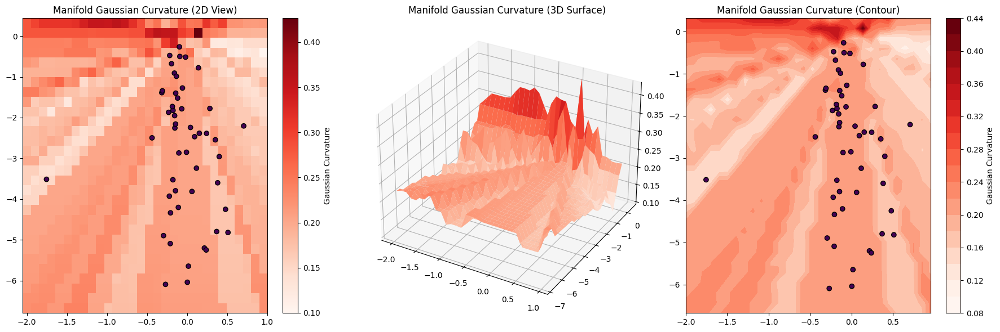

Calculating 1225 pairwise Riemannian distances using linear_interpolation_distance (batch mode)...


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 5493.90it/s]

Distance matrix calculation complete.


In [8]:
import copy
from framework.boundedManifold import BoundedManifold
from framework.torchVersions.distanceApproximations import DistanceApproximations
model_phase1 = model_phase1.to('cpu')
model_phase2 = copy.deepcopy(model_phase1)

model_phase1.eval()

with torch.no_grad():
    x = single_graph.x.to(device)
    edge_index = single_graph.edge_index.to(device)
    latent_mu = model_phase1.encode(x, edge_index=edge_index)

latent_points = latent_mu[0]

model_phase1.set_compute_latent_manifold(True)
model_phase1.construct_latent_manifold(bounds=BoundedManifold.hypercube_bounds(latent_points, margin=0.1, relative=True), force=True)
model_phase1.get_latent_manifold().compute_full_grid_metric_tensor()
model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points)

with torch.no_grad():
    dists_phase1 = model_phase1.get_latent_manifold().create_riemannian_distance_matrix(latent_points, 
                                                                                        DistanceApproximations.linear_interpolation_distance, 
                                                                                        batch_size=8, num_points=20)


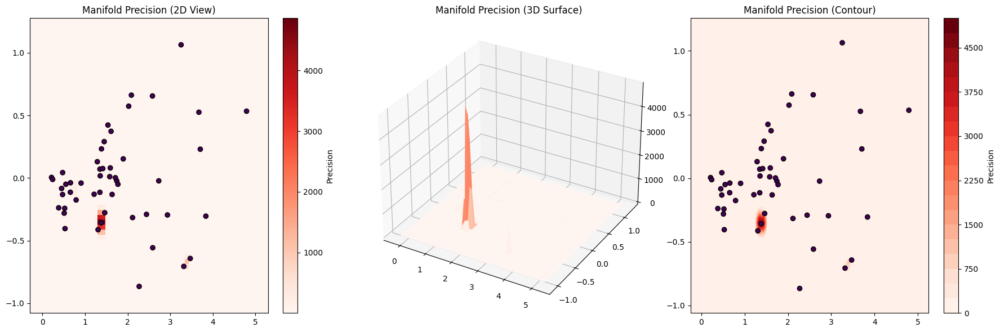

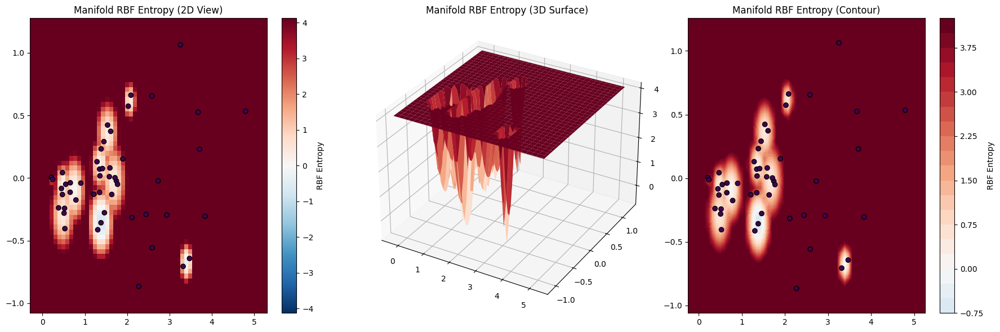

In [10]:
def pointwise_RBF_variance(z: torch.Tensor) -> float:
    return model_phase1.get_rbf_estimate(z.float()).sum()

def pointwise_RBF_entropy(z: torch.Tensor) -> float:
    logvar = -0.5 * torch.log(model_phase1.get_rbf_estimate(z.float()).sum())
    return  0.5 * ((1 + np.log(2 * np.pi)) + logvar.sum())

model_phase1.get_latent_manifold().plot_on_manifold_grid(pointwise_RBF_variance, "Precision",
                                                         data_points=latent_points, resolution=60)

model_phase1.get_latent_manifold().plot_on_manifold_grid(pointwise_RBF_entropy, "RBF Entropy",
                                                         data_points=latent_points, resolution=60)

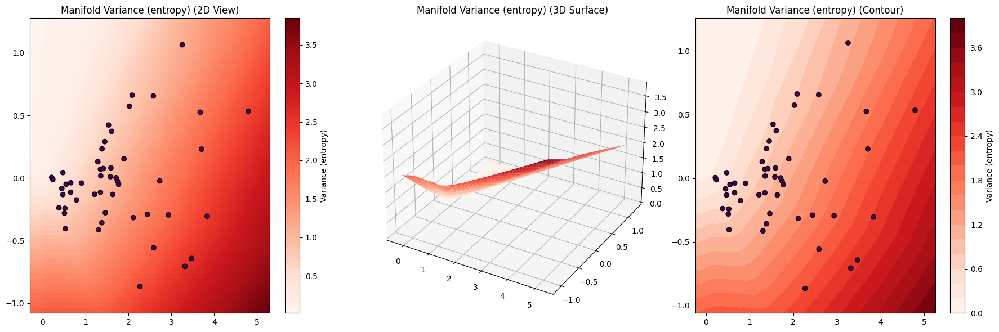

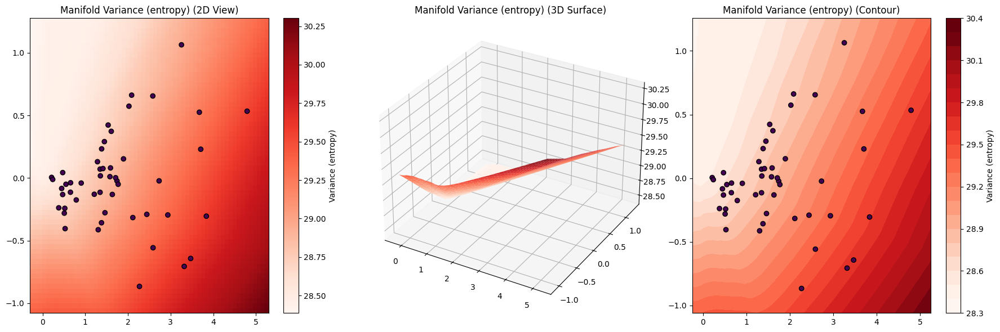

In [11]:
def pointwise_entropy(z: torch.Tensor) -> float:
    logvar = model_phase1.decode(z.float())["node_attr_decoder"]["node_features_logvar"]
    return  0.5 * (len(logvar) * (1 + np.log(2 * np.pi)) + logvar.sum())

def pointwise_variance(z: torch.Tensor) -> float:
    logvar = model_phase1.decode(z.float())["node_attr_decoder"]["node_features_logvar"]
    return logvar.sum()

model_phase1.get_latent_manifold().plot_on_manifold_grid(pointwise_variance, "Variance (entropy)",
                                                         data_points=latent_points, resolution=60)

model_phase1.get_latent_manifold().plot_on_manifold_grid(pointwise_entropy, "Variance (entropy)",
                                                         data_points=latent_points, resolution=60)

In [12]:
recon = model_phase2.decode(latent_points.unsqueeze(0))["node_attr_decoder"]["node_features_mu"].squeeze(0)

In [13]:
recon

tensor([[ 3.7957e-01, -1.1374e-01, -1.2146e-02, -7.6705e-02, -4.3105e-01,
          2.7150e-01,  1.1806e-01, -4.5487e-03, -5.9308e-02,  9.6158e-02,
         -1.4417e-01,  2.3221e-01, -1.5728e-01,  2.4155e-01, -2.2269e-01,
         -2.2536e-01,  2.0817e-01,  3.1784e-01, -1.8638e-01, -1.3195e-01],
        [ 2.1493e-01, -5.8351e-02,  1.2924e-02, -3.0725e-02, -2.1692e-01,
          1.3876e-01,  4.3025e-02, -1.6128e-02, -4.2085e-02,  7.1625e-02,
         -7.0537e-02,  1.2291e-01, -8.5564e-02,  1.3893e-01, -1.2149e-01,
         -1.2029e-01,  1.0329e-01,  1.4607e-01, -8.0277e-02, -7.2402e-02],
        [ 9.3919e-01, -1.5474e-01,  3.6439e-01,  2.8130e-01, -5.4769e-01,
          4.7965e-01, -7.6775e-02, -1.7366e-01, -3.8541e-01,  4.2128e-01,
         -2.3900e-01,  5.1894e-01, -3.6309e-01,  6.4845e-01, -5.2017e-01,
         -3.7743e-01,  3.5412e-01,  2.9512e-01, -1.3477e-02, -2.4992e-01],
        [ 1.3136e-01, -5.9865e-02, -4.3144e-02, -8.4253e-02, -2.0282e-01,
          1.1176e-01,  8.7934e-02, 

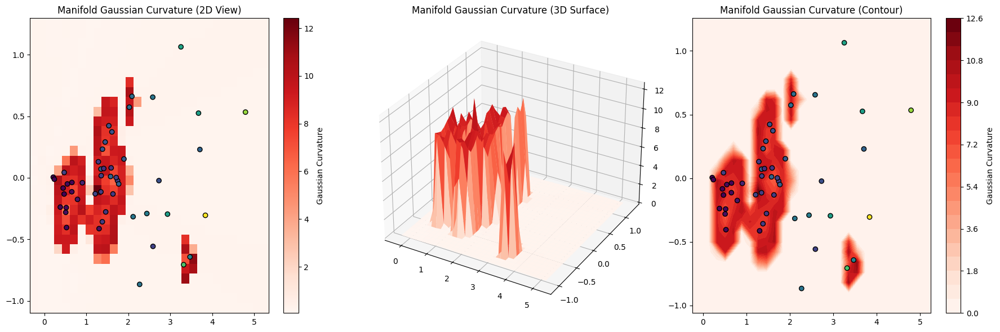

In [14]:
mse = torch.zeros(num_nodes)
entropies = torch.zeros(num_nodes)

for i in range(num_nodes):
    mse[i] = ((recon[i]-single_graph.x[i])**2).sum()
    entropies[i] = pointwise_entropy(latent_points[i])
model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points, labels=mse)

In [15]:
k = 50
topk_values, topk_indices = torch.topk(mse, k)
names[topk_indices]

array(['Vaudherland', 'Haute-Isle', 'La Chapelle-Iger', 'Vinantes',
       'Le Plessis-aux-Bois', 'Boullay-les-Troux', 'Autouillet',
       'Versailles', 'Paris 2e Arrondissement', 'Marchémoret',
       'Grisy-sur-Seine', 'Rouvres', 'Nézel', 'Pontault-Combault',
       'Isles-les-Meldeuses', 'Saint-Germain-en-Laye', 'Orly', 'Sèvres',
       'Élancourt', 'Ermont', 'Fontenay-aux-Roses', 'Saint-Maurice',
       'Marolles-en-Brie', 'Trappes', 'Morsang-sur-Seine', 'Chevru',
       'Gournay-sur-Marne', 'Gretz-Armainvilliers', 'Collégien',
       'Plaisir', 'La Frette-sur-Seine', 'Le Mesnil-Saint-Denis',
       'Gargenville', 'Sivry-Courtry', 'Châtenay-sur-Seine', 'Septeuil',
       'Le Mée-sur-Seine', 'Épône', 'Marcq', 'Les Alluets-le-Roi',
       'Nanteuil-lès-Meaux', 'Lésigny', 'Viarmes', 'Frépillon',
       'Valence-en-Brie', 'La Genevraye', 'Maulette',
       'Mézières-sur-Seine', 'Samoreau', 'Darvault'], dtype='<U28')

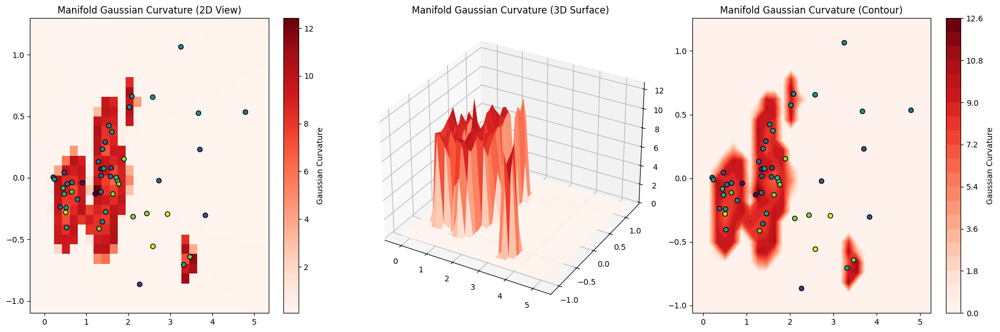

In [16]:

model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points, labels=single_graph.x[:, 10])

In [17]:
import statsmodels.api as sm
x1 = single_graph.x[:, 10].flatten().numpy().reshape(-1, 1)
x2 = entropies.detach().flatten().numpy().reshape(-1, 1)

y = mse.flatten().detach().numpy()

model = sm.OLS(x1,y)
results = model.fit()
print(results.summary())
model = sm.OLS(x2,y)
results = model.fit()
print(results.summary())

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.001
Model:                            OLS   Adj. R-squared (uncentered):             -0.019
Method:                 Least Squares   F-statistic:                            0.04634
Date:                Thu, 09 Oct 2025   Prob (F-statistic):                       0.830
Time:                        12:25:15   Log-Likelihood:                         -71.139
No. Observations:                  50   AIC:                                      144.3
Df Residuals:                      49   BIC:                                      146.2
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [18]:
torch.argmax(mse)

tensor(14)

In [19]:
names[torch.argmax(mse)]

'Vaudherland'

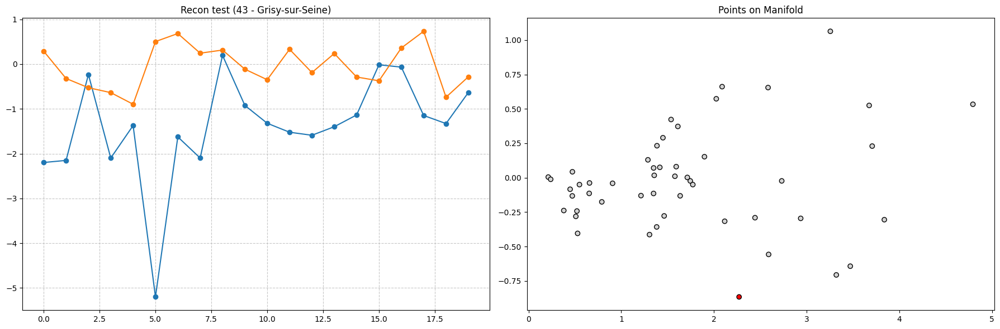

In [20]:
i = int(np.random.random() * num_nodes)
a = single_graph.x[i]
a_r = model_phase1(single_graph.x[i].unsqueeze(0))


colors = ['lightgray', 'red']
from matplotlib.colors import ListedColormap
cmap = ListedColormap(colors)

fig = plt.figure(figsize=(18, 6))
ax1 = fig.add_subplot(121)
ax1.set_title(f'Recon test ({i} - {names[i]})')
ax1.plot(a, marker='o', linestyle='-')
ax1.plot(a_r["outputs"]["node_attr_decoder"]["node_features"].detach().squeeze(), marker='o', linestyle='-')
ax1.grid(True, linestyle='--', alpha=0.7) # Add a grid for easier reading
ax2 = fig.add_subplot(122)
ax2.set_title(f'Points on Manifold')
points_np = latent_points.detach().cpu().numpy()                
labels_np = np.zeros(num_nodes)
labels_np[i] = 1
ax2.scatter(points_np[:, 0], points_np[:, 1], c=labels_np, cmap=cmap, edgecolors='k')
plt.tight_layout()
plt.show()

In [21]:
# for j in range(20):
#     weights = [p_vectors_array[i, j] for i in range(num_nodes)]

#     # 4. Plot the distribution of the weights (Histogram)
#     plt.figure(figsize=(10, 6))

#     # Plot a histogram of the weights
#     # Use 'density=True' to show probability density instead of count
#     plt.hist(weights, bins=20, edgecolor='black', alpha=0.7, density=True)


#     # Add labels and title
#     plt.title(f'Distribution of Edge Weights - i={j}')
#     plt.xlabel('Weight Value')
#     plt.ylabel('Density')
#     plt.grid(axis='y', alpha=0.5)
#     plt.show()


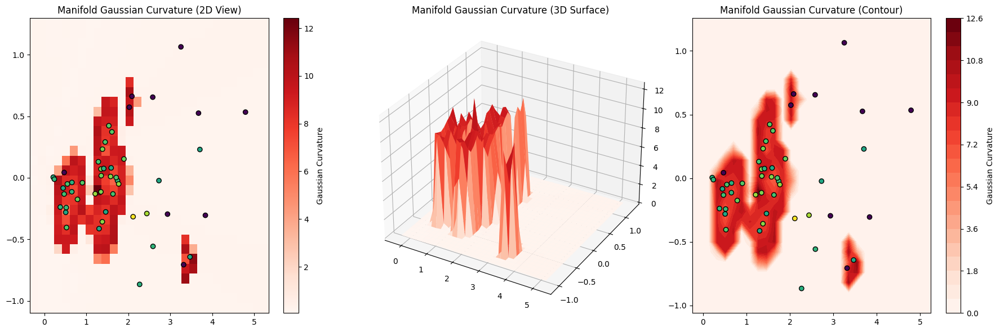

In [22]:
model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points, labels=single_graph.x[:, 16])

In [9]:
lr_phase2 = 0.0001
distance_mode = "linear_interpolation" # "linear_interpolation"

print("=== Starting Phase 2: Freezing encoder and adding adjacency decoder ===")

model_phase2.set_compute_latent_manifold(True)
model_phase2.construct_latent_manifold(bounds=BoundedManifold.hypercube_bounds(latent_points, margin=0.1, relative=True), force=True)
model_phase2.set_encoder_freeze(True)

#torch.autograd.set_detect_anomaly(True)

distance_decoder = ManifoldHeatKernelDecoder(
    distance_mode=distance_mode,
    latent_dim=latent_dim,
    #heat_time=torch.logspace(start=-1, end=2, steps=10).tolist(),  # Adjust for local vs global structure
    num_eigenvalues=500,
    num_integration_points=20,
    name="adj_decoder",
    max_ema_epochs=phase2_epochs,
    ema_lag_factor=0.1
)

# Add to your GraphVAE model
model_phase2.add_decoder(distance_decoder)

# Set reference decoder (the node attribute decoder)
#model_phase2.get_decoder("adj_decoder").giveManifoldInstance(model_phase2.get_latent_manifold())
model_phase2.get_decoder("adj_decoder").giveVAEInstance(model_phase2)

# Reset KL scheduler for phase 2
model_phase2.kl_scheduler = KLAnnealingScheduler(
    anneal_start=0,  
    anneal_end=0,
    anneal_steps=phase2_epochs * len(single_graph_list),
    anneal_type='linear'
)

torch.nn.utils.clip_grad_norm_(model_phase2.parameters(), 1)
#torch.autograd.set_detect_anomaly(True)

# Phase 2 training
history_phase2 = train_phase2(
    model=model_phase2,
    data_loader=single_graph_list,
    latent_points=latent_points,
    num_epochs=phase2_epochs,
    lr=lr_phase2,
    weight_decay=1e-5,
#    decoder_weights={"adj_decoder": -1, "node_attr_decoder":-1 },
    decoder_weights={"adj_decoder": 1, "node_attr_decoder":1e-8 },
    verbose=True,
    device=device,
)

print("\n=== Phase 2 Complete ===")



=== Starting Phase 2: Freezing encoder and adding adjacency decoder ===


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1461.84it/s]

Current sigma:  1.4516706466674805 Selected sigma:  1.4516706466674805
Selected heat times: tensor([4.5427e-02, 1.3215e-01, 3.8446e-01, 1.1184e+00, 3.2537e+00, 9.4656e+00,
        2.7537e+01, 8.0109e+01, 2.3305e+02, 6.7798e+02, 1.9724e+03, 5.7379e+03,
        1.6692e+04, 4.8561e+04, 1.4127e+05, 4.1098e+05, 1.1956e+06, 3.4782e+06,
        1.0119e+07])
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.344% | Cutoff weight=2.29e-09
Total Laplacian loss: 18.715790 - With referent sigma: 18.715790



/Users/aldric-l/Library/CloudStorage/OneDrive-Personnel/Documents/Scolarité - Aldric/Supérieur/ENS/M2 MVA/S3 Stage/Topological-GVAE/framework/geometry.py:441: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  min_log = float(torch.log10(torch.tensor(t_min)).item()) if t_min > 0.0 else clamp_min_log
/Users/aldric-l/Library/CloudStorage/OneDrive-Personnel/Documents/Scolarité - Aldric/Supérieur/ENS/M2 MVA/S3 Stage/Topological-GVAE/framework/geometry.py:442: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  max_log = float(torch.log10(torch.tensor(t_max)).item()) if t_max > 0.0 else clamp_max_log
Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2043.39it/s]


Current sigma:  1.3960638046264648 Selected sigma:  1.4461098909378052
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.536% | Cutoff weight=2.29e-09
Total Laplacian loss: 18.075220 - With referent sigma: 18.077349


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1729.72it/s]


Current sigma:  1.4606047868728638 Selected sigma:  1.4475593566894531
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.360% | Cutoff weight=2.29e-09
Total Laplacian loss: 18.551807 - With referent sigma: 18.551611


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1757.39it/s]


Current sigma:  1.5920112133026123 Selected sigma:  1.462004542350769
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.157% | Cutoff weight=2.29e-09
Total Laplacian loss: 18.916235 - With referent sigma: 18.917128


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1901.61it/s]

Current sigma:  1.5198862552642822 Selected sigma:  1.4677926301956177


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.350% | Cutoff weight=2.29e-09
Total Laplacian loss: 18.507885 - With referent sigma: 18.512867


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1868.64it/s]

Current sigma:  1.5132766962051392 Selected sigma:  1.4723410606384277


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.305% | Cutoff weight=2.29e-09
Total Laplacian loss: 18.277838 - With referent sigma: 18.274315


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1952.90it/s]

Current sigma:  1.3594183921813965 Selected sigma:  1.4610488414764404


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.531% | Cutoff weight=2.29e-09
Total Laplacian loss: 19.105562 - With referent sigma: 19.111153


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1349.16it/s]


Current sigma:  1.4119832515716553 Selected sigma:  1.4561421871185303
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.376% | Cutoff weight=2.29e-09
Total Laplacian loss: 18.409227 - With referent sigma: 18.406931


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1743.66it/s]


Current sigma:  1.5988855361938477 Selected sigma:  1.4704164266586304
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.159% | Cutoff weight=2.29e-09
Total Laplacian loss: 18.280804 - With referent sigma: 18.280130


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2008.11it/s]


Current sigma:  1.4233607053756714 Selected sigma:  1.4657108783721924
Previous heat times: tensor([4.5427e-02, 1.3215e-01, 3.8446e-01, 1.1184e+00, 3.2537e+00, 9.4656e+00,
        2.7537e+01, 8.0109e+01, 2.3305e+02, 6.7798e+02, 1.9724e+03, 5.7379e+03,
        1.6692e+04, 4.8561e+04, 1.4127e+05, 4.1098e+05, 1.1956e+06, 3.4782e+06,
        1.0119e+07])
Selected heat times: tensor([ 0.0483,  0.0648,  0.0870,  0.1169,  0.1570,  0.2109,  0.2833,  0.3804,
         0.5110,  0.6863,  0.9217,  1.2379,  1.6626,  2.2331,  2.9992,  4.0282,
         5.4102,  7.2664,  9.7594, 13.1078])
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.535% | Cutoff weight=2.29e-09
Total Laplacian loss: 67.554077 - With referent sigma: 67.499283
Phase 2 - Epoch 10/700 - Loss: 67.5541, KL: 5.9444 (weight: 0.0000), Adj: 67.5541, Node: 216.6156


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1709.82it/s]


Current sigma:  1.4414138793945312 Selected sigma:  1.4632811546325684
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.415% | Cutoff weight=2.29e-09
Total Laplacian loss: 67.012306 - With referent sigma: 66.958221


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1381.35it/s]


Current sigma:  1.4709644317626953 Selected sigma:  1.4640494585037231
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.414% | Cutoff weight=2.29e-09
Total Laplacian loss: 67.002258 - With referent sigma: 66.938705


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 449.16it/s]


Current sigma:  1.5897386074066162 Selected sigma:  1.4766182899475098
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.191% | Cutoff weight=2.29e-09
Total Laplacian loss: 66.399338 - With referent sigma: 66.244324


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1594.19it/s]


Current sigma:  1.5312601327896118 Selected sigma:  1.482082486152649
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.213% | Cutoff weight=2.29e-09
Total Laplacian loss: 65.743744 - With referent sigma: 65.496437


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1645.58it/s]


Current sigma:  1.5443800687789917 Selected sigma:  1.4883122444152832
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.243% | Cutoff weight=2.29e-09
Total Laplacian loss: 66.613373 - With referent sigma: 66.386063


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1904.06it/s]


Current sigma:  1.4931737184524536 Selected sigma:  1.4887983798980713
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.322% | Cutoff weight=2.29e-09
Total Laplacian loss: 67.296265 - With referent sigma: 67.121536


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1409.34it/s]


Current sigma:  1.5094523429870605 Selected sigma:  1.4908636808395386
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.359% | Cutoff weight=2.29e-09
Total Laplacian loss: 66.754585 - With referent sigma: 66.536827


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1818.82it/s]


Current sigma:  1.5248271226882935 Selected sigma:  1.4942600727081299
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.280% | Cutoff weight=2.29e-09
Total Laplacian loss: 67.186165 - With referent sigma: 66.977539


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1541.87it/s]


Current sigma:  1.616018295288086 Selected sigma:  1.5064358711242676
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.127% | Cutoff weight=2.29e-09
Total Laplacian loss: 65.950096 - With referent sigma: 65.552444


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1549.25it/s]


Current sigma:  1.4544787406921387 Selected sigma:  1.5012401342391968
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.393% | Cutoff weight=2.29e-09
Total Laplacian loss: 67.243973 - With referent sigma: 67.007469
Phase 2 - Epoch 20/700 - Loss: 67.2440, KL: 5.9980 (weight: 0.0000), Adj: 67.2440, Node: 228.4602


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1687.78it/s]


Freezing sigma for non-interesting changes.
Current sigma:  1.4462890625 Selected sigma:  1.5012401342391968
[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.395% | Cutoff weight=2.29e-09
Total Laplacian loss: 67.307541 - With referent sigma: 67.082779


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1734.39it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.372% | Cutoff weight=2.29e-09
Total Laplacian loss: 66.909554 - With referent sigma: 66.632980


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1859.61it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.289% | Cutoff weight=2.29e-09
Total Laplacian loss: 65.895157 - With referent sigma: 65.509483


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2003.91it/s]

[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.362% | Cutoff weight=2.29e-09


Total Laplacian loss: 66.415558 - With referent sigma: 66.110435


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1754.14it/s]

[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.000% | Cutoff weight=2.29e-09


Total Laplacian loss: 64.944153 - With referent sigma: 64.523155


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 578.95it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.925% | Cutoff weight=2.29e-09
Total Laplacian loss: 65.724495 - With referent sigma: 65.312424


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1482.27it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.183% | Cutoff weight=2.29e-09
Total Laplacian loss: 66.449966 - With referent sigma: 66.159843


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1738.66it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.201% | Cutoff weight=2.29e-09
Total Laplacian loss: 66.469910 - With referent sigma: 66.153275


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1722.48it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.266% | Cutoff weight=2.29e-09
Total Laplacian loss: 66.116783 - With referent sigma: 65.768875


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1789.77it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.261% | Cutoff weight=2.29e-09
Total Laplacian loss: 65.790901 - With referent sigma: 65.437073
Phase 2 - Epoch 30/700 - Loss: 65.7909, KL: 6.0821 (weight: 0.0000), Adj: 65.7909, Node: 219.9062


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1771.88it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.192% | Cutoff weight=2.29e-09
Total Laplacian loss: 66.459671 - With referent sigma: 66.138420


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1335.81it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.059% | Cutoff weight=2.29e-09
Total Laplacian loss: 65.711876 - With referent sigma: 65.336693


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1821.51it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.220% | Cutoff weight=2.29e-09
Total Laplacian loss: 66.703949 - With referent sigma: 66.446640


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1768.53it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.236% | Cutoff weight=2.29e-09
Total Laplacian loss: 66.452408 - With referent sigma: 66.134102


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1753.19it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.936% | Cutoff weight=2.29e-09
Total Laplacian loss: 65.653320 - With referent sigma: 65.278038


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1697.94it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.943% | Cutoff weight=2.29e-09
Total Laplacian loss: 65.658577 - With referent sigma: 65.296974


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1582.10it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.939% | Cutoff weight=2.29e-09
Total Laplacian loss: 65.355789 - With referent sigma: 64.942612


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1665.32it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.701% | Cutoff weight=2.29e-09
Total Laplacian loss: 64.423759 - With referent sigma: 63.952606


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1594.71it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.805% | Cutoff weight=2.29e-09
Total Laplacian loss: 65.251213 - With referent sigma: 64.830032


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1652.31it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.787% | Cutoff weight=2.29e-09
Total Laplacian loss: 64.433304 - With referent sigma: 63.990211
Phase 2 - Epoch 40/700 - Loss: 64.4333, KL: 7.0210 (weight: 0.0000), Adj: 64.4333, Node: 214.5629


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1636.73it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.800% | Cutoff weight=2.29e-09
Total Laplacian loss: 64.159309 - With referent sigma: 63.695183


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1774.54it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.932% | Cutoff weight=2.29e-09
Total Laplacian loss: 65.713554 - With referent sigma: 65.356926


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1778.10it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.964% | Cutoff weight=2.29e-09
Total Laplacian loss: 66.042648 - With referent sigma: 65.716484


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1662.37it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.906% | Cutoff weight=2.29e-09
Total Laplacian loss: 65.236641 - With referent sigma: 64.809372


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1679.92it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.952% | Cutoff weight=2.29e-09
Total Laplacian loss: 66.072075 - With referent sigma: 65.739830


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1590.35it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.787% | Cutoff weight=2.29e-09
Total Laplacian loss: 64.649727 - With referent sigma: 64.216797


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1779.34it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.747% | Cutoff weight=2.29e-09
Total Laplacian loss: 65.406891 - With referent sigma: 65.015579


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1862.94it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.656% | Cutoff weight=2.29e-09
Total Laplacian loss: 64.350266 - With referent sigma: 63.880020


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1857.14it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.867% | Cutoff weight=2.29e-09
Total Laplacian loss: 65.565887 - With referent sigma: 65.173935


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1926.09it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.655% | Cutoff weight=2.29e-09
Total Laplacian loss: 64.065155 - With referent sigma: 63.463329
Phase 2 - Epoch 50/700 - Loss: 64.0652, KL: 6.5648 (weight: 0.0000), Adj: 64.0652, Node: 213.5012


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1932.69it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 96.010% | Cutoff weight=2.29e-09
Total Laplacian loss: 65.545341 - With referent sigma: 65.168465


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1950.36it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.742% | Cutoff weight=2.29e-09
Total Laplacian loss: 64.962311 - With referent sigma: 64.566078


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1887.10it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.724% | Cutoff weight=2.29e-09
Total Laplacian loss: 64.567146 - With referent sigma: 64.124374


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1906.79it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.686% | Cutoff weight=2.29e-09
Total Laplacian loss: 64.466499 - With referent sigma: 64.025307


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1875.06it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.285% | Cutoff weight=2.29e-09
Total Laplacian loss: 63.706116 - With referent sigma: 63.263817


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1966.42it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.669% | Cutoff weight=2.29e-09
Total Laplacian loss: 65.143913 - With referent sigma: 64.755798


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1145.55it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.632% | Cutoff weight=2.29e-09
Total Laplacian loss: 64.438187 - With referent sigma: 63.928337


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1919.46it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.705% | Cutoff weight=2.29e-09
Total Laplacian loss: 63.974678 - With referent sigma: 63.502640


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1935.64it/s]

[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.527% | Cutoff weight=2.29e-09


Total Laplacian loss: 64.328278 - With referent sigma: 63.837490


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1884.46it/s]

[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.320% | Cutoff weight=2.29e-09


Total Laplacian loss: 63.113052 - With referent sigma: 62.668015
Phase 2 - Epoch 60/700 - Loss: 63.1131, KL: 6.9181 (weight: 0.0000), Adj: 63.1131, Node: 200.5060


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1911.89it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.798% | Cutoff weight=2.29e-09
Total Laplacian loss: 65.235718 - With referent sigma: 64.845383


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2020.50it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.548% | Cutoff weight=2.29e-09
Total Laplacian loss: 62.799767 - With referent sigma: 62.260075


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2003.33it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.504% | Cutoff weight=2.29e-09
Total Laplacian loss: 62.674774 - With referent sigma: 62.128235


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1946.31it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.418% | Cutoff weight=2.29e-09
Total Laplacian loss: 61.895313 - With referent sigma: 61.386333


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1879.53it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.404% | Cutoff weight=2.29e-09
Total Laplacian loss: 60.954460 - With referent sigma: 60.285236


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1969.11it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.112% | Cutoff weight=2.29e-09
Total Laplacian loss: 62.883846 - With referent sigma: 62.386913


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1985.02it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.637% | Cutoff weight=2.29e-09
Total Laplacian loss: 64.165474 - With referent sigma: 63.677399


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1975.12it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.698% | Cutoff weight=2.29e-09
Total Laplacian loss: 64.158463 - With referent sigma: 63.694271


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1967.27it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.265% | Cutoff weight=2.29e-09
Total Laplacian loss: 61.943939 - With referent sigma: 61.447868


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1557.59it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.526% | Cutoff weight=2.29e-09
Total Laplacian loss: 64.785294 - With referent sigma: 64.321739
Phase 2 - Epoch 70/700 - Loss: 64.7853, KL: 6.6887 (weight: 0.0000), Adj: 64.7853, Node: 179.7141


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1859.38it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 94.990% | Cutoff weight=2.29e-09
Total Laplacian loss: 60.136421 - With referent sigma: 59.693375


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1868.82it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.400% | Cutoff weight=2.29e-09
Total Laplacian loss: 63.231220 - With referent sigma: 62.717842


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1870.48it/s]


[DEBUG] RBF sparsity: 2.16% zeros | Energy retained: 95.083% | Cutoff weight=2.29e-09
Total Laplacian loss: 62.906162 - With referent sigma: 62.443493


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1456.94it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.343% | Cutoff weight=2.29e-09
Total Laplacian loss: 61.800697 - With referent sigma: 61.250080


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1954.09it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.071% | Cutoff weight=2.29e-09
Total Laplacian loss: 62.722744 - With referent sigma: 62.254639


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1656.36it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 94.986% | Cutoff weight=2.29e-09
Total Laplacian loss: 60.785538 - With referent sigma: 60.332321


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1896.81it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.435% | Cutoff weight=2.29e-09
Total Laplacian loss: 63.761127 - With referent sigma: 63.307236


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1925.27it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.334% | Cutoff weight=2.29e-09
Total Laplacian loss: 62.963982 - With referent sigma: 62.458290


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1966.07it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.370% | Cutoff weight=2.29e-09
Total Laplacian loss: 63.274319 - With referent sigma: 62.750572


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1927.53it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 94.931% | Cutoff weight=2.29e-09
Total Laplacian loss: 62.681282 - With referent sigma: 62.152313
Phase 2 - Epoch 80/700 - Loss: 62.6813, KL: 7.6883 (weight: 0.0000), Adj: 62.6813, Node: 189.8392


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2032.39it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.032% | Cutoff weight=2.29e-09
Total Laplacian loss: 61.183762 - With referent sigma: 60.596336


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1914.90it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.369% | Cutoff weight=2.29e-09
Total Laplacian loss: 63.103622 - With referent sigma: 62.584667


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1863.53it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.006% | Cutoff weight=2.29e-09
Total Laplacian loss: 61.604141 - With referent sigma: 60.913116


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1844.82it/s]

[DEBUG] RBF sparsity: 2.08% zeros | Energy retained: 94.708% | Cutoff weight=2.29e-09


Total Laplacian loss: 59.299000 - With referent sigma: 58.772865


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1963.26it/s]

[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 94.969% | Cutoff weight=2.29e-09


Total Laplacian loss: 60.560684 - With referent sigma: 59.924667


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1048.46it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 94.911% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.994305 - With referent sigma: 59.613762


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1832.05it/s]


[DEBUG] RBF sparsity: 2.32% zeros | Energy retained: 95.096% | Cutoff weight=2.29e-09
Total Laplacian loss: 63.336685 - With referent sigma: 62.830307


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1921.42it/s]


[DEBUG] RBF sparsity: 2.08% zeros | Energy retained: 94.705% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.857464 - With referent sigma: 59.383976


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 651.99it/s]


[DEBUG] RBF sparsity: 4.16% zeros | Energy retained: 94.767% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.828903 - With referent sigma: 56.353172


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2009.21it/s]


[DEBUG] RBF sparsity: 2.24% zeros | Energy retained: 94.865% | Cutoff weight=2.29e-09
Total Laplacian loss: 61.266766 - With referent sigma: 60.684898
Phase 2 - Epoch 90/700 - Loss: 61.2668, KL: 6.5824 (weight: 0.0000), Adj: 61.2668, Node: 237.0887


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1936.30it/s]


[DEBUG] RBF sparsity: 2.24% zeros | Energy retained: 94.839% | Cutoff weight=2.29e-09
Total Laplacian loss: 60.818642 - With referent sigma: 60.390686


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1964.41it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 94.964% | Cutoff weight=2.29e-09
Total Laplacian loss: 61.565002 - With referent sigma: 61.071171


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2010.60it/s]


[DEBUG] RBF sparsity: 2.24% zeros | Energy retained: 95.254% | Cutoff weight=2.29e-09
Total Laplacian loss: 63.431736 - With referent sigma: 62.925079


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2024.83it/s]

[DEBUG] RBF sparsity: 2.96% zeros | Energy retained: 94.771% | Cutoff weight=2.29e-09


Total Laplacian loss: 61.272804 - With referent sigma: 60.716797


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1932.10it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 94.794% | Cutoff weight=2.29e-09
Total Laplacian loss: 60.432808 - With referent sigma: 59.976562


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2063.26it/s]


[DEBUG] RBF sparsity: 2.72% zeros | Energy retained: 94.961% | Cutoff weight=2.29e-09
Total Laplacian loss: 61.475857 - With referent sigma: 60.933266


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1939.87it/s]


[DEBUG] RBF sparsity: 2.80% zeros | Energy retained: 94.976% | Cutoff weight=2.29e-09
Total Laplacian loss: 63.419640 - With referent sigma: 62.880634


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2064.54it/s]


[DEBUG] RBF sparsity: 2.32% zeros | Energy retained: 94.763% | Cutoff weight=2.29e-09
Total Laplacian loss: 61.331932 - With referent sigma: 60.849724


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2058.79it/s]


[DEBUG] RBF sparsity: 2.88% zeros | Energy retained: 95.088% | Cutoff weight=2.29e-09
Total Laplacian loss: 63.685181 - With referent sigma: 63.171310


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2058.71it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 95.038% | Cutoff weight=2.29e-09
Total Laplacian loss: 61.014225 - With referent sigma: 60.418152
Phase 2 - Epoch 100/700 - Loss: 61.0142, KL: 6.2658 (weight: 0.0000), Adj: 61.0142, Node: 184.5473


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1958.26it/s]


[DEBUG] RBF sparsity: 2.72% zeros | Energy retained: 94.425% | Cutoff weight=2.29e-09
Total Laplacian loss: 60.086658 - With referent sigma: 59.553795


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1976.49it/s]


[DEBUG] RBF sparsity: 2.24% zeros | Energy retained: 94.632% | Cutoff weight=2.29e-09
Total Laplacian loss: 61.625061 - With referent sigma: 61.114586


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1608.76it/s]


[DEBUG] RBF sparsity: 2.48% zeros | Energy retained: 94.816% | Cutoff weight=2.29e-09
Total Laplacian loss: 62.090096 - With referent sigma: 61.538662


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1942.14it/s]


[DEBUG] RBF sparsity: 2.40% zeros | Energy retained: 94.724% | Cutoff weight=2.29e-09
Total Laplacian loss: 60.396976 - With referent sigma: 59.862156


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2078.92it/s]


[DEBUG] RBF sparsity: 2.80% zeros | Energy retained: 94.707% | Cutoff weight=2.29e-09
Total Laplacian loss: 61.000175 - With referent sigma: 60.550774


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1997.15it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 94.767% | Cutoff weight=2.29e-09
Total Laplacian loss: 60.138805 - With referent sigma: 59.634335


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1885.20it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 94.622% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.681923 - With referent sigma: 59.177650


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1945.60it/s]


[DEBUG] RBF sparsity: 2.56% zeros | Energy retained: 94.456% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.877186 - With referent sigma: 59.403416


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1942.95it/s]


[DEBUG] RBF sparsity: 3.36% zeros | Energy retained: 94.583% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.025589 - With referent sigma: 58.386238


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1963.16it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 94.820% | Cutoff weight=2.29e-09
Total Laplacian loss: 60.985523 - With referent sigma: 60.403069
Phase 2 - Epoch 110/700 - Loss: 60.9855, KL: 5.6072 (weight: 0.0000), Adj: 60.9855, Node: 195.7657


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1915.73it/s]


[DEBUG] RBF sparsity: 3.28% zeros | Energy retained: 94.259% | Cutoff weight=2.29e-09
Total Laplacian loss: 60.652287 - With referent sigma: 60.172562


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2054.78it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 94.457% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.893272 - With referent sigma: 58.484993


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1977.73it/s]


[DEBUG] RBF sparsity: 2.64% zeros | Energy retained: 94.053% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.076675 - With referent sigma: 57.584068


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2089.83it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 94.538% | Cutoff weight=2.29e-09
Total Laplacian loss: 60.007126 - With referent sigma: 59.460052


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1885.57it/s]


[DEBUG] RBF sparsity: 2.32% zeros | Energy retained: 94.493% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.944450 - With referent sigma: 59.471985


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1029.53it/s]


[DEBUG] RBF sparsity: 4.32% zeros | Energy retained: 94.543% | Cutoff weight=2.29e-09
Total Laplacian loss: 60.264702 - With referent sigma: 59.785202


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1988.24it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 94.731% | Cutoff weight=2.29e-09
Total Laplacian loss: 60.241356 - With referent sigma: 59.678730


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1969.28it/s]


[DEBUG] RBF sparsity: 2.00% zeros | Energy retained: 94.472% | Cutoff weight=2.29e-09
Total Laplacian loss: 60.158417 - With referent sigma: 59.661728


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1903.40it/s]


[DEBUG] RBF sparsity: 4.32% zeros | Energy retained: 94.220% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.266552 - With referent sigma: 57.855068


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2038.22it/s]


[DEBUG] RBF sparsity: 3.60% zeros | Energy retained: 94.155% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.684063 - With referent sigma: 58.158264
Phase 2 - Epoch 120/700 - Loss: 58.6841, KL: 6.6716 (weight: 0.0000), Adj: 58.6841, Node: 219.9359


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1948.40it/s]

[DEBUG] RBF sparsity: 2.80% zeros | Energy retained: 94.154% | Cutoff weight=2.29e-09


Total Laplacian loss: 58.504471 - With referent sigma: 58.065422


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2050.79it/s]

[DEBUG] RBF sparsity: 3.68% zeros | Energy retained: 94.416% | Cutoff weight=2.29e-09


Total Laplacian loss: 58.979427 - With referent sigma: 58.413071


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1899.80it/s]


[DEBUG] RBF sparsity: 2.08% zeros | Energy retained: 94.091% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.503246 - With referent sigma: 58.211800


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1888.65it/s]


[DEBUG] RBF sparsity: 5.20% zeros | Energy retained: 94.074% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.899139 - With referent sigma: 55.546207


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2062.93it/s]


[DEBUG] RBF sparsity: 2.64% zeros | Energy retained: 94.377% | Cutoff weight=2.29e-09
Total Laplacian loss: 60.277271 - With referent sigma: 59.817539


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1926.04it/s]


[DEBUG] RBF sparsity: 4.96% zeros | Energy retained: 93.911% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.382431 - With referent sigma: 55.892952


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1971.30it/s]


[DEBUG] RBF sparsity: 3.52% zeros | Energy retained: 94.164% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.420231 - With referent sigma: 58.207924


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1883.82it/s]


[DEBUG] RBF sparsity: 3.44% zeros | Energy retained: 94.202% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.492676 - With referent sigma: 56.962311


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1970.32it/s]

[DEBUG] RBF sparsity: 2.88% zeros | Energy retained: 94.198% | Cutoff weight=2.29e-09


Total Laplacian loss: 59.471909 - With referent sigma: 59.110325


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1988.41it/s]

[DEBUG] RBF sparsity: 3.20% zeros | Energy retained: 94.513% | Cutoff weight=2.29e-09
Total Laplacian loss: 61.221630 - With referent sigma: 60.721943


Phase 2 - Epoch 130/700 - Loss: 61.2216, KL: 6.3799 (weight: 0.0000), Adj: 61.2216, Node: 219.8184


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1840.62it/s]

[DEBUG] RBF sparsity: 3.76% zeros | Energy retained: 93.825% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.204346 - With referent sigma: 58.769382



Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1957.62it/s]


[DEBUG] RBF sparsity: 4.08% zeros | Energy retained: 94.136% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.962795 - With referent sigma: 59.454506


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2014.76it/s]


[DEBUG] RBF sparsity: 2.64% zeros | Energy retained: 94.134% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.099480 - With referent sigma: 58.725769


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1880.98it/s]


[DEBUG] RBF sparsity: 2.56% zeros | Energy retained: 93.948% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.499123 - With referent sigma: 56.150902


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1873.91it/s]


[DEBUG] RBF sparsity: 4.88% zeros | Energy retained: 93.958% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.039948 - With referent sigma: 58.592804


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1605.62it/s]


[DEBUG] RBF sparsity: 3.04% zeros | Energy retained: 94.125% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.595909 - With referent sigma: 59.100174


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1896.88it/s]


[DEBUG] RBF sparsity: 3.20% zeros | Energy retained: 94.026% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.366070 - With referent sigma: 57.854916


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1919.38it/s]


[DEBUG] RBF sparsity: 2.88% zeros | Energy retained: 94.033% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.551788 - With referent sigma: 59.299503


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2004.06it/s]


[DEBUG] RBF sparsity: 3.60% zeros | Energy retained: 94.102% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.938705 - With referent sigma: 59.438259


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1980.55it/s]

[DEBUG] RBF sparsity: 4.48% zeros | Energy retained: 94.163% | Cutoff weight=2.29e-09


Total Laplacian loss: 60.882805 - With referent sigma: 60.295765
Phase 2 - Epoch 140/700 - Loss: 60.8828, KL: 7.6379 (weight: 0.0000), Adj: 60.8828, Node: 272.4453


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1880.57it/s]

[DEBUG] RBF sparsity: 4.00% zeros | Energy retained: 93.678% | Cutoff weight=2.29e-09


Total Laplacian loss: 58.305580 - With referent sigma: 58.006020


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1936.89it/s]


[DEBUG] RBF sparsity: 5.68% zeros | Energy retained: 93.787% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.034332 - With referent sigma: 55.641056


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 513.64it/s]


[DEBUG] RBF sparsity: 3.84% zeros | Energy retained: 93.909% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.323860 - With referent sigma: 55.910995


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1976.51it/s]


[DEBUG] RBF sparsity: 3.60% zeros | Energy retained: 93.915% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.558434 - With referent sigma: 58.287731


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1859.13it/s]


[DEBUG] RBF sparsity: 8.16% zeros | Energy retained: 93.726% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.476933 - With referent sigma: 55.256622


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1909.84it/s]


[DEBUG] RBF sparsity: 5.76% zeros | Energy retained: 93.461% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.910576 - With referent sigma: 57.721291


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2002.23it/s]


[DEBUG] RBF sparsity: 3.60% zeros | Energy retained: 94.121% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.932400 - With referent sigma: 56.552818


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2079.14it/s]


[DEBUG] RBF sparsity: 3.12% zeros | Energy retained: 93.945% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.260475 - With referent sigma: 57.750908


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1941.84it/s]


[DEBUG] RBF sparsity: 6.16% zeros | Energy retained: 93.765% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.532387 - With referent sigma: 55.983322


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1984.16it/s]


[DEBUG] RBF sparsity: 5.44% zeros | Energy retained: 93.796% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.335762 - With referent sigma: 57.909447
Phase 2 - Epoch 150/700 - Loss: 58.3358, KL: 6.6816 (weight: 0.0000), Adj: 58.3358, Node: 357.7373


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1809.53it/s]


[DEBUG] RBF sparsity: 6.56% zeros | Energy retained: 93.419% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.452034 - With referent sigma: 56.054455


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1987.50it/s]


[DEBUG] RBF sparsity: 5.92% zeros | Energy retained: 93.722% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.992329 - With referent sigma: 55.658630


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1854.28it/s]


[DEBUG] RBF sparsity: 5.28% zeros | Energy retained: 93.448% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.566471 - With referent sigma: 56.201839


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1990.82it/s]


[DEBUG] RBF sparsity: 7.60% zeros | Energy retained: 94.311% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.250900 - With referent sigma: 55.047207


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1896.76it/s]


[DEBUG] RBF sparsity: 9.36% zeros | Energy retained: 93.165% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.107681 - With referent sigma: 53.966038


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1983.49it/s]


[DEBUG] RBF sparsity: 5.04% zeros | Energy retained: 93.671% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.613052 - With referent sigma: 56.002350


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1986.82it/s]

[DEBUG] RBF sparsity: 6.48% zeros | Energy retained: 93.757% | Cutoff weight=2.29e-09


Total Laplacian loss: 57.014580 - With referent sigma: 56.577950


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1744.75it/s]


[DEBUG] RBF sparsity: 6.72% zeros | Energy retained: 92.941% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.543358 - With referent sigma: 55.317421


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1930.74it/s]


[DEBUG] RBF sparsity: 8.16% zeros | Energy retained: 93.386% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.227631 - With referent sigma: 56.820473


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1913.62it/s]


[DEBUG] RBF sparsity: 5.28% zeros | Energy retained: 93.726% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.828552 - With referent sigma: 56.602074
Phase 2 - Epoch 160/700 - Loss: 56.8286, KL: 6.7141 (weight: 0.0000), Adj: 56.8286, Node: 288.2106


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2018.22it/s]


[DEBUG] RBF sparsity: 3.04% zeros | Energy retained: 93.424% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.099380 - With referent sigma: 57.756756


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2004.84it/s]

[DEBUG] RBF sparsity: 4.88% zeros | Energy retained: 93.377% | Cutoff weight=2.29e-09


Total Laplacian loss: 56.985424 - With referent sigma: 56.652191


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1913.30it/s]


[DEBUG] RBF sparsity: 7.68% zeros | Energy retained: 93.377% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.416733 - With referent sigma: 55.118855


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1856.59it/s]


[DEBUG] RBF sparsity: 7.36% zeros | Energy retained: 93.659% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.782417 - With referent sigma: 54.430714


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1860.64it/s]


[DEBUG] RBF sparsity: 7.28% zeros | Energy retained: 93.024% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.018089 - With referent sigma: 56.728867


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2010.84it/s]


[DEBUG] RBF sparsity: 4.40% zeros | Energy retained: 93.568% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.811165 - With referent sigma: 57.501362


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1932.37it/s]


[DEBUG] RBF sparsity: 6.72% zeros | Energy retained: 93.475% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.605389 - With referent sigma: 56.171627


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1913.02it/s]


[DEBUG] RBF sparsity: 6.56% zeros | Energy retained: 93.763% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.201149 - With referent sigma: 58.806274


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1970.19it/s]


[DEBUG] RBF sparsity: 5.84% zeros | Energy retained: 93.417% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.619606 - With referent sigma: 57.317917


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1951.67it/s]


[DEBUG] RBF sparsity: 6.40% zeros | Energy retained: 93.019% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.676956 - With referent sigma: 57.659645
Phase 2 - Epoch 170/700 - Loss: 57.6770, KL: 6.6346 (weight: 0.0000), Adj: 57.6770, Node: 317.3682


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1908.54it/s]


[DEBUG] RBF sparsity: 5.36% zeros | Energy retained: 93.203% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.607765 - With referent sigma: 56.230099


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1985.35it/s]


[DEBUG] RBF sparsity: 6.48% zeros | Energy retained: 93.473% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.721741 - With referent sigma: 56.473747


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1931.42it/s]


[DEBUG] RBF sparsity: 5.04% zeros | Energy retained: 93.354% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.904533 - With referent sigma: 56.463215


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1924.83it/s]


[DEBUG] RBF sparsity: 8.08% zeros | Energy retained: 92.783% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.021114 - With referent sigma: 57.905247


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 394.67it/s]


[DEBUG] RBF sparsity: 9.84% zeros | Energy retained: 93.166% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.573845 - With referent sigma: 55.411190


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1909.79it/s]


[DEBUG] RBF sparsity: 4.08% zeros | Energy retained: 93.527% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.446819 - With referent sigma: 58.113014


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1880.73it/s]


[DEBUG] RBF sparsity: 9.60% zeros | Energy retained: 93.085% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.007092 - With referent sigma: 57.805573


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2001.48it/s]


[DEBUG] RBF sparsity: 3.84% zeros | Energy retained: 93.452% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.610561 - With referent sigma: 57.253334


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2124.31it/s]


[DEBUG] RBF sparsity: 2.64% zeros | Energy retained: 94.036% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.308823 - With referent sigma: 58.939636


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2102.82it/s]


[DEBUG] RBF sparsity: 5.52% zeros | Energy retained: 93.764% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.256966 - With referent sigma: 57.257359
Phase 2 - Epoch 180/700 - Loss: 57.2570, KL: 6.5471 (weight: 0.0000), Adj: 57.2570, Node: 321.9771


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1920.67it/s]


[DEBUG] RBF sparsity: 5.76% zeros | Energy retained: 93.021% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.362690 - With referent sigma: 57.141281


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2033.30it/s]


[DEBUG] RBF sparsity: 5.44% zeros | Energy retained: 93.394% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.844234 - With referent sigma: 56.482353


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1932.47it/s]


[DEBUG] RBF sparsity: 6.88% zeros | Energy retained: 92.901% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.715069 - With referent sigma: 56.397488


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1962.84it/s]


[DEBUG] RBF sparsity: 6.56% zeros | Energy retained: 92.883% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.244041 - With referent sigma: 55.957897


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1963.63it/s]


[DEBUG] RBF sparsity: 6.24% zeros | Energy retained: 93.510% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.806725 - With referent sigma: 55.479359


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1910.93it/s]


[DEBUG] RBF sparsity: 7.20% zeros | Energy retained: 92.836% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.111946 - With referent sigma: 55.822784


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1913.75it/s]


[DEBUG] RBF sparsity: 7.84% zeros | Energy retained: 92.864% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.822845 - With referent sigma: 55.778091


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2006.62it/s]


[DEBUG] RBF sparsity: 6.96% zeros | Energy retained: 93.396% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.548836 - With referent sigma: 57.206921


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1962.58it/s]

[DEBUG] RBF sparsity: 10.56% zeros | Energy retained: 92.919% | Cutoff weight=2.29e-09


Total Laplacian loss: 56.847752 - With referent sigma: 57.285671


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1787.50it/s]


[DEBUG] RBF sparsity: 7.76% zeros | Energy retained: 93.351% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.793526 - With referent sigma: 55.544765
Phase 2 - Epoch 190/700 - Loss: 55.7935, KL: 6.6476 (weight: 0.0000), Adj: 55.7935, Node: 358.4514


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1957.27it/s]


[DEBUG] RBF sparsity: 7.44% zeros | Energy retained: 93.053% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.872482 - With referent sigma: 54.773518


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1814.32it/s]


[DEBUG] RBF sparsity: 7.92% zeros | Energy retained: 92.986% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.407566 - With referent sigma: 55.041527


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1964.51it/s]


[DEBUG] RBF sparsity: 4.24% zeros | Energy retained: 93.363% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.596054 - With referent sigma: 57.485058


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1966.02it/s]


[DEBUG] RBF sparsity: 8.64% zeros | Energy retained: 92.919% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.554165 - With referent sigma: 56.251850


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1578.14it/s]


[DEBUG] RBF sparsity: 6.48% zeros | Energy retained: 93.105% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.438229 - With referent sigma: 57.400372


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1989.17it/s]


[DEBUG] RBF sparsity: 7.68% zeros | Energy retained: 93.202% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.972469 - With referent sigma: 56.751221


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1979.25it/s]


[DEBUG] RBF sparsity: 5.44% zeros | Energy retained: 93.503% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.897552 - With referent sigma: 58.476913


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1920.03it/s]

[DEBUG] RBF sparsity: 5.68% zeros | Energy retained: 92.989% | Cutoff weight=2.29e-09


Total Laplacian loss: 57.134941 - With referent sigma: 56.936867


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1891.71it/s]


[DEBUG] RBF sparsity: 7.44% zeros | Energy retained: 92.631% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.857353 - With referent sigma: 55.659996


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1929.46it/s]


[DEBUG] RBF sparsity: 6.80% zeros | Energy retained: 93.330% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.194790 - With referent sigma: 55.916462
Phase 2 - Epoch 200/700 - Loss: 56.1948, KL: 6.1095 (weight: 0.0000), Adj: 56.1948, Node: 356.5239


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2062.60it/s]


[DEBUG] RBF sparsity: 4.96% zeros | Energy retained: 93.406% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.947739 - With referent sigma: 56.515907


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1912.68it/s]


[DEBUG] RBF sparsity: 8.72% zeros | Energy retained: 93.530% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.318115 - With referent sigma: 54.248711


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1899.45it/s]


[DEBUG] RBF sparsity: 7.52% zeros | Energy retained: 92.706% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.208603 - With referent sigma: 57.160671


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 568.92it/s]


[DEBUG] RBF sparsity: 6.16% zeros | Energy retained: 93.066% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.786217 - With referent sigma: 56.592525


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1853.74it/s]


[DEBUG] RBF sparsity: 10.56% zeros | Energy retained: 92.854% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.199455 - With referent sigma: 55.113258


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1873.43it/s]


[DEBUG] RBF sparsity: 8.08% zeros | Energy retained: 93.598% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.747452 - With referent sigma: 54.550034


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1893.34it/s]


[DEBUG] RBF sparsity: 9.76% zeros | Energy retained: 92.617% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.511665 - With referent sigma: 56.216286


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1963.36it/s]


[DEBUG] RBF sparsity: 6.72% zeros | Energy retained: 92.997% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.363167 - With referent sigma: 58.370686


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2030.78it/s]


[DEBUG] RBF sparsity: 7.36% zeros | Energy retained: 93.013% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.852501 - With referent sigma: 54.508423


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1594.80it/s]


[DEBUG] RBF sparsity: 5.28% zeros | Energy retained: 93.279% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.385273 - With referent sigma: 58.115585
Phase 2 - Epoch 210/700 - Loss: 58.3853, KL: 6.0994 (weight: 0.0000), Adj: 58.3853, Node: 278.7275


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2054.35it/s]


[DEBUG] RBF sparsity: 7.68% zeros | Energy retained: 93.310% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.095646 - With referent sigma: 53.807220


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1808.97it/s]


[DEBUG] RBF sparsity: 11.36% zeros | Energy retained: 92.439% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.022541 - With referent sigma: 55.977043


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1986.24it/s]


[DEBUG] RBF sparsity: 7.44% zeros | Energy retained: 93.233% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.298771 - With referent sigma: 55.149590


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1972.81it/s]


[DEBUG] RBF sparsity: 11.52% zeros | Energy retained: 93.004% | Cutoff weight=2.29e-09
Total Laplacian loss: 52.871841 - With referent sigma: 52.698521


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1938.25it/s]


[DEBUG] RBF sparsity: 5.92% zeros | Energy retained: 93.411% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.211975 - With referent sigma: 57.760620


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1954.89it/s]


[DEBUG] RBF sparsity: 6.24% zeros | Energy retained: 93.161% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.933727 - With referent sigma: 55.563938


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1812.34it/s]


[DEBUG] RBF sparsity: 9.92% zeros | Energy retained: 92.584% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.747425 - With referent sigma: 56.567017


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1774.01it/s]


[DEBUG] RBF sparsity: 6.32% zeros | Energy retained: 92.680% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.140007 - With referent sigma: 53.671494


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1407.55it/s]


[DEBUG] RBF sparsity: 7.28% zeros | Energy retained: 92.526% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.410084 - With referent sigma: 58.359440


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1816.32it/s]


[DEBUG] RBF sparsity: 9.52% zeros | Energy retained: 92.902% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.685722 - With referent sigma: 56.510387
Phase 2 - Epoch 220/700 - Loss: 56.6857, KL: 7.4603 (weight: 0.0000), Adj: 56.6857, Node: 438.9313


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 828.80it/s]


[DEBUG] RBF sparsity: 8.00% zeros | Energy retained: 92.878% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.032581 - With referent sigma: 57.960670


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1839.07it/s]


[DEBUG] RBF sparsity: 9.60% zeros | Energy retained: 93.071% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.388885 - With referent sigma: 55.284599


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2067.14it/s]


[DEBUG] RBF sparsity: 6.00% zeros | Energy retained: 93.352% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.224510 - With referent sigma: 58.776539


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1939.77it/s]


[DEBUG] RBF sparsity: 10.56% zeros | Energy retained: 93.048% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.178261 - With referent sigma: 56.021820


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1752.69it/s]


[DEBUG] RBF sparsity: 11.44% zeros | Energy retained: 92.198% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.669983 - With referent sigma: 54.537155


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1899.81it/s]


[DEBUG] RBF sparsity: 8.80% zeros | Energy retained: 92.649% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.813465 - With referent sigma: 54.391968


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1932.49it/s]


[DEBUG] RBF sparsity: 13.12% zeros | Energy retained: 92.583% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.202744 - With referent sigma: 55.225060


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1976.48it/s]


[DEBUG] RBF sparsity: 6.72% zeros | Energy retained: 93.217% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.375660 - With referent sigma: 58.123878


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1882.59it/s]

[DEBUG] RBF sparsity: 10.56% zeros | Energy retained: 92.559% | Cutoff weight=2.29e-09


Total Laplacian loss: 55.787312 - With referent sigma: 55.671677


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1854.12it/s]


[DEBUG] RBF sparsity: 6.96% zeros | Energy retained: 92.486% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.550106 - With referent sigma: 57.430557
Phase 2 - Epoch 230/700 - Loss: 57.5501, KL: 7.0605 (weight: 0.0000), Adj: 57.5501, Node: 304.0959


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1973.22it/s]


[DEBUG] RBF sparsity: 8.32% zeros | Energy retained: 93.009% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.175560 - With referent sigma: 56.453667


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2136.43it/s]


[DEBUG] RBF sparsity: 5.36% zeros | Energy retained: 93.269% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.452248 - With referent sigma: 57.469082


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1983.71it/s]


[DEBUG] RBF sparsity: 9.76% zeros | Energy retained: 92.986% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.774796 - With referent sigma: 55.545418


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2007.72it/s]


[DEBUG] RBF sparsity: 8.32% zeros | Energy retained: 92.426% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.187698 - With referent sigma: 54.988651


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2132.64it/s]


[DEBUG] RBF sparsity: 10.40% zeros | Energy retained: 92.177% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.299488 - With referent sigma: 57.276752


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1991.19it/s]


[DEBUG] RBF sparsity: 11.20% zeros | Energy retained: 92.237% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.914986 - With referent sigma: 54.932564


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1962.23it/s]


[DEBUG] RBF sparsity: 10.16% zeros | Energy retained: 92.961% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.174782 - With referent sigma: 56.115490


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2071.34it/s]


[DEBUG] RBF sparsity: 6.72% zeros | Energy retained: 92.835% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.514339 - With referent sigma: 56.371235


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2098.66it/s]


[DEBUG] RBF sparsity: 8.56% zeros | Energy retained: 92.776% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.262306 - With referent sigma: 56.079285


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1213.57it/s]


[DEBUG] RBF sparsity: 7.76% zeros | Energy retained: 92.785% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.106144 - With referent sigma: 56.943020
Phase 2 - Epoch 240/700 - Loss: 57.1061, KL: 6.4770 (weight: 0.0000), Adj: 57.1061, Node: 379.6827


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2070.29it/s]


[DEBUG] RBF sparsity: 9.60% zeros | Energy retained: 92.624% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.233418 - With referent sigma: 55.084702


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2090.83it/s]


[DEBUG] RBF sparsity: 6.56% zeros | Energy retained: 93.092% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.433632 - With referent sigma: 57.317249


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2133.85it/s]


[DEBUG] RBF sparsity: 7.20% zeros | Energy retained: 93.218% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.422935 - With referent sigma: 56.114445


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2074.99it/s]


[DEBUG] RBF sparsity: 12.96% zeros | Energy retained: 92.515% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.674290 - With referent sigma: 54.556686


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1993.70it/s]


[DEBUG] RBF sparsity: 12.24% zeros | Energy retained: 92.357% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.846443 - With referent sigma: 56.037331


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1961.53it/s]


[DEBUG] RBF sparsity: 8.00% zeros | Energy retained: 92.638% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.185349 - With referent sigma: 55.031113


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2035.15it/s]

[DEBUG] RBF sparsity: 12.96% zeros | Energy retained: 91.868% | Cutoff weight=2.29e-09


Total Laplacian loss: 57.500450 - With referent sigma: 57.409008


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2050.76it/s]


[DEBUG] RBF sparsity: 12.16% zeros | Energy retained: 92.309% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.235718 - With referent sigma: 56.198711


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2017.27it/s]


[DEBUG] RBF sparsity: 11.20% zeros | Energy retained: 92.743% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.198250 - With referent sigma: 55.011864


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2020.71it/s]


[DEBUG] RBF sparsity: 9.68% zeros | Energy retained: 92.325% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.905586 - With referent sigma: 55.834534
Phase 2 - Epoch 250/700 - Loss: 55.9056, KL: 6.3731 (weight: 0.0000), Adj: 55.9056, Node: 396.2026


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2151.67it/s]


[DEBUG] RBF sparsity: 9.28% zeros | Energy retained: 92.960% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.270988 - With referent sigma: 56.006332


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2078.31it/s]


[DEBUG] RBF sparsity: 10.96% zeros | Energy retained: 92.376% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.468483 - With referent sigma: 56.379574


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1956.10it/s]


[DEBUG] RBF sparsity: 11.36% zeros | Energy retained: 92.150% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.179688 - With referent sigma: 55.154194


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1908.61it/s]


[DEBUG] RBF sparsity: 11.44% zeros | Energy retained: 92.467% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.036224 - With referent sigma: 56.297714


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2151.11it/s]


[DEBUG] RBF sparsity: 6.64% zeros | Energy retained: 92.868% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.447357 - With referent sigma: 57.267204


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2074.55it/s]


[DEBUG] RBF sparsity: 10.48% zeros | Energy retained: 92.237% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.718918 - With referent sigma: 54.718788


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2030.18it/s]


[DEBUG] RBF sparsity: 13.68% zeros | Energy retained: 92.220% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.307068 - With referent sigma: 55.250359


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2046.33it/s]


[DEBUG] RBF sparsity: 11.52% zeros | Energy retained: 92.501% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.293434 - With referent sigma: 53.020908


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2013.20it/s]


[DEBUG] RBF sparsity: 8.80% zeros | Energy retained: 92.359% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.737682 - With referent sigma: 56.563271


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2067.87it/s]


[DEBUG] RBF sparsity: 11.92% zeros | Energy retained: 93.125% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.271648 - With referent sigma: 57.285431
Phase 2 - Epoch 260/700 - Loss: 57.2717, KL: 5.9898 (weight: 0.0000), Adj: 57.2716, Node: 422.9113


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2096.70it/s]


[DEBUG] RBF sparsity: 7.20% zeros | Energy retained: 93.092% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.134445 - With referent sigma: 55.923500


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2009.45it/s]


[DEBUG] RBF sparsity: 13.76% zeros | Energy retained: 92.074% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.921928 - With referent sigma: 54.990746


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2090.49it/s]


[DEBUG] RBF sparsity: 12.72% zeros | Energy retained: 92.231% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.663124 - With referent sigma: 56.606224


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2043.98it/s]


[DEBUG] RBF sparsity: 9.68% zeros | Energy retained: 92.685% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.169052 - With referent sigma: 57.058147


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2006.67it/s]


[DEBUG] RBF sparsity: 11.52% zeros | Energy retained: 92.131% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.865879 - With referent sigma: 57.880665


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2079.79it/s]


[DEBUG] RBF sparsity: 9.44% zeros | Energy retained: 92.617% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.237282 - With referent sigma: 56.029144


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2113.88it/s]


[DEBUG] RBF sparsity: 13.68% zeros | Energy retained: 92.033% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.114437 - With referent sigma: 55.012608


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2171.07it/s]


[DEBUG] RBF sparsity: 8.16% zeros | Energy retained: 92.848% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.536629 - With referent sigma: 56.313828


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2079.00it/s]


[DEBUG] RBF sparsity: 11.04% zeros | Energy retained: 92.518% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.064545 - With referent sigma: 54.013206


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2011.02it/s]


[DEBUG] RBF sparsity: 10.88% zeros | Energy retained: 92.563% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.612881 - With referent sigma: 54.388397
Phase 2 - Epoch 270/700 - Loss: 54.6129, KL: 6.5173 (weight: 0.0000), Adj: 54.6129, Node: 491.2589


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2124.58it/s]


[DEBUG] RBF sparsity: 8.80% zeros | Energy retained: 92.721% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.047733 - With referent sigma: 57.003883


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2189.77it/s]


[DEBUG] RBF sparsity: 8.88% zeros | Energy retained: 92.669% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.178608 - With referent sigma: 56.107536


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1948.14it/s]


[DEBUG] RBF sparsity: 10.32% zeros | Energy retained: 92.587% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.660378 - With referent sigma: 55.498070


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2000.99it/s]


[DEBUG] RBF sparsity: 13.68% zeros | Energy retained: 91.850% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.130280 - With referent sigma: 54.116562


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1882.89it/s]


[DEBUG] RBF sparsity: 13.12% zeros | Energy retained: 91.696% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.470928 - With referent sigma: 56.381447


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2041.71it/s]


[DEBUG] RBF sparsity: 13.04% zeros | Energy retained: 92.132% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.154442 - With referent sigma: 53.944851


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1978.41it/s]


[DEBUG] RBF sparsity: 13.20% zeros | Energy retained: 92.447% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.505028 - With referent sigma: 53.317986


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2041.93it/s]

[DEBUG] RBF sparsity: 8.16% zeros | Energy retained: 92.714% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.036774 - With referent sigma: 57.006256



Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1963.76it/s]


[DEBUG] RBF sparsity: 12.16% zeros | Energy retained: 92.038% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.108879 - With referent sigma: 54.876968


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2143.03it/s]

[DEBUG] RBF sparsity: 12.88% zeros | Energy retained: 92.815% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.138847 - With referent sigma: 56.018410


Phase 2 - Epoch 280/700 - Loss: 56.1389, KL: 6.6045 (weight: 0.0000), Adj: 56.1388, Node: 472.2016


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1989.54it/s]


[DEBUG] RBF sparsity: 9.52% zeros | Energy retained: 92.399% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.983696 - With referent sigma: 54.878101


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2048.39it/s]


[DEBUG] RBF sparsity: 7.04% zeros | Energy retained: 92.836% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.207180 - With referent sigma: 55.948654


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2050.00it/s]


[DEBUG] RBF sparsity: 11.12% zeros | Energy retained: 92.108% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.292500 - With referent sigma: 55.258156


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2020.95it/s]


[DEBUG] RBF sparsity: 9.04% zeros | Energy retained: 92.562% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.033222 - With referent sigma: 56.771603


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 482.42it/s]


[DEBUG] RBF sparsity: 13.44% zeros | Energy retained: 92.525% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.305206 - With referent sigma: 55.309875


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1915.63it/s]


[DEBUG] RBF sparsity: 16.80% zeros | Energy retained: 91.538% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.482456 - With referent sigma: 55.550125


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2029.82it/s]


[DEBUG] RBF sparsity: 13.36% zeros | Energy retained: 92.454% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.447811 - With referent sigma: 54.357784


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1972.24it/s]


[DEBUG] RBF sparsity: 13.20% zeros | Energy retained: 92.433% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.844906 - With referent sigma: 55.740303


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2076.94it/s]


[DEBUG] RBF sparsity: 10.00% zeros | Energy retained: 91.999% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.666897 - With referent sigma: 56.468006


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2130.52it/s]


[DEBUG] RBF sparsity: 8.48% zeros | Energy retained: 92.847% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.167198 - With referent sigma: 56.873905
Phase 2 - Epoch 290/700 - Loss: 57.1672, KL: 5.8707 (weight: 0.0000), Adj: 57.1672, Node: 392.7556


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2009.45it/s]


[DEBUG] RBF sparsity: 16.48% zeros | Energy retained: 91.864% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.539021 - With referent sigma: 56.506737


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2117.54it/s]


[DEBUG] RBF sparsity: 11.60% zeros | Energy retained: 92.643% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.235340 - With referent sigma: 54.827438


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2155.24it/s]


[DEBUG] RBF sparsity: 10.40% zeros | Energy retained: 92.382% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.849503 - With referent sigma: 55.806393


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1958.81it/s]


[DEBUG] RBF sparsity: 14.80% zeros | Energy retained: 91.676% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.918110 - With referent sigma: 53.749115


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2052.57it/s]

[DEBUG] RBF sparsity: 11.92% zeros | Energy retained: 92.053% | Cutoff weight=2.29e-09


Total Laplacian loss: 55.930161 - With referent sigma: 55.837734


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2004.40it/s]


[DEBUG] RBF sparsity: 14.08% zeros | Energy retained: 91.521% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.372200 - With referent sigma: 54.285656


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1957.67it/s]


[DEBUG] RBF sparsity: 13.12% zeros | Energy retained: 91.624% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.901817 - With referent sigma: 55.998127


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1939.36it/s]


[DEBUG] RBF sparsity: 17.44% zeros | Energy retained: 91.753% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.051319 - With referent sigma: 58.045563


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1958.69it/s]


[DEBUG] RBF sparsity: 13.04% zeros | Energy retained: 91.959% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.979179 - With referent sigma: 55.894936


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2016.81it/s]


[DEBUG] RBF sparsity: 10.24% zeros | Energy retained: 92.725% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.986107 - With referent sigma: 55.752796
Phase 2 - Epoch 300/700 - Loss: 55.9861, KL: 6.6428 (weight: 0.0000), Adj: 55.9861, Node: 461.2348


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2161.13it/s]


[DEBUG] RBF sparsity: 9.76% zeros | Energy retained: 92.490% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.746235 - With referent sigma: 57.634964


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2078.80it/s]


[DEBUG] RBF sparsity: 13.04% zeros | Energy retained: 92.100% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.743927 - With referent sigma: 54.614857


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2111.90it/s]


[DEBUG] RBF sparsity: 12.24% zeros | Energy retained: 92.045% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.994049 - With referent sigma: 57.080132


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2096.12it/s]


[DEBUG] RBF sparsity: 13.84% zeros | Energy retained: 91.925% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.821911 - With referent sigma: 55.768715


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2157.10it/s]


[DEBUG] RBF sparsity: 8.32% zeros | Energy retained: 92.955% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.938995 - With referent sigma: 54.687683


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2023.90it/s]


[DEBUG] RBF sparsity: 16.96% zeros | Energy retained: 92.194% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.454521 - With referent sigma: 56.424675


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2066.14it/s]


[DEBUG] RBF sparsity: 14.72% zeros | Energy retained: 91.636% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.353775 - With referent sigma: 55.217533


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2000.16it/s]


[DEBUG] RBF sparsity: 11.44% zeros | Energy retained: 92.358% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.875290 - With referent sigma: 56.805771


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2049.10it/s]


[DEBUG] RBF sparsity: 10.64% zeros | Energy retained: 91.868% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.614071 - With referent sigma: 56.553444


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2064.18it/s]


[DEBUG] RBF sparsity: 10.08% zeros | Energy retained: 92.584% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.802589 - With referent sigma: 55.622318
Phase 2 - Epoch 310/700 - Loss: 55.8026, KL: 6.1893 (weight: 0.0000), Adj: 55.8026, Node: 427.6981


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2009.63it/s]


[DEBUG] RBF sparsity: 12.32% zeros | Energy retained: 92.011% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.754189 - With referent sigma: 55.818523


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2099.92it/s]


[DEBUG] RBF sparsity: 14.08% zeros | Energy retained: 92.192% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.260376 - With referent sigma: 57.216961


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1986.48it/s]


[DEBUG] RBF sparsity: 17.12% zeros | Energy retained: 91.851% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.125565 - With referent sigma: 56.140717


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2107.08it/s]


[DEBUG] RBF sparsity: 14.40% zeros | Energy retained: 91.884% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.908310 - With referent sigma: 56.443386


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2104.51it/s]


[DEBUG] RBF sparsity: 12.24% zeros | Energy retained: 92.531% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.319641 - With referent sigma: 56.811176


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2083.45it/s]


[DEBUG] RBF sparsity: 13.76% zeros | Energy retained: 92.422% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.805756 - With referent sigma: 56.771484


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2054.32it/s]


[DEBUG] RBF sparsity: 14.08% zeros | Energy retained: 91.801% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.407970 - With referent sigma: 55.282494


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2116.99it/s]


[DEBUG] RBF sparsity: 10.08% zeros | Energy retained: 92.281% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.863106 - With referent sigma: 55.662048


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1994.35it/s]


[DEBUG] RBF sparsity: 12.40% zeros | Energy retained: 91.872% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.435020 - With referent sigma: 53.384232


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1922.88it/s]


[DEBUG] RBF sparsity: 13.52% zeros | Energy retained: 91.881% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.890472 - With referent sigma: 57.889526
Phase 2 - Epoch 320/700 - Loss: 57.8905, KL: 6.9825 (weight: 0.0000), Adj: 57.8905, Node: 554.0922


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2100.64it/s]


[DEBUG] RBF sparsity: 15.52% zeros | Energy retained: 92.086% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.580795 - With referent sigma: 55.537003


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1923.55it/s]


[DEBUG] RBF sparsity: 15.28% zeros | Energy retained: 91.957% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.613411 - With referent sigma: 57.684849


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2037.52it/s]


[DEBUG] RBF sparsity: 10.00% zeros | Energy retained: 91.976% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.823532 - With referent sigma: 54.645866


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2030.51it/s]


[DEBUG] RBF sparsity: 13.04% zeros | Energy retained: 92.050% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.247250 - With referent sigma: 55.146973


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1854.93it/s]


[DEBUG] RBF sparsity: 16.24% zeros | Energy retained: 91.638% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.500118 - With referent sigma: 56.566280


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1804.61it/s]


[DEBUG] RBF sparsity: 14.80% zeros | Energy retained: 91.800% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.509571 - With referent sigma: 57.616817


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1842.61it/s]


[DEBUG] RBF sparsity: 12.72% zeros | Energy retained: 91.943% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.730362 - With referent sigma: 56.715977


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1980.57it/s]


[DEBUG] RBF sparsity: 14.40% zeros | Energy retained: 92.278% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.591080 - With referent sigma: 57.554108


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2130.19it/s]


[DEBUG] RBF sparsity: 9.68% zeros | Energy retained: 92.509% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.695904 - With referent sigma: 58.669231


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1912.94it/s]


[DEBUG] RBF sparsity: 17.84% zeros | Energy retained: 90.971% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.838264 - With referent sigma: 55.899612
Phase 2 - Epoch 330/700 - Loss: 55.8383, KL: 8.3141 (weight: 0.0000), Adj: 55.8383, Node: 630.0366


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1886.95it/s]


[DEBUG] RBF sparsity: 17.52% zeros | Energy retained: 91.341% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.868793 - With referent sigma: 54.988567


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1891.24it/s]


[DEBUG] RBF sparsity: 16.16% zeros | Energy retained: 91.186% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.419083 - With referent sigma: 57.386608


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1905.40it/s]


[DEBUG] RBF sparsity: 13.44% zeros | Energy retained: 91.564% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.756027 - With referent sigma: 55.655937


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2031.47it/s]


[DEBUG] RBF sparsity: 11.36% zeros | Energy retained: 91.948% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.382187 - With referent sigma: 55.197933


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1864.54it/s]


[DEBUG] RBF sparsity: 13.12% zeros | Energy retained: 91.957% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.313366 - With referent sigma: 56.160854


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1885.43it/s]


[DEBUG] RBF sparsity: 8.72% zeros | Energy retained: 92.594% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.141594 - With referent sigma: 55.937057


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1981.32it/s]


[DEBUG] RBF sparsity: 11.04% zeros | Energy retained: 92.129% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.532726 - With referent sigma: 56.478474


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1831.59it/s]


[DEBUG] RBF sparsity: 17.44% zeros | Energy retained: 91.740% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.881496 - With referent sigma: 57.907021


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1811.36it/s]


[DEBUG] RBF sparsity: 15.44% zeros | Energy retained: 92.014% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.630188 - With referent sigma: 53.700470


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 869.84it/s]


[DEBUG] RBF sparsity: 8.24% zeros | Energy retained: 92.686% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.006721 - With referent sigma: 55.817738
Phase 2 - Epoch 340/700 - Loss: 56.0067, KL: 5.5676 (weight: 0.0000), Adj: 56.0067, Node: 345.9682


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1864.45it/s]


[DEBUG] RBF sparsity: 13.28% zeros | Energy retained: 91.999% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.592304 - With referent sigma: 55.415947


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1883.01it/s]


[DEBUG] RBF sparsity: 10.40% zeros | Energy retained: 92.390% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.675449 - With referent sigma: 56.644161


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1881.72it/s]


[DEBUG] RBF sparsity: 10.00% zeros | Energy retained: 92.261% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.226044 - With referent sigma: 54.018440


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 575.80it/s]


[DEBUG] RBF sparsity: 10.08% zeros | Energy retained: 92.215% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.566608 - With referent sigma: 55.416363


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1437.01it/s]


[DEBUG] RBF sparsity: 15.52% zeros | Energy retained: 91.540% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.751690 - With referent sigma: 57.014465


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1776.53it/s]


[DEBUG] RBF sparsity: 20.72% zeros | Energy retained: 91.218% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.123577 - With referent sigma: 56.392250


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1822.21it/s]


[DEBUG] RBF sparsity: 12.16% zeros | Energy retained: 91.949% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.762993 - With referent sigma: 54.673069


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1811.24it/s]


[DEBUG] RBF sparsity: 10.40% zeros | Energy retained: 91.915% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.068554 - With referent sigma: 52.844711


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1913.05it/s]


[DEBUG] RBF sparsity: 11.92% zeros | Energy retained: 91.949% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.430061 - With referent sigma: 58.394569


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1854.82it/s]


[DEBUG] RBF sparsity: 9.92% zeros | Energy retained: 92.367% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.163624 - With referent sigma: 56.073402
Phase 2 - Epoch 350/700 - Loss: 56.1636, KL: 6.3583 (weight: 0.0000), Adj: 56.1636, Node: 446.6000


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2062.48it/s]


[DEBUG] RBF sparsity: 16.24% zeros | Energy retained: 92.286% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.639877 - With referent sigma: 53.796703


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2070.87it/s]


[DEBUG] RBF sparsity: 7.68% zeros | Energy retained: 92.705% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.949875 - With referent sigma: 57.698402


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2022.38it/s]


[DEBUG] RBF sparsity: 12.08% zeros | Energy retained: 92.409% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.457439 - With referent sigma: 57.222744


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2054.65it/s]


[DEBUG] RBF sparsity: 12.48% zeros | Energy retained: 91.947% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.149288 - With referent sigma: 55.271008


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2139.19it/s]


[DEBUG] RBF sparsity: 13.68% zeros | Energy retained: 92.291% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.260517 - With referent sigma: 55.066387


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2071.17it/s]


[DEBUG] RBF sparsity: 11.92% zeros | Energy retained: 93.146% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.140694 - With referent sigma: 56.071106


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2076.50it/s]


[DEBUG] RBF sparsity: 11.52% zeros | Energy retained: 92.372% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.935120 - With referent sigma: 54.418903


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2023.26it/s]


[DEBUG] RBF sparsity: 12.32% zeros | Energy retained: 92.161% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.005264 - With referent sigma: 56.829624


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2119.04it/s]


[DEBUG] RBF sparsity: 14.56% zeros | Energy retained: 92.102% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.522701 - With referent sigma: 54.452160


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1999.97it/s]


[DEBUG] RBF sparsity: 15.12% zeros | Energy retained: 92.055% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.362743 - With referent sigma: 57.316280
Phase 2 - Epoch 360/700 - Loss: 57.3628, KL: 6.6091 (weight: 0.0000), Adj: 57.3627, Node: 619.5861


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1957.45it/s]

[DEBUG] RBF sparsity: 14.56% zeros | Energy retained: 91.413% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.588463 - With referent sigma: 55.562096



Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1908.14it/s]


[DEBUG] RBF sparsity: 10.08% zeros | Energy retained: 93.115% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.787151 - With referent sigma: 54.806099


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1991.26it/s]


[DEBUG] RBF sparsity: 15.68% zeros | Energy retained: 91.952% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.770256 - With referent sigma: 53.742428


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1570.96it/s]


[DEBUG] RBF sparsity: 11.76% zeros | Energy retained: 92.077% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.232746 - With referent sigma: 55.249180


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1794.49it/s]


[DEBUG] RBF sparsity: 15.20% zeros | Energy retained: 91.683% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.887470 - With referent sigma: 55.819206


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1825.21it/s]


[DEBUG] RBF sparsity: 13.60% zeros | Energy retained: 91.701% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.592915 - With referent sigma: 55.495529


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1939.31it/s]


[DEBUG] RBF sparsity: 15.52% zeros | Energy retained: 91.776% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.060078 - With referent sigma: 55.395920


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2004.69it/s]


[DEBUG] RBF sparsity: 14.64% zeros | Energy retained: 91.511% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.887821 - With referent sigma: 55.867706


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1969.86it/s]


[DEBUG] RBF sparsity: 15.20% zeros | Energy retained: 92.246% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.950974 - With referent sigma: 56.928875


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1919.67it/s]


[DEBUG] RBF sparsity: 12.48% zeros | Energy retained: 91.962% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.807331 - With referent sigma: 53.705601
Phase 2 - Epoch 370/700 - Loss: 53.8073, KL: 6.8220 (weight: 0.0000), Adj: 53.8073, Node: 524.7672


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2078.16it/s]


[DEBUG] RBF sparsity: 10.40% zeros | Energy retained: 92.143% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.815659 - With referent sigma: 55.675934


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1945.55it/s]


[DEBUG] RBF sparsity: 16.00% zeros | Energy retained: 91.487% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.263290 - With referent sigma: 55.247761


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1870.88it/s]


[DEBUG] RBF sparsity: 13.68% zeros | Energy retained: 91.934% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.764580 - With referent sigma: 56.771320


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1812.32it/s]


[DEBUG] RBF sparsity: 13.60% zeros | Energy retained: 91.557% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.818569 - With referent sigma: 54.705891


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1941.01it/s]


[DEBUG] RBF sparsity: 14.24% zeros | Energy retained: 92.130% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.335312 - With referent sigma: 56.151028


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2174.52it/s]


[DEBUG] RBF sparsity: 7.44% zeros | Energy retained: 92.844% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.000862 - With referent sigma: 55.639935


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1931.37it/s]


[DEBUG] RBF sparsity: 15.36% zeros | Energy retained: 91.895% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.786087 - With referent sigma: 55.574718


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1986.37it/s]


[DEBUG] RBF sparsity: 13.04% zeros | Energy retained: 91.789% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.301189 - With referent sigma: 55.231571


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1990.00it/s]


[DEBUG] RBF sparsity: 15.60% zeros | Energy retained: 91.700% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.544994 - With referent sigma: 55.555130


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1923.27it/s]


[DEBUG] RBF sparsity: 14.64% zeros | Energy retained: 91.577% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.287033 - With referent sigma: 53.137180
Phase 2 - Epoch 380/700 - Loss: 53.2870, KL: 6.7832 (weight: 0.0000), Adj: 53.2870, Node: 656.1264


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1903.78it/s]


[DEBUG] RBF sparsity: 13.68% zeros | Energy retained: 91.992% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.042084 - With referent sigma: 55.092171


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1920.58it/s]


[DEBUG] RBF sparsity: 12.96% zeros | Energy retained: 92.009% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.314877 - With referent sigma: 57.276669


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1889.36it/s]


[DEBUG] RBF sparsity: 17.04% zeros | Energy retained: 91.953% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.529892 - With referent sigma: 55.499229


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2046.75it/s]


[DEBUG] RBF sparsity: 14.88% zeros | Energy retained: 91.486% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.644806 - With referent sigma: 54.688187


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1936.79it/s]


[DEBUG] RBF sparsity: 14.88% zeros | Energy retained: 91.908% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.264008 - With referent sigma: 54.201130


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1932.78it/s]


[DEBUG] RBF sparsity: 15.52% zeros | Energy retained: 91.634% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.650757 - With referent sigma: 55.553070


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2042.44it/s]


[DEBUG] RBF sparsity: 12.72% zeros | Energy retained: 92.455% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.901825 - With referent sigma: 56.034946


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1996.39it/s]


[DEBUG] RBF sparsity: 14.64% zeros | Energy retained: 91.598% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.439049 - With referent sigma: 53.526260


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2015.33it/s]


[DEBUG] RBF sparsity: 16.00% zeros | Energy retained: 92.133% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.830299 - With referent sigma: 53.709881


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2034.97it/s]


[DEBUG] RBF sparsity: 14.24% zeros | Energy retained: 91.493% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.369995 - With referent sigma: 55.297497
Phase 2 - Epoch 390/700 - Loss: 55.3700, KL: 6.9828 (weight: 0.0000), Adj: 55.3700, Node: 535.9841


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1951.84it/s]

[DEBUG] RBF sparsity: 14.88% zeros | Energy retained: 91.358% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.497356 - With referent sigma: 55.475349



Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1990.90it/s]


[DEBUG] RBF sparsity: 6.72% zeros | Energy retained: 92.652% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.220913 - With referent sigma: 57.121685


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1939.38it/s]


[DEBUG] RBF sparsity: 11.84% zeros | Energy retained: 92.030% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.658035 - With referent sigma: 55.540359


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1936.23it/s]


[DEBUG] RBF sparsity: 12.80% zeros | Energy retained: 91.895% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.450363 - With referent sigma: 54.263268


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1962.08it/s]

[DEBUG] RBF sparsity: 13.84% zeros | Energy retained: 92.223% | Cutoff weight=2.29e-09


Total Laplacian loss: 59.007656 - With referent sigma: 59.050331


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1830.65it/s]


[DEBUG] RBF sparsity: 14.40% zeros | Energy retained: 91.707% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.267651 - With referent sigma: 57.362877


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1763.87it/s]


[DEBUG] RBF sparsity: 13.36% zeros | Energy retained: 91.505% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.485043 - With referent sigma: 55.379730


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1978.59it/s]


[DEBUG] RBF sparsity: 13.20% zeros | Energy retained: 91.889% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.665375 - With referent sigma: 57.601215


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1855.60it/s]


[DEBUG] RBF sparsity: 13.36% zeros | Energy retained: 91.560% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.978439 - With referent sigma: 55.911373


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1944.78it/s]


[DEBUG] RBF sparsity: 14.16% zeros | Energy retained: 92.256% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.580322 - With referent sigma: 54.667831
Phase 2 - Epoch 400/700 - Loss: 54.5803, KL: 6.3745 (weight: 0.0000), Adj: 54.5803, Node: 504.4822


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 624.36it/s]


[DEBUG] RBF sparsity: 13.12% zeros | Energy retained: 92.084% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.363396 - With referent sigma: 57.287601


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1713.49it/s]


[DEBUG] RBF sparsity: 14.48% zeros | Energy retained: 92.182% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.856850 - With referent sigma: 53.670712


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1949.94it/s]


[DEBUG] RBF sparsity: 14.32% zeros | Energy retained: 92.183% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.111900 - With referent sigma: 59.376083


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1921.26it/s]


[DEBUG] RBF sparsity: 10.88% zeros | Energy retained: 92.253% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.569683 - With referent sigma: 54.362030


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2044.12it/s]

[DEBUG] RBF sparsity: 14.64% zeros | Energy retained: 91.500% | Cutoff weight=2.29e-09


Total Laplacian loss: 54.558029 - With referent sigma: 54.454933


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2073.71it/s]


[DEBUG] RBF sparsity: 14.96% zeros | Energy retained: 92.464% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.087837 - With referent sigma: 58.029541


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2038.81it/s]


[DEBUG] RBF sparsity: 13.76% zeros | Energy retained: 92.085% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.786304 - With referent sigma: 54.758934


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2093.53it/s]


[DEBUG] RBF sparsity: 8.40% zeros | Energy retained: 92.508% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.045658 - With referent sigma: 58.988136


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1978.55it/s]


[DEBUG] RBF sparsity: 14.16% zeros | Energy retained: 91.615% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.416561 - With referent sigma: 55.373779


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1837.95it/s]


[DEBUG] RBF sparsity: 11.28% zeros | Energy retained: 91.893% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.843323 - With referent sigma: 53.636436
Phase 2 - Epoch 410/700 - Loss: 53.8433, KL: 6.2012 (weight: 0.0000), Adj: 53.8433, Node: 421.5326


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1923.56it/s]


[DEBUG] RBF sparsity: 14.96% zeros | Energy retained: 91.814% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.472252 - With referent sigma: 56.616814


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2002.86it/s]


[DEBUG] RBF sparsity: 18.96% zeros | Energy retained: 91.884% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.206108 - With referent sigma: 55.149902


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1998.88it/s]


[DEBUG] RBF sparsity: 18.96% zeros | Energy retained: 91.697% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.287575 - With referent sigma: 56.294701


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1935.63it/s]


[DEBUG] RBF sparsity: 17.20% zeros | Energy retained: 91.108% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.402531 - With referent sigma: 55.348030


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1979.15it/s]


[DEBUG] RBF sparsity: 13.60% zeros | Energy retained: 91.757% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.811863 - With referent sigma: 56.845573


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1969.53it/s]


[DEBUG] RBF sparsity: 15.52% zeros | Energy retained: 91.314% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.734978 - With referent sigma: 55.732193


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2106.38it/s]


[DEBUG] RBF sparsity: 12.24% zeros | Energy retained: 92.840% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.501110 - With referent sigma: 55.411060


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1663.32it/s]


[DEBUG] RBF sparsity: 20.72% zeros | Energy retained: 91.235% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.818523 - With referent sigma: 53.956020


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1946.27it/s]


[DEBUG] RBF sparsity: 15.84% zeros | Energy retained: 92.058% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.338818 - With referent sigma: 57.461327


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2023.28it/s]


[DEBUG] RBF sparsity: 11.12% zeros | Energy retained: 92.277% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.616852 - With referent sigma: 56.422897
Phase 2 - Epoch 420/700 - Loss: 56.6169, KL: 5.7338 (weight: 0.0000), Adj: 56.6169, Node: 474.9091


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2035.42it/s]


[DEBUG] RBF sparsity: 15.20% zeros | Energy retained: 91.718% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.894447 - With referent sigma: 56.843773


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1908.14it/s]


[DEBUG] RBF sparsity: 15.68% zeros | Energy retained: 91.449% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.379673 - With referent sigma: 55.307976


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1988.97it/s]


[DEBUG] RBF sparsity: 11.36% zeros | Energy retained: 92.515% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.271763 - With referent sigma: 55.114639


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1881.88it/s]


[DEBUG] RBF sparsity: 12.00% zeros | Energy retained: 92.059% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.858944 - With referent sigma: 54.567570


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2015.12it/s]


[DEBUG] RBF sparsity: 16.80% zeros | Energy retained: 91.847% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.504749 - With referent sigma: 55.568924


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2040.60it/s]


[DEBUG] RBF sparsity: 17.28% zeros | Energy retained: 91.307% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.518005 - With referent sigma: 55.531330


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2068.64it/s]


[DEBUG] RBF sparsity: 16.56% zeros | Energy retained: 91.954% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.546951 - With referent sigma: 55.973427


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1955.78it/s]


[DEBUG] RBF sparsity: 15.68% zeros | Energy retained: 91.995% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.999397 - With referent sigma: 59.043594


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2047.60it/s]


[DEBUG] RBF sparsity: 12.48% zeros | Energy retained: 91.634% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.355415 - With referent sigma: 55.256538


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2125.60it/s]


[DEBUG] RBF sparsity: 11.36% zeros | Energy retained: 92.340% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.213139 - With referent sigma: 55.002144
Phase 2 - Epoch 430/700 - Loss: 55.2131, KL: 5.9268 (weight: 0.0000), Adj: 55.2131, Node: 486.8530


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1953.52it/s]


[DEBUG] RBF sparsity: 16.16% zeros | Energy retained: 91.847% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.937939 - With referent sigma: 55.910023


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1942.53it/s]


[DEBUG] RBF sparsity: 16.32% zeros | Energy retained: 92.340% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.303829 - With referent sigma: 55.459328


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1918.72it/s]


[DEBUG] RBF sparsity: 14.88% zeros | Energy retained: 91.948% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.563515 - With referent sigma: 55.734261


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1974.62it/s]


[DEBUG] RBF sparsity: 8.32% zeros | Energy retained: 92.609% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.010838 - With referent sigma: 57.820961


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1961.35it/s]


[DEBUG] RBF sparsity: 14.72% zeros | Energy retained: 91.803% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.078918 - With referent sigma: 55.077576


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1997.87it/s]


[DEBUG] RBF sparsity: 15.84% zeros | Energy retained: 91.852% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.126896 - With referent sigma: 54.017799


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2013.41it/s]


[DEBUG] RBF sparsity: 20.56% zeros | Energy retained: 91.417% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.412987 - With referent sigma: 55.387306


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1825.40it/s]

[DEBUG] RBF sparsity: 20.80% zeros | Energy retained: 91.152% | Cutoff weight=2.29e-09


Total Laplacian loss: 57.687885 - With referent sigma: 57.688534


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1911.71it/s]


[DEBUG] RBF sparsity: 19.20% zeros | Energy retained: 91.152% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.109436 - With referent sigma: 54.150879


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1993.06it/s]


[DEBUG] RBF sparsity: 16.32% zeros | Energy retained: 91.695% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.724552 - With referent sigma: 59.790298
Phase 2 - Epoch 440/700 - Loss: 59.7246, KL: 6.7074 (weight: 0.0000), Adj: 59.7246, Node: 828.1099


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2002.81it/s]


[DEBUG] RBF sparsity: 15.76% zeros | Energy retained: 91.550% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.806946 - With referent sigma: 54.939758


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2030.34it/s]


[DEBUG] RBF sparsity: 13.28% zeros | Energy retained: 91.910% | Cutoff weight=2.29e-09
Total Laplacian loss: 59.061852 - With referent sigma: 59.099823


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1969.08it/s]


[DEBUG] RBF sparsity: 15.92% zeros | Energy retained: 91.558% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.657013 - With referent sigma: 56.887695


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2032.69it/s]


[DEBUG] RBF sparsity: 13.36% zeros | Energy retained: 91.783% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.782593 - With referent sigma: 55.600761


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1628.73it/s]


[DEBUG] RBF sparsity: 14.88% zeros | Energy retained: 91.869% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.891052 - With referent sigma: 53.812393


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1999.04it/s]


[DEBUG] RBF sparsity: 13.52% zeros | Energy retained: 91.948% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.206707 - With referent sigma: 56.106472


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2071.70it/s]


[DEBUG] RBF sparsity: 13.68% zeros | Energy retained: 91.869% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.966843 - With referent sigma: 57.881409


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2026.82it/s]


[DEBUG] RBF sparsity: 18.32% zeros | Energy retained: 91.122% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.468941 - With referent sigma: 56.389652


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2036.26it/s]

[DEBUG] RBF sparsity: 17.76% zeros | Energy retained: 91.494% | Cutoff weight=2.29e-09


Total Laplacian loss: 53.987415 - With referent sigma: 53.988091


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1960.37it/s]


[DEBUG] RBF sparsity: 16.64% zeros | Energy retained: 91.675% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.539391 - With referent sigma: 54.777214
Phase 2 - Epoch 450/700 - Loss: 54.5394, KL: 6.4911 (weight: 0.0000), Adj: 54.5394, Node: 711.1318


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2001.07it/s]

[DEBUG] RBF sparsity: 17.44% zeros | Energy retained: 91.566% | Cutoff weight=2.29e-09


Total Laplacian loss: 55.905548 - With referent sigma: 55.853596


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2062.02it/s]


[DEBUG] RBF sparsity: 15.52% zeros | Energy retained: 91.985% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.405060 - With referent sigma: 55.335247


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 602.89it/s]


[DEBUG] RBF sparsity: 13.60% zeros | Energy retained: 91.779% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.074398 - With referent sigma: 56.045395


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1761.29it/s]


[DEBUG] RBF sparsity: 16.56% zeros | Energy retained: 91.254% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.268311 - With referent sigma: 55.193459


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1945.16it/s]


[DEBUG] RBF sparsity: 17.36% zeros | Energy retained: 91.934% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.787781 - With referent sigma: 56.873871


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2094.64it/s]


[DEBUG] RBF sparsity: 11.92% zeros | Energy retained: 91.946% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.142200 - With referent sigma: 57.010986


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1970.22it/s]


[DEBUG] RBF sparsity: 16.88% zeros | Energy retained: 91.342% | Cutoff weight=2.29e-09
Total Laplacian loss: 52.260468 - With referent sigma: 52.417542


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1973.52it/s]


[DEBUG] RBF sparsity: 15.12% zeros | Energy retained: 91.226% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.033470 - With referent sigma: 53.870842


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1947.22it/s]

[DEBUG] RBF sparsity: 16.32% zeros | Energy retained: 91.780% | Cutoff weight=2.29e-09


Total Laplacian loss: 54.184071 - With referent sigma: 54.314354


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2015.61it/s]


[DEBUG] RBF sparsity: 15.92% zeros | Energy retained: 91.848% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.568810 - With referent sigma: 54.513058
Phase 2 - Epoch 460/700 - Loss: 54.5688, KL: 6.6043 (weight: 0.0000), Adj: 54.5688, Node: 643.7647


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1993.34it/s]

[DEBUG] RBF sparsity: 20.80% zeros | Energy retained: 91.291% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.528488 - With referent sigma: 55.504723



Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1928.04it/s]


[DEBUG] RBF sparsity: 14.08% zeros | Energy retained: 91.929% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.700451 - With referent sigma: 53.598579


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2001.16it/s]


[DEBUG] RBF sparsity: 20.88% zeros | Energy retained: 91.730% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.042976 - With referent sigma: 55.952171


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2056.88it/s]


[DEBUG] RBF sparsity: 13.84% zeros | Energy retained: 91.751% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.951183 - With referent sigma: 54.835907


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2055.61it/s]


[DEBUG] RBF sparsity: 14.16% zeros | Energy retained: 92.083% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.677689 - With referent sigma: 57.728081


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2110.22it/s]


[DEBUG] RBF sparsity: 13.12% zeros | Energy retained: 92.378% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.897179 - With referent sigma: 55.619144


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 761.66it/s]


[DEBUG] RBF sparsity: 12.48% zeros | Energy retained: 92.545% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.284126 - With referent sigma: 57.285263


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2102.65it/s]


[DEBUG] RBF sparsity: 10.32% zeros | Energy retained: 91.885% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.262314 - With referent sigma: 57.177078


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1959.71it/s]


[DEBUG] RBF sparsity: 14.96% zeros | Energy retained: 91.548% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.469135 - With referent sigma: 55.717537


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2042.08it/s]


[DEBUG] RBF sparsity: 13.68% zeros | Energy retained: 92.403% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.615536 - With referent sigma: 56.573242
Phase 2 - Epoch 470/700 - Loss: 56.6155, KL: 6.2915 (weight: 0.0000), Adj: 56.6155, Node: 542.9691


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1974.64it/s]


[DEBUG] RBF sparsity: 16.08% zeros | Energy retained: 92.096% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.083366 - With referent sigma: 52.937038


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2025.73it/s]


[DEBUG] RBF sparsity: 14.56% zeros | Energy retained: 92.162% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.876499 - With referent sigma: 55.006279


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2065.72it/s]


[DEBUG] RBF sparsity: 14.88% zeros | Energy retained: 91.890% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.174816 - With referent sigma: 56.357498


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1999.97it/s]


[DEBUG] RBF sparsity: 11.28% zeros | Energy retained: 91.832% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.472511 - With referent sigma: 55.264839


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2020.44it/s]


[DEBUG] RBF sparsity: 19.44% zeros | Energy retained: 92.070% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.445499 - With referent sigma: 56.380322


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2158.83it/s]


[DEBUG] RBF sparsity: 15.12% zeros | Energy retained: 91.988% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.712025 - With referent sigma: 55.866341


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1970.90it/s]


[DEBUG] RBF sparsity: 17.68% zeros | Energy retained: 91.263% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.434502 - With referent sigma: 56.464848


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2013.42it/s]


[DEBUG] RBF sparsity: 22.72% zeros | Energy retained: 91.314% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.963520 - With referent sigma: 58.097984


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2194.58it/s]


[DEBUG] RBF sparsity: 7.76% zeros | Energy retained: 92.608% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.704659 - With referent sigma: 56.603809


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2056.19it/s]


[DEBUG] RBF sparsity: 16.80% zeros | Energy retained: 91.554% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.648205 - With referent sigma: 53.614094
Phase 2 - Epoch 480/700 - Loss: 53.6482, KL: 6.3433 (weight: 0.0000), Adj: 53.6482, Node: 709.8658


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2005.39it/s]


[DEBUG] RBF sparsity: 17.20% zeros | Energy retained: 91.507% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.464081 - With referent sigma: 56.497040


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2018.08it/s]

[DEBUG] RBF sparsity: 15.60% zeros | Energy retained: 91.305% | Cutoff weight=2.29e-09


Total Laplacian loss: 54.318035 - With referent sigma: 54.258255


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2119.64it/s]


[DEBUG] RBF sparsity: 14.32% zeros | Energy retained: 91.807% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.802849 - With referent sigma: 54.745514


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2067.65it/s]


[DEBUG] RBF sparsity: 16.96% zeros | Energy retained: 91.594% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.198837 - With referent sigma: 55.124104


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2074.45it/s]


[DEBUG] RBF sparsity: 11.12% zeros | Energy retained: 92.157% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.659126 - With referent sigma: 56.561329


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2068.22it/s]


[DEBUG] RBF sparsity: 12.64% zeros | Energy retained: 92.201% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.751400 - With referent sigma: 56.631035


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1989.28it/s]


[DEBUG] RBF sparsity: 14.72% zeros | Energy retained: 91.855% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.346859 - With referent sigma: 56.304260


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2085.45it/s]


[DEBUG] RBF sparsity: 16.00% zeros | Energy retained: 91.886% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.340157 - With referent sigma: 54.278770


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1975.55it/s]


[DEBUG] RBF sparsity: 17.36% zeros | Energy retained: 91.442% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.183411 - With referent sigma: 55.297794


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1218.71it/s]


[DEBUG] RBF sparsity: 13.60% zeros | Energy retained: 91.586% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.950626 - With referent sigma: 55.871410
Phase 2 - Epoch 490/700 - Loss: 55.9506, KL: 6.3624 (weight: 0.0000), Adj: 55.9506, Node: 474.6747


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2013.57it/s]


[DEBUG] RBF sparsity: 16.96% zeros | Energy retained: 92.169% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.058083 - With referent sigma: 53.988007


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2007.85it/s]


[DEBUG] RBF sparsity: 15.04% zeros | Energy retained: 92.616% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.849022 - With referent sigma: 57.945854


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1929.56it/s]


[DEBUG] RBF sparsity: 17.68% zeros | Energy retained: 91.905% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.105259 - With referent sigma: 56.042416


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2074.73it/s]


[DEBUG] RBF sparsity: 21.36% zeros | Energy retained: 91.067% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.892586 - With referent sigma: 53.890888


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1927.12it/s]


[DEBUG] RBF sparsity: 15.28% zeros | Energy retained: 91.940% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.946098 - With referent sigma: 56.134148


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2037.84it/s]


[DEBUG] RBF sparsity: 15.28% zeros | Energy retained: 91.891% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.416767 - With referent sigma: 57.441936


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2119.23it/s]


[DEBUG] RBF sparsity: 14.96% zeros | Energy retained: 92.446% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.898361 - With referent sigma: 53.720501


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2286.65it/s]


[DEBUG] RBF sparsity: 10.40% zeros | Energy retained: 92.639% | Cutoff weight=2.29e-09
Total Laplacian loss: 52.230438 - With referent sigma: 52.129337


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1996.34it/s]


[DEBUG] RBF sparsity: 17.12% zeros | Energy retained: 91.709% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.081593 - With referent sigma: 57.304314


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2049.43it/s]


[DEBUG] RBF sparsity: 14.32% zeros | Energy retained: 91.597% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.125683 - With referent sigma: 56.401871
Phase 2 - Epoch 500/700 - Loss: 56.1257, KL: 6.4164 (weight: 0.0000), Adj: 56.1257, Node: 669.5125


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2007.90it/s]


[DEBUG] RBF sparsity: 17.76% zeros | Energy retained: 91.578% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.818264 - With referent sigma: 56.660324


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1995.91it/s]


[DEBUG] RBF sparsity: 18.08% zeros | Energy retained: 91.615% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.043381 - With referent sigma: 56.061493


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1766.62it/s]


[DEBUG] RBF sparsity: 19.52% zeros | Energy retained: 90.962% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.658623 - With referent sigma: 54.621380


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2015.71it/s]


[DEBUG] RBF sparsity: 12.24% zeros | Energy retained: 91.708% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.663578 - With referent sigma: 55.533470


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1879.81it/s]


[DEBUG] RBF sparsity: 16.56% zeros | Energy retained: 91.651% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.397316 - With referent sigma: 55.325245


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1940.08it/s]


[DEBUG] RBF sparsity: 16.08% zeros | Energy retained: 91.863% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.143375 - With referent sigma: 57.185913


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2048.99it/s]


[DEBUG] RBF sparsity: 16.56% zeros | Energy retained: 92.051% | Cutoff weight=2.29e-09
Total Laplacian loss: 60.187016 - With referent sigma: 60.238686


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2029.76it/s]


[DEBUG] RBF sparsity: 12.72% zeros | Energy retained: 92.235% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.565018 - With referent sigma: 55.299149


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1986.81it/s]


[DEBUG] RBF sparsity: 16.88% zeros | Energy retained: 91.627% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.478458 - With referent sigma: 54.428265


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1992.45it/s]


[DEBUG] RBF sparsity: 10.80% zeros | Energy retained: 92.007% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.453568 - With referent sigma: 55.329498
Phase 2 - Epoch 510/700 - Loss: 55.4536, KL: 5.9797 (weight: 0.0000), Adj: 55.4536, Node: 469.9271


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1927.20it/s]

[DEBUG] RBF sparsity: 16.64% zeros | Energy retained: 91.914% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.151421 - With referent sigma: 57.271622



Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1943.07it/s]


[DEBUG] RBF sparsity: 17.76% zeros | Energy retained: 91.366% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.071247 - With referent sigma: 54.985443


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2039.98it/s]


[DEBUG] RBF sparsity: 15.68% zeros | Energy retained: 91.609% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.039986 - With referent sigma: 54.977337


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1996.99it/s]


[DEBUG] RBF sparsity: 18.48% zeros | Energy retained: 90.782% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.209969 - With referent sigma: 54.127121


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2044.20it/s]


[DEBUG] RBF sparsity: 14.48% zeros | Energy retained: 91.420% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.646004 - With referent sigma: 54.572140


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2054.57it/s]


[DEBUG] RBF sparsity: 13.76% zeros | Energy retained: 92.083% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.502041 - With referent sigma: 56.473824


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2205.23it/s]


[DEBUG] RBF sparsity: 12.80% zeros | Energy retained: 92.113% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.286713 - With referent sigma: 56.165192


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1983.54it/s]


[DEBUG] RBF sparsity: 16.24% zeros | Energy retained: 91.531% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.047554 - With referent sigma: 57.054977


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2065.28it/s]


[DEBUG] RBF sparsity: 17.20% zeros | Energy retained: 91.628% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.502991 - With referent sigma: 55.608299


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2170.78it/s]


[DEBUG] RBF sparsity: 11.68% zeros | Energy retained: 91.923% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.747990 - With referent sigma: 56.712048
Phase 2 - Epoch 520/700 - Loss: 56.7480, KL: 5.7339 (weight: 0.0000), Adj: 56.7480, Node: 482.3634


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1954.96it/s]


[DEBUG] RBF sparsity: 18.56% zeros | Energy retained: 91.382% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.188869 - With referent sigma: 55.064331


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2039.68it/s]


[DEBUG] RBF sparsity: 15.04% zeros | Energy retained: 92.018% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.994408 - With referent sigma: 54.993938


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2149.61it/s]


[DEBUG] RBF sparsity: 10.80% zeros | Energy retained: 92.954% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.385818 - With referent sigma: 55.232552


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2091.62it/s]


[DEBUG] RBF sparsity: 15.68% zeros | Energy retained: 92.123% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.031113 - With referent sigma: 57.096104


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2043.96it/s]


[DEBUG] RBF sparsity: 16.56% zeros | Energy retained: 92.235% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.047440 - With referent sigma: 57.078735


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2022.99it/s]


[DEBUG] RBF sparsity: 17.20% zeros | Energy retained: 91.153% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.723164 - With referent sigma: 53.715637


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2040.70it/s]


[DEBUG] RBF sparsity: 17.92% zeros | Energy retained: 91.341% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.721077 - With referent sigma: 53.699303


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 464.12it/s]


[DEBUG] RBF sparsity: 18.16% zeros | Energy retained: 91.620% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.077606 - With referent sigma: 55.193333


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1945.84it/s]


[DEBUG] RBF sparsity: 16.64% zeros | Energy retained: 90.863% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.871765 - With referent sigma: 55.799156


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2023.61it/s]


[DEBUG] RBF sparsity: 18.24% zeros | Energy retained: 91.367% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.705898 - With referent sigma: 54.853477
Phase 2 - Epoch 530/700 - Loss: 54.7059, KL: 7.1236 (weight: 0.0000), Adj: 54.7059, Node: 761.5355


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2135.09it/s]


[DEBUG] RBF sparsity: 10.48% zeros | Energy retained: 92.227% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.620270 - With referent sigma: 56.478382


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2014.83it/s]


[DEBUG] RBF sparsity: 14.56% zeros | Energy retained: 91.472% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.312111 - With referent sigma: 54.187428


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2089.10it/s]


[DEBUG] RBF sparsity: 16.88% zeros | Energy retained: 91.608% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.245827 - With referent sigma: 54.242508


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2062.08it/s]


[DEBUG] RBF sparsity: 16.96% zeros | Energy retained: 91.517% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.229103 - With referent sigma: 55.249214


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1899.50it/s]

[DEBUG] RBF sparsity: 20.72% zeros | Energy retained: 91.230% | Cutoff weight=2.29e-09


Total Laplacian loss: 55.106514 - With referent sigma: 55.099728


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2003.25it/s]


[DEBUG] RBF sparsity: 17.12% zeros | Energy retained: 91.487% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.357559 - With referent sigma: 55.297066


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1945.90it/s]


[DEBUG] RBF sparsity: 13.52% zeros | Energy retained: 92.066% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.553581 - With referent sigma: 55.689789


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2028.45it/s]


[DEBUG] RBF sparsity: 15.28% zeros | Energy retained: 91.556% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.995285 - With referent sigma: 53.926640


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1974.13it/s]


[DEBUG] RBF sparsity: 19.44% zeros | Energy retained: 91.418% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.189579 - With referent sigma: 55.223656


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2003.48it/s]


[DEBUG] RBF sparsity: 15.20% zeros | Energy retained: 91.662% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.291748 - With referent sigma: 55.363823
Phase 2 - Epoch 540/700 - Loss: 55.2918, KL: 6.5325 (weight: 0.0000), Adj: 55.2917, Node: 609.5186


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2074.16it/s]


[DEBUG] RBF sparsity: 15.60% zeros | Energy retained: 92.278% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.449249 - With referent sigma: 54.375229


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2031.98it/s]


[DEBUG] RBF sparsity: 15.68% zeros | Energy retained: 91.289% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.843033 - With referent sigma: 54.722553


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2150.60it/s]


[DEBUG] RBF sparsity: 12.72% zeros | Energy retained: 91.871% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.589382 - With referent sigma: 54.510483


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2038.27it/s]


[DEBUG] RBF sparsity: 16.40% zeros | Energy retained: 91.864% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.612534 - With referent sigma: 56.587406


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1768.49it/s]


[DEBUG] RBF sparsity: 13.04% zeros | Energy retained: 91.910% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.688850 - With referent sigma: 55.474464


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1950.26it/s]


[DEBUG] RBF sparsity: 17.84% zeros | Energy retained: 90.981% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.982460 - With referent sigma: 54.949444


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1981.99it/s]


[DEBUG] RBF sparsity: 15.84% zeros | Energy retained: 91.279% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.714069 - With referent sigma: 54.705528


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1975.80it/s]


[DEBUG] RBF sparsity: 15.36% zeros | Energy retained: 91.485% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.400883 - With referent sigma: 53.512947


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1965.21it/s]

[DEBUG] RBF sparsity: 20.40% zeros | Energy retained: 91.851% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.178810 - With referent sigma: 57.098564



Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2024.27it/s]


[DEBUG] RBF sparsity: 13.36% zeros | Energy retained: 92.095% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.776184 - With referent sigma: 54.726891
Phase 2 - Epoch 550/700 - Loss: 54.7762, KL: 6.5784 (weight: 0.0000), Adj: 54.7762, Node: 492.5768


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1816.19it/s]


[DEBUG] RBF sparsity: 18.00% zeros | Energy retained: 91.491% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.559776 - With referent sigma: 56.788742


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1859.48it/s]


[DEBUG] RBF sparsity: 16.32% zeros | Energy retained: 91.170% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.301346 - With referent sigma: 54.322899


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1810.82it/s]


[DEBUG] RBF sparsity: 17.60% zeros | Energy retained: 91.011% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.748871 - With referent sigma: 55.743980


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1828.33it/s]


[DEBUG] RBF sparsity: 12.80% zeros | Energy retained: 91.529% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.319145 - With referent sigma: 56.323410


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2102.19it/s]


[DEBUG] RBF sparsity: 15.92% zeros | Energy retained: 91.507% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.944519 - With referent sigma: 55.890793


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2020.10it/s]


[DEBUG] RBF sparsity: 15.68% zeros | Energy retained: 91.387% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.311882 - With referent sigma: 55.304710


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1459.89it/s]


[DEBUG] RBF sparsity: 15.28% zeros | Energy retained: 91.483% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.413559 - With referent sigma: 55.449615


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1862.18it/s]


[DEBUG] RBF sparsity: 13.92% zeros | Energy retained: 91.786% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.372169 - With referent sigma: 56.825737


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1892.20it/s]


[DEBUG] RBF sparsity: 14.24% zeros | Energy retained: 91.718% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.202427 - With referent sigma: 55.105427


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1976.70it/s]


[DEBUG] RBF sparsity: 13.60% zeros | Energy retained: 91.884% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.378410 - With referent sigma: 57.498356
Phase 2 - Epoch 560/700 - Loss: 57.3784, KL: 6.7689 (weight: 0.0000), Adj: 57.3784, Node: 689.6849


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1960.53it/s]


[DEBUG] RBF sparsity: 19.52% zeros | Energy retained: 91.056% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.177635 - With referent sigma: 54.292820


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1990.93it/s]


[DEBUG] RBF sparsity: 15.76% zeros | Energy retained: 91.804% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.930557 - With referent sigma: 54.935837


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1937.59it/s]


[DEBUG] RBF sparsity: 19.60% zeros | Energy retained: 90.946% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.448978 - With referent sigma: 57.687397


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2002.22it/s]


[DEBUG] RBF sparsity: 17.20% zeros | Energy retained: 91.602% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.884388 - With referent sigma: 56.068588


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1878.78it/s]

[DEBUG] RBF sparsity: 17.76% zeros | Energy retained: 90.480% | Cutoff weight=2.29e-09


Total Laplacian loss: 55.111801 - With referent sigma: 55.078506


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 477.35it/s]


[DEBUG] RBF sparsity: 18.16% zeros | Energy retained: 91.482% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.480385 - With referent sigma: 56.493069


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1929.59it/s]


[DEBUG] RBF sparsity: 21.28% zeros | Energy retained: 90.427% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.243439 - With referent sigma: 54.436043


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2058.02it/s]


[DEBUG] RBF sparsity: 11.84% zeros | Energy retained: 91.878% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.604095 - With referent sigma: 55.597862


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2052.76it/s]


[DEBUG] RBF sparsity: 13.20% zeros | Energy retained: 91.773% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.352242 - With referent sigma: 55.525589


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2046.26it/s]


[DEBUG] RBF sparsity: 12.80% zeros | Energy retained: 91.867% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.823818 - With referent sigma: 54.682037
Phase 2 - Epoch 570/700 - Loss: 54.8238, KL: 5.9633 (weight: 0.0000), Adj: 54.8238, Node: 483.5306


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2108.23it/s]


[DEBUG] RBF sparsity: 12.72% zeros | Energy retained: 91.983% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.778522 - With referent sigma: 56.794472


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1826.64it/s]


[DEBUG] RBF sparsity: 19.92% zeros | Energy retained: 90.816% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.019657 - With referent sigma: 53.113674


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2053.06it/s]


[DEBUG] RBF sparsity: 14.00% zeros | Energy retained: 91.800% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.513302 - With referent sigma: 54.557899


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1973.58it/s]


[DEBUG] RBF sparsity: 14.88% zeros | Energy retained: 91.772% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.245827 - With referent sigma: 56.212311


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1886.15it/s]


[DEBUG] RBF sparsity: 19.76% zeros | Energy retained: 91.495% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.141228 - With referent sigma: 56.242420


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1863.57it/s]


[DEBUG] RBF sparsity: 17.36% zeros | Energy retained: 91.196% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.309612 - With referent sigma: 56.309410


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1859.68it/s]


[DEBUG] RBF sparsity: 20.80% zeros | Energy retained: 91.216% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.109093 - With referent sigma: 55.132019


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1923.71it/s]


[DEBUG] RBF sparsity: 14.08% zeros | Energy retained: 92.223% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.560631 - With referent sigma: 58.576881


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1816.55it/s]


[DEBUG] RBF sparsity: 15.36% zeros | Energy retained: 91.397% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.105076 - With referent sigma: 56.045212


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1848.63it/s]


[DEBUG] RBF sparsity: 18.72% zeros | Energy retained: 91.877% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.005775 - With referent sigma: 54.923916
Phase 2 - Epoch 580/700 - Loss: 55.0058, KL: 6.3414 (weight: 0.0000), Adj: 55.0058, Node: 765.6054


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1839.42it/s]


[DEBUG] RBF sparsity: 16.48% zeros | Energy retained: 91.765% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.422539 - With referent sigma: 57.371605


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1842.17it/s]


[DEBUG] RBF sparsity: 14.88% zeros | Energy retained: 91.370% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.692818 - With referent sigma: 57.642960


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1925.46it/s]


[DEBUG] RBF sparsity: 16.16% zeros | Energy retained: 91.934% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.894352 - With referent sigma: 55.852036


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1840.85it/s]


[DEBUG] RBF sparsity: 12.08% zeros | Energy retained: 92.201% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.377228 - With referent sigma: 55.322319


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1721.44it/s]


[DEBUG] RBF sparsity: 16.96% zeros | Energy retained: 91.238% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.980812 - With referent sigma: 57.159935


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 724.89it/s]


[DEBUG] RBF sparsity: 11.12% zeros | Energy retained: 92.106% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.941994 - With referent sigma: 57.966011


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1643.91it/s]


[DEBUG] RBF sparsity: 17.44% zeros | Energy retained: 91.762% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.460018 - With referent sigma: 54.702999


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1850.12it/s]


[DEBUG] RBF sparsity: 13.28% zeros | Energy retained: 92.195% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.054268 - With referent sigma: 57.018818


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1834.34it/s]


[DEBUG] RBF sparsity: 16.32% zeros | Energy retained: 91.331% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.693195 - With referent sigma: 57.719643


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1750.00it/s]


[DEBUG] RBF sparsity: 15.92% zeros | Energy retained: 91.335% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.135983 - With referent sigma: 54.288223
Phase 2 - Epoch 590/700 - Loss: 54.1360, KL: 7.0305 (weight: 0.0000), Adj: 54.1360, Node: 711.9524


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1758.57it/s]


[DEBUG] RBF sparsity: 12.00% zeros | Energy retained: 92.001% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.180618 - With referent sigma: 55.089211


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1819.51it/s]


[DEBUG] RBF sparsity: 14.56% zeros | Energy retained: 91.368% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.905651 - With referent sigma: 55.859238


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1873.84it/s]


[DEBUG] RBF sparsity: 22.08% zeros | Energy retained: 90.449% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.450020 - With referent sigma: 56.502979


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1879.95it/s]


[DEBUG] RBF sparsity: 18.72% zeros | Energy retained: 91.768% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.810707 - With referent sigma: 56.778229


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1880.39it/s]


[DEBUG] RBF sparsity: 16.88% zeros | Energy retained: 91.311% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.653381 - With referent sigma: 57.614098


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1903.25it/s]


[DEBUG] RBF sparsity: 18.00% zeros | Energy retained: 91.602% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.636452 - With referent sigma: 54.604015


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1938.03it/s]


[DEBUG] RBF sparsity: 14.00% zeros | Energy retained: 92.103% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.688705 - With referent sigma: 54.727913


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2029.68it/s]


[DEBUG] RBF sparsity: 17.84% zeros | Energy retained: 91.896% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.833324 - With referent sigma: 55.937450


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1910.43it/s]


[DEBUG] RBF sparsity: 19.84% zeros | Energy retained: 91.333% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.816101 - With referent sigma: 56.787979


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1887.71it/s]


[DEBUG] RBF sparsity: 19.04% zeros | Energy retained: 91.286% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.557678 - With referent sigma: 56.603458
Phase 2 - Epoch 600/700 - Loss: 56.5577, KL: 6.8910 (weight: 0.0000), Adj: 56.5577, Node: 739.2146


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1975.15it/s]


[DEBUG] RBF sparsity: 21.04% zeros | Energy retained: 91.267% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.709030 - With referent sigma: 57.102493


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1988.79it/s]


[DEBUG] RBF sparsity: 15.60% zeros | Energy retained: 91.661% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.174484 - With referent sigma: 54.181679


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1976.90it/s]


[DEBUG] RBF sparsity: 13.76% zeros | Energy retained: 92.165% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.658051 - With referent sigma: 55.663673


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2062.13it/s]


[DEBUG] RBF sparsity: 15.28% zeros | Energy retained: 91.415% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.117271 - With referent sigma: 55.195187


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2085.82it/s]


[DEBUG] RBF sparsity: 13.20% zeros | Energy retained: 92.101% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.919003 - With referent sigma: 55.002808


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2144.88it/s]


[DEBUG] RBF sparsity: 14.96% zeros | Energy retained: 92.046% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.942165 - With referent sigma: 58.190739


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1976.21it/s]


[DEBUG] RBF sparsity: 19.04% zeros | Energy retained: 91.008% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.798073 - With referent sigma: 57.777008


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1962.46it/s]


[DEBUG] RBF sparsity: 19.92% zeros | Energy retained: 90.756% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.348156 - With referent sigma: 54.466969


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2016.84it/s]


[DEBUG] RBF sparsity: 19.76% zeros | Energy retained: 91.134% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.705601 - With referent sigma: 56.624115


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1976.95it/s]


[DEBUG] RBF sparsity: 19.84% zeros | Energy retained: 91.593% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.305721 - With referent sigma: 58.631977
Phase 2 - Epoch 610/700 - Loss: 58.3057, KL: 6.7090 (weight: 0.0000), Adj: 58.3057, Node: 889.1198


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1948.23it/s]


[DEBUG] RBF sparsity: 15.20% zeros | Energy retained: 91.685% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.277290 - With referent sigma: 55.308922


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2146.11it/s]

[DEBUG] RBF sparsity: 12.16% zeros | Energy retained: 92.087% | Cutoff weight=2.29e-09


Total Laplacian loss: 55.229897 - With referent sigma: 55.181664


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2089.35it/s]


[DEBUG] RBF sparsity: 14.08% zeros | Energy retained: 91.939% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.894791 - With referent sigma: 54.798149


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1038.18it/s]


[DEBUG] RBF sparsity: 15.36% zeros | Energy retained: 91.776% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.685745 - With referent sigma: 55.583679


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1951.89it/s]


[DEBUG] RBF sparsity: 16.64% zeros | Energy retained: 91.616% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.057774 - With referent sigma: 56.264816


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2001.48it/s]


[DEBUG] RBF sparsity: 21.92% zeros | Energy retained: 91.636% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.847469 - With referent sigma: 55.809509


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2069.42it/s]


[DEBUG] RBF sparsity: 16.96% zeros | Energy retained: 91.238% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.940895 - With referent sigma: 55.887894


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1982.16it/s]


[DEBUG] RBF sparsity: 15.76% zeros | Energy retained: 91.511% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.330761 - With referent sigma: 57.257389


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1989.33it/s]


[DEBUG] RBF sparsity: 17.68% zeros | Energy retained: 92.069% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.109283 - With referent sigma: 54.049320


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1948.59it/s]


[DEBUG] RBF sparsity: 15.12% zeros | Energy retained: 91.667% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.754459 - With referent sigma: 55.769596
Phase 2 - Epoch 620/700 - Loss: 55.7545, KL: 7.1876 (weight: 0.0000), Adj: 55.7545, Node: 703.4536


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2094.73it/s]

[DEBUG] RBF sparsity: 12.48% zeros | Energy retained: 92.132% | Cutoff weight=2.29e-09


Total Laplacian loss: 54.826366 - With referent sigma: 54.726643


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2117.18it/s]


[DEBUG] RBF sparsity: 12.64% zeros | Energy retained: 91.742% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.563263 - With referent sigma: 56.472141


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2074.27it/s]


[DEBUG] RBF sparsity: 16.96% zeros | Energy retained: 91.737% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.230938 - With referent sigma: 57.197483


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1986.84it/s]


[DEBUG] RBF sparsity: 16.24% zeros | Energy retained: 92.081% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.926716 - With referent sigma: 55.992455


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2023.23it/s]


[DEBUG] RBF sparsity: 17.36% zeros | Energy retained: 91.027% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.523781 - With referent sigma: 53.482307


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2036.15it/s]


[DEBUG] RBF sparsity: 15.60% zeros | Energy retained: 91.392% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.456947 - With referent sigma: 57.434105


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1920.37it/s]


[DEBUG] RBF sparsity: 15.44% zeros | Energy retained: 91.329% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.102242 - With referent sigma: 54.098801


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1932.64it/s]

[DEBUG] RBF sparsity: 16.56% zeros | Energy retained: 91.257% | Cutoff weight=2.29e-09


Total Laplacian loss: 55.015194 - With referent sigma: 54.902454


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2023.17it/s]


[DEBUG] RBF sparsity: 11.04% zeros | Energy retained: 92.086% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.446735 - With referent sigma: 56.370667


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2016.42it/s]


[DEBUG] RBF sparsity: 19.04% zeros | Energy retained: 91.045% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.407677 - With referent sigma: 57.514282
Phase 2 - Epoch 630/700 - Loss: 57.4077, KL: 7.1287 (weight: 0.0000), Adj: 57.4077, Node: 979.9163


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2100.47it/s]


[DEBUG] RBF sparsity: 11.92% zeros | Energy retained: 91.749% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.264721 - With referent sigma: 57.227654


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1987.97it/s]


[DEBUG] RBF sparsity: 12.80% zeros | Energy retained: 91.683% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.478474 - With referent sigma: 55.433487


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2047.01it/s]


[DEBUG] RBF sparsity: 16.72% zeros | Energy retained: 91.255% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.623745 - With referent sigma: 54.899746


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2097.21it/s]


[DEBUG] RBF sparsity: 11.20% zeros | Energy retained: 92.545% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.872269 - With referent sigma: 58.934566


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2085.62it/s]


[DEBUG] RBF sparsity: 23.44% zeros | Energy retained: 90.799% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.556938 - With referent sigma: 56.514675


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1985.84it/s]


[DEBUG] RBF sparsity: 9.60% zeros | Energy retained: 92.382% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.850258 - With referent sigma: 56.730064


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1911.27it/s]

[DEBUG] RBF sparsity: 20.88% zeros | Energy retained: 90.995% | Cutoff weight=2.29e-09


Total Laplacian loss: 55.857178 - With referent sigma: 56.008240


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1883.03it/s]


[DEBUG] RBF sparsity: 17.84% zeros | Energy retained: 91.725% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.296089 - With referent sigma: 56.278763


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1985.98it/s]


[DEBUG] RBF sparsity: 19.36% zeros | Energy retained: 91.367% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.311836 - With referent sigma: 56.350769


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2161.65it/s]


[DEBUG] RBF sparsity: 21.68% zeros | Energy retained: 92.044% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.716370 - With referent sigma: 55.651505
Phase 2 - Epoch 640/700 - Loss: 55.7164, KL: 6.7286 (weight: 0.0000), Adj: 55.7164, Node: 1074.9938


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2170.48it/s]


[DEBUG] RBF sparsity: 12.00% zeros | Energy retained: 91.880% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.120560 - With referent sigma: 53.929459


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2114.17it/s]


[DEBUG] RBF sparsity: 14.56% zeros | Energy retained: 91.886% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.967030 - With referent sigma: 56.156204


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2080.12it/s]


[DEBUG] RBF sparsity: 14.88% zeros | Energy retained: 91.868% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.345879 - With referent sigma: 55.512352


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1794.48it/s]


[DEBUG] RBF sparsity: 17.20% zeros | Energy retained: 91.422% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.417835 - With referent sigma: 56.424179


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1877.62it/s]


[DEBUG] RBF sparsity: 19.28% zeros | Energy retained: 91.221% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.833138 - With referent sigma: 55.871658


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1949.89it/s]


[DEBUG] RBF sparsity: 19.20% zeros | Energy retained: 91.629% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.865837 - With referent sigma: 56.125038


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1942.19it/s]


[DEBUG] RBF sparsity: 15.76% zeros | Energy retained: 91.942% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.144112 - With referent sigma: 56.276546


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1916.30it/s]


[DEBUG] RBF sparsity: 16.16% zeros | Energy retained: 91.624% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.492935 - With referent sigma: 53.596386


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1989.10it/s]


[DEBUG] RBF sparsity: 14.00% zeros | Energy retained: 91.959% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.176956 - With referent sigma: 54.072376


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1916.25it/s]


[DEBUG] RBF sparsity: 22.00% zeros | Energy retained: 91.663% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.223450 - With referent sigma: 55.152390
Phase 2 - Epoch 650/700 - Loss: 55.2235, KL: 7.1606 (weight: 0.0000), Adj: 55.2234, Node: 790.0692


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1977.83it/s]


[DEBUG] RBF sparsity: 14.40% zeros | Energy retained: 92.167% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.563309 - With referent sigma: 56.670593


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1996.48it/s]


[DEBUG] RBF sparsity: 18.00% zeros | Energy retained: 91.065% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.048042 - With referent sigma: 54.991901


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2079.48it/s]


[DEBUG] RBF sparsity: 15.36% zeros | Energy retained: 91.545% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.558537 - With referent sigma: 53.458172


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1981.06it/s]


[DEBUG] RBF sparsity: 16.48% zeros | Energy retained: 91.748% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.735626 - With referent sigma: 54.839424


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1979.74it/s]


[DEBUG] RBF sparsity: 17.20% zeros | Energy retained: 91.095% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.222252 - With referent sigma: 55.220150


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2177.57it/s]


[DEBUG] RBF sparsity: 14.48% zeros | Energy retained: 92.228% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.104305 - With referent sigma: 55.118538


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2058.77it/s]


[DEBUG] RBF sparsity: 17.20% zeros | Energy retained: 91.582% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.569244 - With referent sigma: 56.465908


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2142.17it/s]


[DEBUG] RBF sparsity: 13.28% zeros | Energy retained: 91.621% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.828045 - With referent sigma: 55.761559


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1437.81it/s]


[DEBUG] RBF sparsity: 17.44% zeros | Energy retained: 91.382% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.259544 - With referent sigma: 55.413502


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1940.06it/s]


[DEBUG] RBF sparsity: 15.04% zeros | Energy retained: 91.814% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.795700 - With referent sigma: 55.689316
Phase 2 - Epoch 660/700 - Loss: 55.7957, KL: 6.3254 (weight: 0.0000), Adj: 55.7957, Node: 618.1054


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2009.22it/s]


[DEBUG] RBF sparsity: 14.16% zeros | Energy retained: 91.644% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.453560 - With referent sigma: 54.333927


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2000.86it/s]


[DEBUG] RBF sparsity: 17.60% zeros | Energy retained: 91.624% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.294914 - With referent sigma: 55.460983


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2067.36it/s]


[DEBUG] RBF sparsity: 14.24% zeros | Energy retained: 92.076% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.697342 - With referent sigma: 53.604828


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2019.54it/s]


[DEBUG] RBF sparsity: 19.28% zeros | Energy retained: 91.565% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.513947 - With referent sigma: 53.584415


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2202.42it/s]


[DEBUG] RBF sparsity: 11.04% zeros | Energy retained: 92.202% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.593777 - With referent sigma: 55.488808


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2167.30it/s]


[DEBUG] RBF sparsity: 13.84% zeros | Energy retained: 91.755% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.979599 - With referent sigma: 54.848812


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2099.58it/s]


[DEBUG] RBF sparsity: 12.00% zeros | Energy retained: 91.707% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.177280 - With referent sigma: 57.084084


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2070.92it/s]


[DEBUG] RBF sparsity: 13.76% zeros | Energy retained: 92.224% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.494274 - With referent sigma: 53.391365


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1982.54it/s]


[DEBUG] RBF sparsity: 16.16% zeros | Energy retained: 91.677% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.028263 - With referent sigma: 54.957096


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2007.46it/s]

[DEBUG] RBF sparsity: 16.80% zeros | Energy retained: 91.398% | Cutoff weight=2.29e-09


Total Laplacian loss: 55.081776 - With referent sigma: 55.092541
Phase 2 - Epoch 670/700 - Loss: 55.0818, KL: 6.7600 (weight: 0.0000), Adj: 55.0818, Node: 621.3824


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1985.63it/s]


[DEBUG] RBF sparsity: 18.64% zeros | Energy retained: 91.184% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.967106 - With referent sigma: 54.859261


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1958.70it/s]

[DEBUG] RBF sparsity: 18.48% zeros | Energy retained: 91.130% | Cutoff weight=2.29e-09


Total Laplacian loss: 55.868156 - With referent sigma: 56.083218


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2059.40it/s]

[DEBUG] RBF sparsity: 17.04% zeros | Energy retained: 92.371% | Cutoff weight=2.29e-09


Total Laplacian loss: 56.802162 - With referent sigma: 56.793793


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1946.12it/s]

[DEBUG] RBF sparsity: 16.56% zeros | Energy retained: 91.899% | Cutoff weight=2.29e-09


Total Laplacian loss: 57.317398 - With referent sigma: 57.627686


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2037.27it/s]


[DEBUG] RBF sparsity: 13.92% zeros | Energy retained: 92.005% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.593582 - With referent sigma: 55.586380


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1932.61it/s]


[DEBUG] RBF sparsity: 16.08% zeros | Energy retained: 91.507% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.671295 - With referent sigma: 53.628716


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2035.39it/s]


[DEBUG] RBF sparsity: 12.88% zeros | Energy retained: 92.055% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.973076 - With referent sigma: 56.814480


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2113.12it/s]


[DEBUG] RBF sparsity: 15.36% zeros | Energy retained: 91.626% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.819626 - With referent sigma: 56.794830


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1991.57it/s]


[DEBUG] RBF sparsity: 17.28% zeros | Energy retained: 91.557% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.369053 - With referent sigma: 56.601135


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2012.89it/s]

[DEBUG] RBF sparsity: 17.44% zeros | Energy retained: 91.190% | Cutoff weight=2.29e-09


Total Laplacian loss: 52.842243 - With referent sigma: 52.809750
Phase 2 - Epoch 680/700 - Loss: 52.8423, KL: 6.6311 (weight: 0.0000), Adj: 52.8422, Node: 695.3051


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2093.30it/s]


[DEBUG] RBF sparsity: 14.16% zeros | Energy retained: 91.831% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.736164 - With referent sigma: 55.666595


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1970.37it/s]


[DEBUG] RBF sparsity: 21.28% zeros | Energy retained: 92.205% | Cutoff weight=2.29e-09
Total Laplacian loss: 60.320896 - With referent sigma: 60.426323


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2022.48it/s]

[DEBUG] RBF sparsity: 16.80% zeros | Energy retained: 91.730% | Cutoff weight=2.29e-09


Total Laplacian loss: 56.762215 - With referent sigma: 56.793476


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2086.97it/s]


[DEBUG] RBF sparsity: 12.48% zeros | Energy retained: 91.996% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.941254 - With referent sigma: 57.937523


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1983.56it/s]

[DEBUG] RBF sparsity: 17.76% zeros | Energy retained: 91.411% | Cutoff weight=2.29e-09


Total Laplacian loss: 54.778542 - With referent sigma: 55.038059


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2046.35it/s]

[DEBUG] RBF sparsity: 16.56% zeros | Energy retained: 91.580% | Cutoff weight=2.29e-09


Total Laplacian loss: 55.705124 - With referent sigma: 55.862427


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1986.39it/s]


[DEBUG] RBF sparsity: 12.08% zeros | Energy retained: 91.640% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.335098 - With referent sigma: 54.199215


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2089.92it/s]


[DEBUG] RBF sparsity: 14.00% zeros | Energy retained: 91.623% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.241226 - With referent sigma: 56.460041


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1933.92it/s]

[DEBUG] RBF sparsity: 22.32% zeros | Energy retained: 91.592% | Cutoff weight=2.29e-09


Total Laplacian loss: 57.009605 - With referent sigma: 56.971313


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1946.01it/s]


[DEBUG] RBF sparsity: 20.56% zeros | Energy retained: 91.749% | Cutoff weight=2.29e-09
Total Laplacian loss: 58.199226 - With referent sigma: 58.192760
Phase 2 - Epoch 690/700 - Loss: 58.1992, KL: 7.6148 (weight: 0.0000), Adj: 58.1992, Node: 1093.5537


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2040.51it/s]


[DEBUG] RBF sparsity: 14.40% zeros | Energy retained: 91.441% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.970280 - With referent sigma: 53.898197


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2085.34it/s]


[DEBUG] RBF sparsity: 14.88% zeros | Energy retained: 91.848% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.882374 - With referent sigma: 56.348885


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1951.76it/s]


[DEBUG] RBF sparsity: 16.40% zeros | Energy retained: 91.290% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.353363 - With referent sigma: 55.439880


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2000.39it/s]


[DEBUG] RBF sparsity: 17.44% zeros | Energy retained: 91.793% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.986534 - With referent sigma: 56.960266


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2060.92it/s]


[DEBUG] RBF sparsity: 10.48% zeros | Energy retained: 92.488% | Cutoff weight=2.29e-09
Total Laplacian loss: 57.661423 - With referent sigma: 58.148586


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2104.00it/s]


[DEBUG] RBF sparsity: 16.40% zeros | Energy retained: 91.685% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.870708 - With referent sigma: 53.745380


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1603.58it/s]


[DEBUG] RBF sparsity: 16.64% zeros | Energy retained: 91.421% | Cutoff weight=2.29e-09
Total Laplacian loss: 53.864449 - With referent sigma: 53.978916


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2012.83it/s]


[DEBUG] RBF sparsity: 11.68% zeros | Energy retained: 92.532% | Cutoff weight=2.29e-09
Total Laplacian loss: 56.749092 - With referent sigma: 56.454887


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 1962.31it/s]


[DEBUG] RBF sparsity: 17.44% zeros | Energy retained: 91.335% | Cutoff weight=2.29e-09
Total Laplacian loss: 55.015232 - With referent sigma: 54.948837


Computing distances in batches: 100%|██████████| 154/154 [00:00<00:00, 2055.00it/s]


[DEBUG] RBF sparsity: 13.04% zeros | Energy retained: 91.691% | Cutoff weight=2.29e-09
Total Laplacian loss: 54.744934 - With referent sigma: 54.684525
Phase 2 - Epoch 700/700 - Loss: 54.7449, KL: 7.4632 (weight: 0.0000), Adj: 54.7449, Node: 558.5851

=== Phase 2 Complete ===


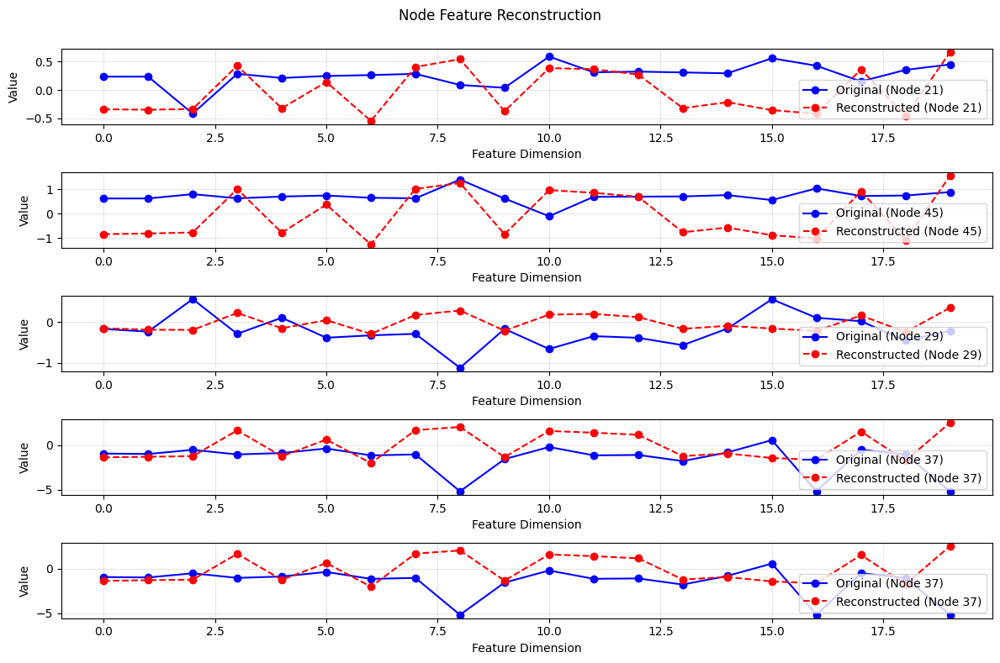

Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:00<00:00, 12639.33it/s]


Completed. Cached 10201 / 10201 points.


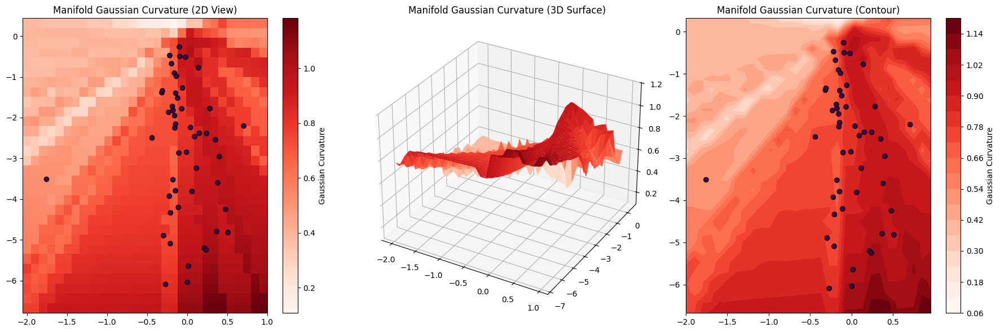

In [10]:
visualize_node_features_reconstruction(model_phase2, single_graph, sample_features=dimP)
with torch.no_grad():
    x = single_graph.x.to(device)
    edge_index = single_graph.edge_index.to(device)
    latent_mu2 = model_phase2.encode(x, edge_index=edge_index)

model_phase2.get_latent_manifold().visualize_manifold_curvature(data_points=latent_mu2[0])

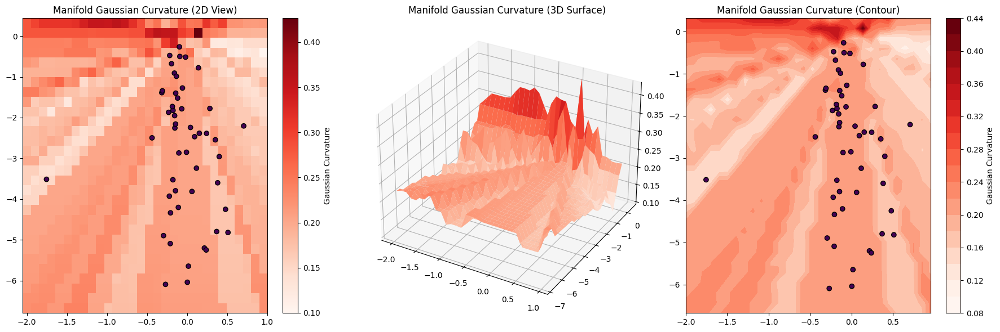

In [15]:
model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_mu2[0])

In [11]:
history_phase2.keys()

dict_keys(['total_loss', 'kl_loss', 'recon_loss', 'decoder_losses', 'detailed_losses'])

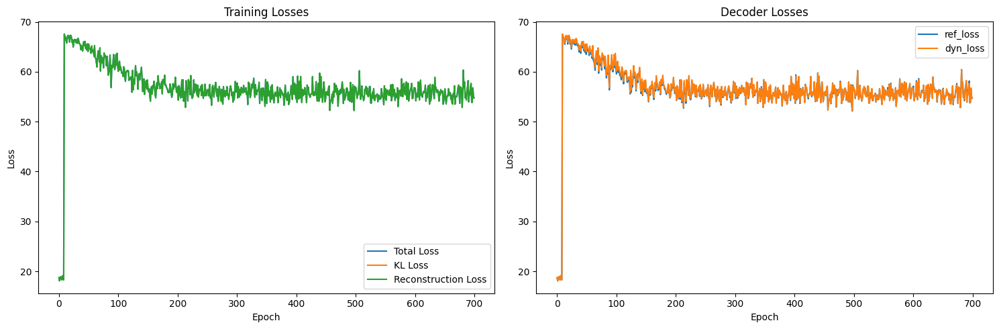

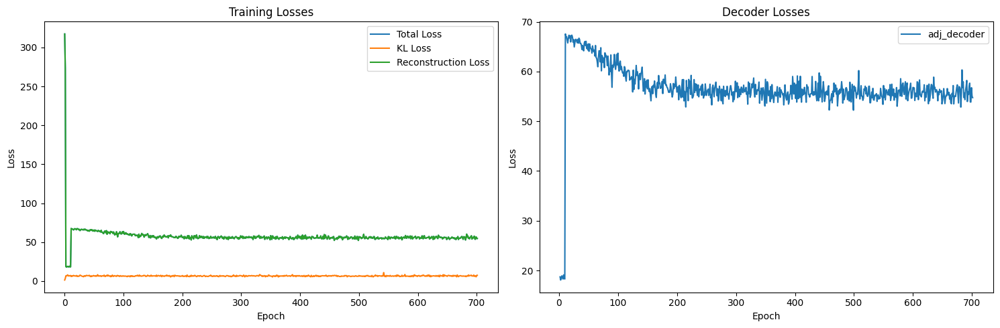

In [12]:
# Combine histories
combined_history = {
    "phase1": history_phase1,
    "phase2": history_phase2
}
visualize_training({"recon_loss": history_phase2["recon_loss"], "kl_loss": [], "decoder_losses": {'ref_loss': history_phase2["detailed_losses"]["adj_decoder"]["ref_loss"], 'dyn_loss': history_phase2["detailed_losses"]["adj_decoder"]["base_loss"]}, "total_loss": history_phase2["total_loss"]})

merged_history = {}
for key in history_phase1.keys():
  if isinstance(history_phase1[key], list):
    merged_history[key] = history_phase1[key] + history_phase2[key]
  else:
     merged_history[key] = dict()
     #for key2 in history_phase1[key].keys():
        #merged_history[key][key2] = history_phase1[key][key2] + history_phase2[key][key2]
      
     for key2 in history_phase2[key].keys():
        if key2 not in history_phase1[key].keys():
          merged_history[key][key2] = [np.nan]*len(history_phase1["kl_loss"]) + history_phase2[key][key2]

visualize_training(merged_history)


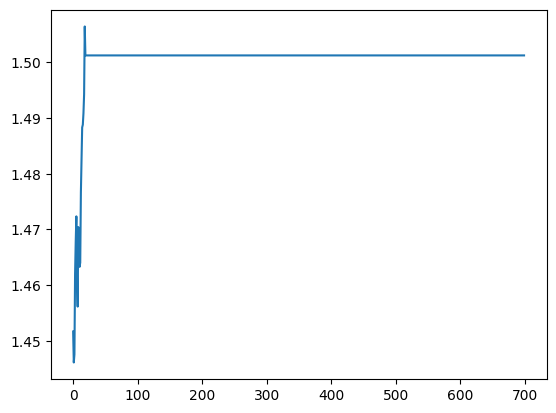

In [13]:
plt.plot(history_phase2["detailed_losses"]["adj_decoder"]["sigma"])

In [ ]:
with torch.no_grad():
    if distance_mode == "linear_interpolation":
        dists_phase2 = model_phase2.get_latent_manifold().create_riemannian_distance_matrix(latent_points, 
                                                                                            DistanceApproximations.linear_interpolation_distance, num_points=20)
    elif distance_mode == "dijkstra":
        dists_phase2 = model_phase2.get_latent_manifold().get_grid_as_graph().compute_shortest_paths(
                            latent_points,
                            weight_type="geodesic",  # Uses your metric tensors
                            max_grid_neighbors=8,     # Connect to up to 8 nearest grid nodes
                            num_threads=6
                        )
        

Calculating 800745 pairwise Riemannian distances using linear_interpolation_distance (batch mode)...


Computing distances in batches: 100%|██████████| 100094/100094 [00:15<00:00, 6428.83it/s]

Distance matrix calculation complete.


In [ ]:
resolution = 30
bounds_np = model_phase1.get_latent_manifold().get_bounds().cpu().numpy()
plot_z1 = np.linspace(bounds_np[0, 0], bounds_np[0, 1], resolution)
plot_z2 = np.linspace(bounds_np[1, 0], bounds_np[1, 1], resolution)

Z1_np, Z2_np = np.meshgrid(plot_z1, plot_z2)
Z1, Z2 = torch.from_numpy(Z1_np), torch.from_numpy(Z2_np)
            
curvature_phase1 = torch.zeros((resolution, resolution))
curvature_phase2 = torch.zeros((resolution, resolution))

            
for i in range(resolution):
    for j in range(resolution):
        z = torch.stack([Z1[i, j], Z2[i, j]])
        clamped_z = model_phase1.get_latent_manifold()._clamp_point_to_bounds(z)
        try:
            curv_val_1 = model_phase1.get_latent_manifold().compute_gaussian_curvature(model_phase1.get_latent_manifold().metric_tensor(clamped_z))
            curvature_phase1[i, j] = curv_val_1
        except (ValueError, RuntimeError) as e:
            print(f"Error computing curvature at point {z}: {e}. Setting to NaN.")
            curvature_phase1[i, j] = torch.nan

        try:
            curv_val_2 = model_phase2.get_latent_manifold().compute_gaussian_curvature(model_phase2.get_latent_manifold().metric_tensor(clamped_z))
            curvature_phase2[i, j] = curv_val_2
        except (ValueError, RuntimeError) as e:
            print(f"Error computing curvature at point {z}: {e}. Setting to NaN.")
            curvature_phase2[i, j] = torch.nan
        

/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_56961/2181829663.py:37: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax1.scatter(points_np[:, 0], points_np[:, 1], cmap='viridis', edgecolors='k')
/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_56961/2181829663.py:38: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax3.scatter(points_np[:, 0], points_np[:, 1], cmap='viridis', edgecolors='k')


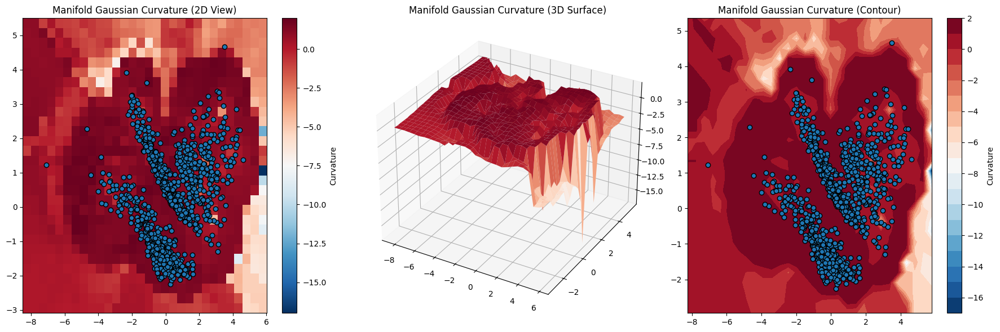

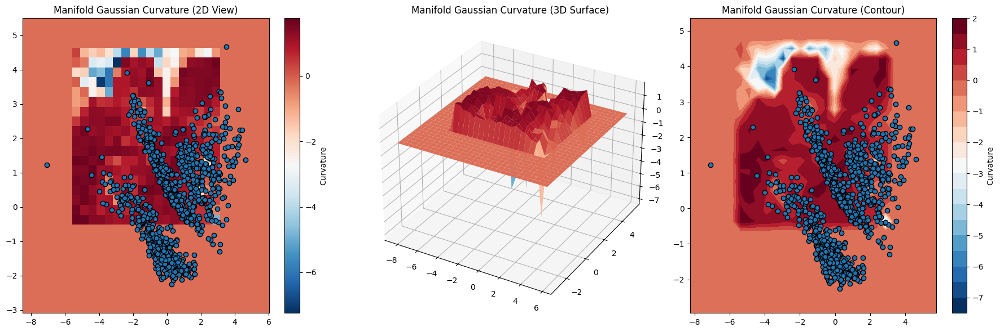

In [ ]:
import matplotlib.colors as mpcolors
curvature_diff = (curvature_phase1 - curvature_phase2)/(curvature_phase1 + 1e-8)
curvature_diff = curvature_diff.detach().numpy()

def plot_curv_diff(curvature_diff):
    curvature_diff -= np.mean(curvature_diff)

                
    # --- Plotting Code (using Matplotlib as before) ---
    fig = plt.figure(figsize=(18, 6))
    # ... (The plotting logic is identical, just using the _np versions of arrays)
    vmin, vmax = np.nanmin(curvature_diff), np.nanmax(curvature_diff)
    if np.isnan(vmin) or np.isnan(vmax) or vmin == vmax: vmin, vmax = -1, 1
    norm = mpcolors.Normalize(vmin=vmin, vmax=vmax)
    if vmin < 0 and vmax > 0:
        cmap = 'RdBu_r'
    elif vmin < 0 and vmax <= 0:
        cmap = 'Blues_r'
    else:
        cmap = 'Reds'

    ax1 = fig.add_subplot(131)
    im = ax1.pcolormesh(Z1_np, Z2_np, curvature_diff, cmap=cmap, norm=norm, shading='auto')
    ax1.set_title('Manifold Gaussian Curvature (2D View)')
    plt.colorbar(im, ax=ax1, label='Curvature')

    ax2 = fig.add_subplot(132, projection='3d')
    ax2.plot_surface(Z1_np, Z2_np, curvature_diff, cmap=cmap, norm=norm)
    ax2.set_title('Manifold Gaussian Curvature (3D Surface)')

    ax3 = fig.add_subplot(133)
    contour = ax3.contourf(Z1_np, Z2_np, curvature_diff, 20, cmap=cmap, norm=norm)
    ax3.set_title('Manifold Gaussian Curvature (Contour)')
    plt.colorbar(contour, ax=ax3, label='Curvature')

    points_np = latent_points.detach().cpu().numpy()
    ax1.scatter(points_np[:, 0], points_np[:, 1], cmap='viridis', edgecolors='k')
    ax3.scatter(points_np[:, 0], points_np[:, 1], cmap='viridis', edgecolors='k')

    plt.tight_layout()
    plt.show()

plot_curv_diff(curvature_diff)

curvature_diff2 = np.zeros_like(curvature_diff)
len1 = curvature_diff.shape[0]
len2 = curvature_diff.shape[1]
curvature_diff2[int(len1*0.3):int(len1*0.9), int(len2*0.2):int(len2*0.8)] = curvature_diff[int(len1*0.3):int(len1*0.9), int(len2*0.2):int(len2*0.8)]
plot_curv_diff(curvature_diff2)


/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_56961/904148318.py:10: RuntimeWarning: invalid value encountered in divide
  res3 = ((local_dists_phase1 - dists_phase2)/local_dists_phase1)


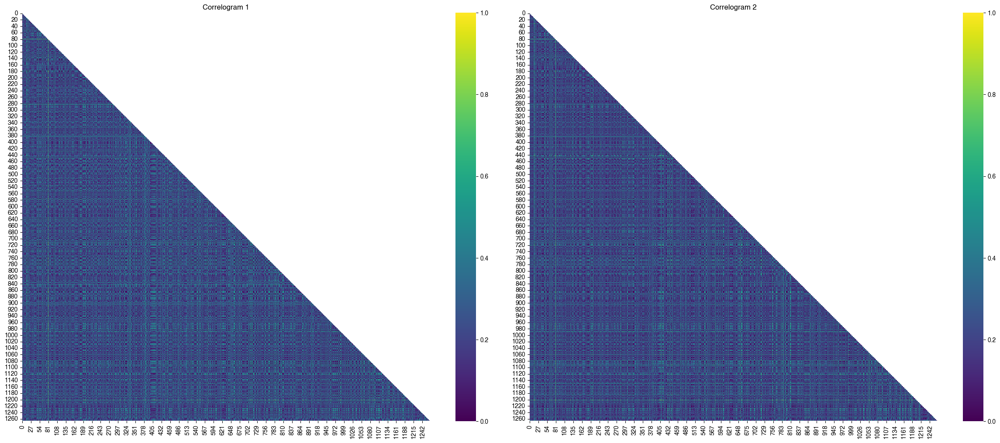

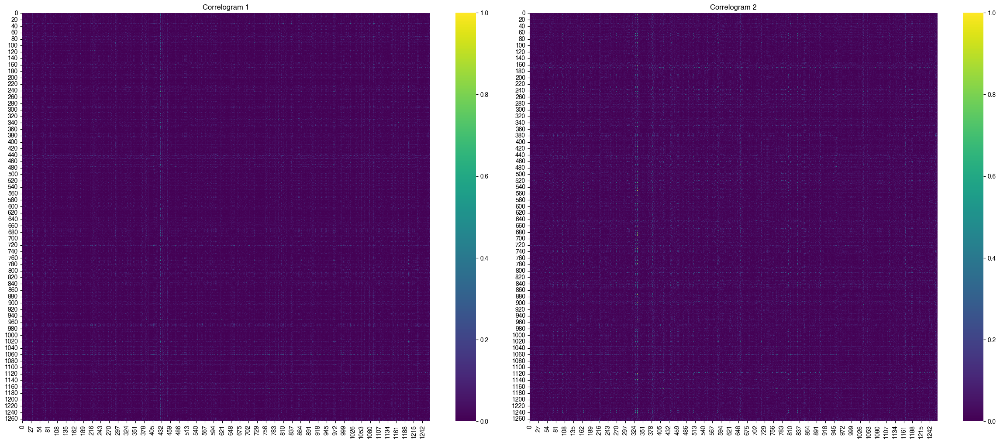

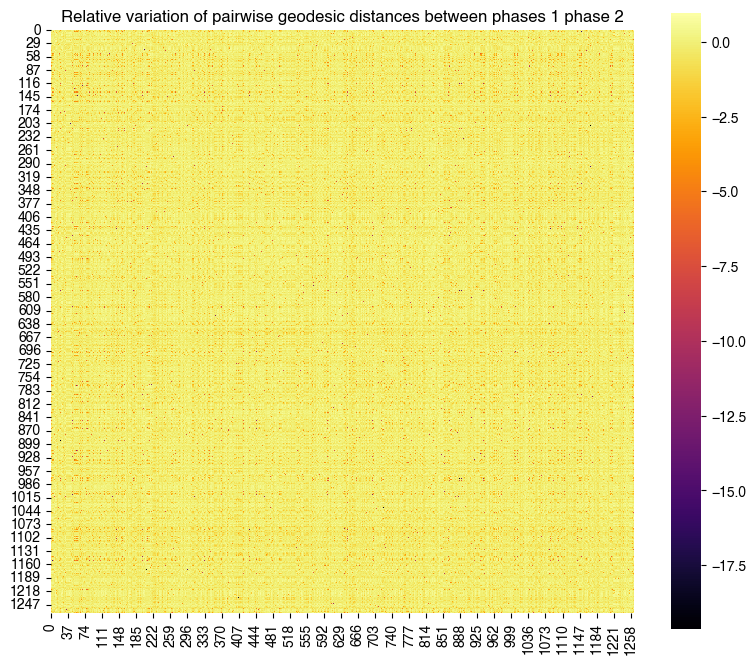

In [ ]:
if isinstance(dists_phase1, torch.Tensor):
    dists_phase1 = dists_phase1.detach().numpy()
if isinstance(dists_phase2, torch.Tensor):
    dists_phase2 = dists_phase2.detach().numpy()

local_dists_phase1 = dists_phase1
if distance_mode == "dijkstra":
    local_dists_phase1 = dists_phase1_dijkstra.detach().numpy()
res = np.abs((local_dists_phase1 - dists_phase2))
res3 = ((local_dists_phase1 - dists_phase2)/local_dists_phase1)
#res3 = np.abs((local_dists_phase1 - dists_phase2)/local_dists_phase1)
res3 = np.nan_to_num(res3, 0)

res3_z = (res3 - np.mean(res3))/np.sqrt(np.var(res3))

res2 = np.abs((local_dists_phase1/np.max(np.where(local_dists_phase1 > 0, local_dists_phase1, 0)) - dists_phase2/np.max(np.where(dists_phase2 > 0, dists_phase2, 0))))

_ = plot_correlogram(local_dists_phase1/np.max(np.where(local_dists_phase1 > 0, local_dists_phase1, 0)), dists_phase2/np.max(np.where(dists_phase2 > 0, dists_phase2, 0)), remove_diagonal=True, triangular=True)

_ = plot_correlogram((res/np.max(res))**2, (res2/np.max(res2))**2)
_ = plot_correlogram(res3, cmap="inferno", titles=["Relative variation of pairwise geodesic distances between phases 1 phase 2"],
                     savefile="dists_var_phase1_2" )

In [ ]:
for i in [0,2, 4, 5, 9, 10, 11, 14, 15, 16, 17, 18, 19]:
    print(cols_to_norm[i])

NameError: name 'cols_to_norm' is not defined

In [ ]:
x.shape[1]

(1266, 13)

In [ ]:
import statsmodels.api as sm

# Knowing that x is:
cols_to_norm = [
    "p20_pop", "p14_pop", "superf", "p20_men", "naisd22", "decesd22",
    "p20_log", "p20_rp", "p20_rsecocc", "p20_logvac", "med20",
    "p20_emplt", "p20_emplt_sal", "p14_emplt", "ettot21", "etaz21",
    "etbe21", "etfz21", "etgu21", "ettefp1021"
]

x = single_graph.x[:, [0,2, 4, 5, 9, 10, 11, 15, 16, 17, 18, 19]].numpy()
x = sm.add_constant(x)
y = res3_z.sum(axis=1).flatten()

model = sm.OLS(y,x)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.273
Model:                            OLS   Adj. R-squared:                  0.266
Method:                 Least Squares   F-statistic:                     39.14
Date:                Thu, 02 Oct 2025   Prob (F-statistic):           3.10e-78
Time:                        21:27:00   Log-Likelihood:                -8955.9
No. Observations:                1266   AIC:                         1.794e+04
Df Residuals:                    1253   BIC:                         1.800e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -49.2990     11.509     -4.283      0.0

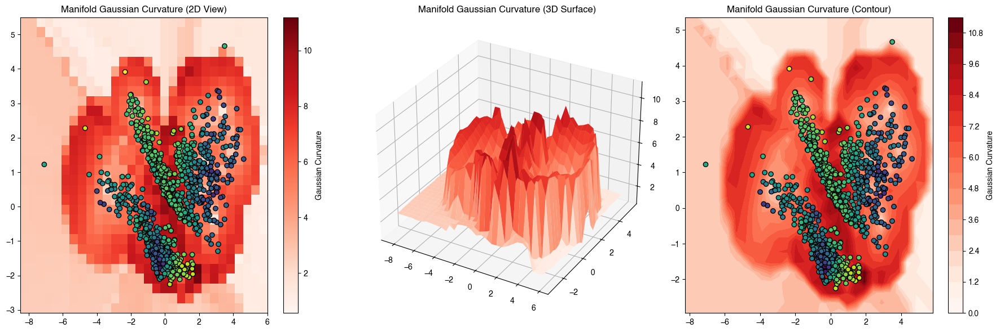

In [ ]:
model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points, labels=(torch.tensor(res3.sum(axis=1))))

In [ ]:
import numpy as np

y = res3_z
n = y.shape[0]
pairs = np.triu_indices(n, k=1)  # upper triangle without diagonal
y_pairs = y[pairs]

X_pairs = []
for i, j in zip(*pairs):
    xi, xj = x[i, 1:], x[j, 1:]  # drop constant from original x
    # build symmetric regressors
    feats = np.concatenate([xi + xj, np.abs(xi - xj)])
    X_pairs.append(feats)

X_pairs = np.array(X_pairs)
X_pairs = sm.add_constant(X_pairs)

model = sm.OLS(y_pairs, X_pairs)
results = model.fit()
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.120
Model:                            OLS   Adj. R-squared:                  0.120
Method:                 Least Squares   F-statistic:                     4566.
Date:                Thu, 02 Oct 2025   Prob (F-statistic):               0.00
Time:                        21:27:10   Log-Likelihood:            -1.0851e+06
No. Observations:              800745   AIC:                         2.170e+06
Df Residuals:                  800720   BIC:                         2.171e+06
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.3318      0.003   -110.203      0.0

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm

y = res3_z
n = y.shape[0]
pairs = np.triu_indices(n, k=1)  # upper triangle
y_pairs = y[pairs]

# original feature names you actually used
cols = [
    "p20_pop", "p14_pop", "superf", "p20_men", "naisd22", "decesd22",
    "p20_log", "p20_rp", "p20_rsecocc", "p20_logvac", "med20",
    "p20_emplt", "p20_emplt_sal", "p14_emplt", "ettot21", "etaz21",
    "etbe21", "etfz21", "etgu21", "ettefp1021"
]

X_pairs = []
for i, j in zip(*pairs):
    xi, xj = x[i, 1:], x[j, 1:]  # drop constant
    feats = np.concatenate([xi + xj, np.abs(xi - xj)])
    X_pairs.append(feats)

X_pairs = np.array(X_pairs)

# Build names dynamically
sum_cols = [f"{c}_sum" for c in cols[:X_pairs.shape[1] // 2]]
diff_cols = [f"{c}_absdiff" for c in cols[:X_pairs.shape[1] // 2]]
regressor_names = ["const"] + sum_cols + diff_cols

# Add constant AFTER naming
X_pairs = sm.add_constant(X_pairs)

# Double-check match
assert X_pairs.shape[1] == len(regressor_names), \
    f"Mismatch: {X_pairs.shape[1]} vs {len(regressor_names)}"

# Fit with clustering
i_idx, j_idx = pairs
clusters = pd.Series(i_idx)  # cluster by first node

model = sm.OLS(y_pairs, X_pairs)
results = model.fit(cov_type="cluster", cov_kwds={"groups": clusters})

print(results.summary(xname=regressor_names))


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.120
Model:                            OLS   Adj. R-squared:                  0.120
Method:                 Least Squares   F-statistic:                     227.3
Date:                Thu, 02 Oct 2025   Prob (F-statistic):               0.00
Time:                        21:27:16   Log-Likelihood:            -1.0851e+06
No. Observations:              800745   AIC:                         2.170e+06
Df Residuals:                  800720   BIC:                         2.171e+06
Df Model:                          24                                         
Covariance Type:              cluster                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  -0.3318    

In [ ]:
import pandas as pd

# Pairs
i_idx, j_idx = pairs
clusters = pd.Series(i_idx)  # cluster by first node of the pair

model = sm.OLS(y_pairs, X_pairs)
results = model.fit(
    cov_type="cluster",
    cov_kwds={"groups": clusters}
)

results.summary(xname=regressor_names)

from linearmodels.iv import IV2SLS

df = pd.DataFrame(X_pairs, columns=regressor_names)
df["y"] = y_pairs
df["i"] = i_idx
df["j"] = j_idx

model = IV2SLS.from_formula(
    "y ~ 1 + " + " + ".join(sum_cols + diff_cols),
    data=df
)

# two-way clustering by i and j
res = model.fit(cov_type="clustered", clusters=df[["i", "j"]])
print(res.summary)


                            OLS Estimation Summary                            
Dep. Variable:                      y   R-squared:                      0.1204
Estimator:                        OLS   Adj. R-squared:                 0.1203
No. Observations:              800745   F-statistic:                    2676.7
Date:                Thu, Oct 02 2025   P-value (F-stat)                0.0000
Time:                        21:27:29   Distribution:                 chi2(24)
Cov. Estimator:             clustered                                         
                                                                              
                                  Parameter Estimates                                  
                     Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
---------------------------------------------------------------------------------------
Intercept              -0.3318     0.0341    -9.7204     0.0000     -0.3987     -0.2649
p20_pop_sum     

In [ ]:
import pandas as pd

def classify_pairwise_regression(results, regressor_names, alpha=0.05):
    """
    Classify pairwise regression coefficients into categories:
    - Convergence drivers
    - Divergence drivers
    - Homophily
    - Heterophily
    Only coefficients with p < alpha are considered significant.
    """

    coef = results.params
    df = pd.DataFrame({
        "regressor": regressor_names,
        "coef": coef,
        "pval": results.pvalues
    })

    # keep only significant variables
    df_sig = df[df["pval"] < alpha]

    categories = {"convergence": [], "divergence": [], "homophily": [], "heterophily": []}

    for _, row in df_sig.iterrows():
        name, c = row["regressor"], row["coef"]

        if name.endswith("_sum"):
            if c > 0:
                categories["convergence"].append((name, c))
            elif c < 0:
                categories["divergence"].append((name, c))

        elif name.endswith("_absdiff"):
            if c > 0:
                categories["heterophily"].append((name, c))
            elif c < 0:
                categories["homophily"].append((name, c))

    # Print with explanations
    print("\nInterpretation of regression results (significant at p < {}):".format(alpha))
    print("• Convergence: positive _sum → larger joint values reduce relative distance.")
    print("• Divergence: negative _sum → larger joint values increase relative distance.")
    print("• Homophily: negative _absdiff → similarity reduces distance.")
    print("• Heterophily: positive _absdiff → dissimilarity reduces distance.\n")

    for cat, vars_ in categories.items():
        if vars_:
            print(f"{cat.capitalize()} drivers:")
            for name, coef in vars_:
                print(f"  - {name}: {coef:.4f}")
            print("")

    return categories, df, df_sig

classify_pairwise_regression(results, regressor_names)


Interpretation of regression results (significant at p < 0.05):
• Convergence: positive _sum → larger joint values reduce relative distance.
• Divergence: negative _sum → larger joint values increase relative distance.
• Homophily: negative _absdiff → similarity reduces distance.
• Heterophily: positive _absdiff → dissimilarity reduces distance.

Convergence drivers:
  - p14_pop_sum: 0.0203
  - decesd22_sum: 0.0110
  - p20_rsecocc_sum: 0.0261
  - p20_logvac_sum: 0.0205
  - p20_emplt_sum: 0.0768

Divergence drivers:
  - naisd22_sum: -0.0354
  - p20_log_sum: -0.0764
  - p20_rp_sum: -0.0458

Homophily drivers:
  - superf_absdiff: -0.0744
  - p20_men_absdiff: -0.0628
  - p20_rp_absdiff: -0.0169
  - p20_logvac_absdiff: -0.0226
  - med20_absdiff: -0.0406

Heterophily drivers:
  - p20_pop_absdiff: 0.3334
  - p20_rsecocc_absdiff: 0.0591
  - p20_emplt_absdiff: 0.0643



({'convergence': [('p14_pop_sum', 0.02030996051910961),
   ('decesd22_sum', 0.011003305115550392),
   ('p20_rsecocc_sum', 0.026143341571153337),
   ('p20_logvac_sum', 0.0205268253152861),
   ('p20_emplt_sum', 0.07675159972855268)],
  'divergence': [('naisd22_sum', -0.03537305789597541),
   ('p20_log_sum', -0.07644807456642047),
   ('p20_rp_sum', -0.04575281037960821)],
  'homophily': [('superf_absdiff', -0.07443572714301952),
   ('p20_men_absdiff', -0.06280661192026615),
   ('p20_rp_absdiff', -0.016886758244594603),
   ('p20_logvac_absdiff', -0.02256235795318368),
   ('med20_absdiff', -0.040586138828265235)],
  'heterophily': [('p20_pop_absdiff', 0.3333739585021454),
   ('p20_rsecocc_absdiff', 0.059071960238514055),
   ('p20_emplt_absdiff', 0.06434504888014571)]},
               regressor      coef           pval
 0                 const -0.331758   9.525422e-43
 1           p20_pop_sum -0.013241   6.553347e-01
 2           p14_pop_sum  0.020310   3.569925e-04
 3            superf_sum 

In [ ]:
torch.save(model_phase1.state_dict(), 'model_phase1_geo.pth')
torch.save(model_phase1.state_dict(), 'model_phase2_geo.pth')


### Original distances

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm


y = adjacency_matrix
x = p_vectors_array[:, [0,2, 4, 5, 9, 10, 11, 15, 16, 17, 18, 19]]
x = sm.add_constant(x)
n = y.shape[0]
pairs = np.triu_indices(n, k=1)  # upper triangle
y_pairs = y[pairs]

# original feature names you actually used
cols = [
    "p20_pop", "p14_pop", "superf", "p20_men", "naisd22", "decesd22",
    "p20_log", "p20_rp", "p20_rsecocc", "p20_logvac", "med20",
    "p20_emplt", "p20_emplt_sal", "p14_emplt", "ettot21", "etaz21",
    "etbe21", "etfz21", "etgu21", "ettefp1021"
]

X_pairs = []
for i, j in zip(*pairs):
    xi, xj = x[i, 1:], x[j, 1:]  # drop constant
    feats = np.concatenate([xi + xj, np.abs(xi - xj)])
    X_pairs.append(feats)

X_pairs = np.array(X_pairs)

# Build names dynamically
sum_cols = [f"{c}_sum" for c in cols[:X_pairs.shape[1] // 2]]
diff_cols = [f"{c}_absdiff" for c in cols[:X_pairs.shape[1] // 2]]
regressor_names = ["const"] + sum_cols + diff_cols

# Add constant AFTER naming
X_pairs = sm.add_constant(X_pairs)

# Double-check match
assert X_pairs.shape[1] == len(regressor_names), \
    f"Mismatch: {X_pairs.shape[1]} vs {len(regressor_names)}"

# Fit with clustering
i_idx, j_idx = pairs
clusters = pd.Series(i_idx)  # cluster by first node

model = sm.OLS(y_pairs, X_pairs)
results = model.fit(cov_type="cluster", cov_kwds={"groups": clusters})

print(results.summary(xname=regressor_names))


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     5.412
Date:                Thu, 25 Sep 2025   Prob (F-statistic):           1.39e-15
Time:                        17:57:05   Log-Likelihood:             2.8533e+06
No. Observations:              800745   AIC:                        -5.707e+06
Df Residuals:                  800720   BIC:                        -5.706e+06
Df Model:                          24                                         
Covariance Type:              cluster                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.0004   5

In [ ]:
import pandas as pd

# Pairs
i_idx, j_idx = pairs
clusters = pd.Series(i_idx)  # cluster by first node of the pair

model = sm.OLS(y_pairs, X_pairs)
results = model.fit(
    cov_type="cluster",
    cov_kwds={"groups": clusters}
)

results.summary(xname=regressor_names)

from linearmodels.iv import IV2SLS

df = pd.DataFrame(X_pairs, columns=regressor_names)
df["y"] = y_pairs
df["i"] = i_idx
df["j"] = j_idx

model = IV2SLS.from_formula(
    "y ~ 1 + " + " + ".join(sum_cols + diff_cols),
    data=df
)

# two-way clustering by i and j
res = model.fit(cov_type="clustered", clusters=df[["i", "j"]])
print(res.summary)

                            OLS Estimation Summary                            
Dep. Variable:                      y   R-squared:                      0.0031
Estimator:                        OLS   Adj. R-squared:                 0.0031
No. Observations:              800745   F-statistic:                    115.83
Date:                Thu, Sep 25 2025   P-value (F-stat)                0.0000
Time:                        17:58:24   Distribution:                 chi2(24)
Cov. Estimator:             clustered                                         
                                                                              
                                  Parameter Estimates                                  
                     Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
---------------------------------------------------------------------------------------
Intercept               0.0004  7.647e-05     4.8853     0.0000      0.0002      0.0005
p20_pop_sum     

In [ ]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

class PlotlyNodeViewer:
    def __init__(self, single_graph, model_phase1, latent_points, names):
        self.single_graph = single_graph
        self.model_phase1 = model_phase1
        self.latent_points = latent_points
        self.names = names
        self.num_nodes = len(names)
        
        # Create subplot figure
        self.fig = make_subplots(
            rows=1, cols=2,
            subplot_titles=('Node Reconstruction', 'Points on Manifold - Click to Select'),
            horizontal_spacing=0.1
        )
        
        # Initial selected index
        self.selected_idx = 0
        
        # Add manifold scatter plot
        points_np = self.latent_points.detach().cpu().numpy()
        
        self.fig.add_trace(
            go.Scatter(
                x=points_np[:, 0],
                y=points_np[:, 1],
                mode='markers',
                marker=dict(size=8, color='lightblue', line=dict(width=1, color='black')),
                text=[f"{i}: {name}" for i, name in enumerate(self.names)],
                hovertemplate='<b>%{text}</b><br>X: %{x:.3f}<br>Y: %{y:.3f}<extra></extra>',
                name='Nodes'
            ),
            row=1, col=2
        )
        
        # Highlight selected point
        self.fig.add_trace(
            go.Scatter(
                x=[points_np[0, 0]],
                y=[points_np[0, 1]],
                mode='markers',
                marker=dict(size=12, color='red', line=dict(width=2, color='darkred')),
                name='Selected',
                showlegend=False
            ),
            row=1, col=2
        )
        
        # Add initial reconstruction
        self.update_reconstruction(0)
        
        # Set up click callback
        self.fig.data[0].on_click(self.on_click)
        
        # Update layout
        self.fig.update_layout(
            title='Interactive Node Reconstruction Viewer',
            height=500,
            showlegend=True
        )
        
        self.fig.show()
    
    def on_click(self, trace, points, selector):
        """Handle click events on scatter plot"""
        if points.point_inds:
            self.selected_idx = points.point_inds[0]
            
            # Update highlight position
            points_np = self.latent_points.detach().cpu().numpy()
            self.fig.data[1].x = [points_np[self.selected_idx, 0]]
            self.fig.data[1].y = [points_np[self.selected_idx, 1]]
            
            # Update reconstruction
            self.update_reconstruction(self.selected_idx)
    
    def update_reconstruction(self, idx):
        """Update reconstruction plot"""
        # Get original and reconstructed data
        a = self.single_graph.x[idx]
        a_r = self.model_phase1(self.single_graph.x[idx].unsqueeze(0))
        
        original = a.detach().cpu().numpy()
        reconstructed = a_r["outputs"]["node_attr_decoder"]["node_features"].detach().squeeze().cpu().numpy()
        
        # Remove existing reconstruction traces if any
        traces_to_remove = []
        for i, trace in enumerate(self.fig.data):
            if trace.name in ['Original', 'Reconstructed']:
                traces_to_remove.append(i)
        
        for i in reversed(traces_to_remove):
            self.fig.data = self.fig.data[:i] + self.fig.data[i+1:]
        
        # Add new reconstruction traces
        x_vals = list(range(len(original)))
        
        self.fig.add_trace(
            go.Scatter(
                x=x_vals,
                y=original,
                mode='lines+markers',
                name='Original',
                line=dict(color='blue', width=2),
                marker=dict(size=6)
            ),
            row=1, col=1
        )
        
        self.fig.add_trace(
            go.Scatter(
                x=x_vals,
                y=reconstructed,
                mode='lines+markers',
                name='Reconstructed',
                line=dict(color='orange', width=2, dash='dash'),
                marker=dict(size=6, symbol='square')
            ),
            row=1, col=1
        )
        
        # Update subplot title
        self.fig.layout.annotations[0].text = f'Reconstruction: {idx} - {self.names[idx]}'


# Even simpler version using Plotly widgets
def create_simple_plotly_viewer(single_graph, model_phase1, latent_points, names):
    """Simple function-based approach"""
    import ipywidgets as widgets
    from IPython.display import display
    
    def plot_reconstruction(idx):
        # Get data
        a = single_graph.x[idx]
        a_r = model_phase1(single_graph.x[idx].unsqueeze(0))
        
        original = a.detach().cpu().numpy()
        reconstructed = a_r["outputs"]["node_attr_decoder"]["node_features"].detach().squeeze().cpu().numpy()
        points_np = latent_points.detach().cpu().numpy()
        
        # Create subplots
        fig = make_subplots(
            rows=1, cols=2,
            subplot_titles=(f'Reconstruction: {idx} - {names[idx]}', 'Points on Manifold')
        )
        
        # Reconstruction plot
        x_vals = list(range(len(original)))
        fig.add_trace(
            go.Scatter(x=x_vals, y=original, mode='lines+markers', 
                      name='Original', line=dict(color='blue')),
            row=1, col=1
        )
        fig.add_trace(
            go.Scatter(x=x_vals, y=reconstructed, mode='lines+markers',
                      name='Reconstructed', line=dict(color='orange', dash='dash')),
            row=1, col=1
        )
        
        # Manifold plot with highlight
        colors = ['red' if i == idx else 'lightblue' for i in range(len(points_np))]
        sizes = [12 if i == idx else 8 for i in range(len(points_np))]
        
        fig.add_trace(
            go.Scatter(
                x=points_np[:, 0], y=points_np[:, 1],
                mode='markers',
                marker=dict(size=sizes, color=colors, line=dict(width=1, color='black')),
                text=[f"{i}: {name}" for i, name in enumerate(names)],
                hovertemplate='<b>%{text}</b><br>X: %{x:.3f}<br>Y: %{y:.3f}<extra></extra>',
                showlegend=False
            ),
            row=1, col=2
        )
        
        fig.update_layout(height=500, title='Node Reconstruction Viewer')
        fig.show()
    
    # Create slider widget
    slider = widgets.IntSlider(
        value=0,
        min=0,
        max=len(names)-1,
        step=1,
        description='Node:',
        continuous_update=False
    )
    
    # Create interactive widget
    interactive_plot = widgets.interactive(plot_reconstruction, idx=slider)
    display(interactive_plot)
    
    return interactive_plot

# Usage:
# Method 1 - Click-based (more advanced):
#viewer = PlotlyNodeViewer(single_graph, model_phase1, latent_points, names)

# Method 2 - Slider-based (simpler, guaranteed to work):
interactive_plot = create_simple_plotly_viewer(single_graph, model_phase1, latent_points, names)

interactive(children=(IntSlider(value=0, continuous_update=False, description='Node:', max=1265), Output()), _…